<a id="4"></a>
<h1 style="background-color:#ffcc99;font-family:Baloo Da;font-size:200%;text-align:left">Home Credit Default Risk</h1>

**Can you predict how capable each applicant is of repaying a loan?**

<a id="4"></a>
<h1 style="background-color:#16DCC9;font-family:Baloo Da;font-size:200%;text-align:left">Briefing</h1>

**Problem:** Many people struggle to get loans due to insufficient or non-existent credit histories. Unfortunately, these individuals are sometimes targeted by **unreliable lenders**. 

**Customer:** **Home Credit** is a company that provides loans to people. They use different statistical and machine learning techniques to predict whether a person will be able to repay the loan. However, they want to improve their predictions even more. So, they are asking participants in the Kaggle competition to help them analyze their data and come up with better ways to assess loan applicants. This will help Home Credit approve loans for deserving individuals and provide loan terms that set them up for success.

**Dataset** (https://www.kaggle.com/competitions/home-credit-default-risk/data)

**Goal:** To predict how capable each applicant is of repaying a loan

**Metrics:** 
- Use AUC-ROC to pick the best model.
- Keep precision score close to 100%. Precision = TN/(TN+FN) for negative class
- Maximize recall as well 
- Maximize profit

**Input:** 121 features

**Output:** Target (0,1)
- 1: High default risk (people with difficulties to pay loan)
- 0: Low default risk (other cases)

**Benchmark**:Historical home loan default rate in the US.
- if our precision score is 95%, which means FN/(TN+FN)=5% which is the default rate of our model.

<h1 style="background-color:#16DCC9;font-family:Calibri;font-size:200%;text-align:left">Proposed Solution</h1>

I will follow these steps to build a classification model with the provided dataset:

1. Data examination
    - Feature columns; missing values; target label
2. EDA
    - Univariate analysis on numerical columns and categrical columns
    - Multivariate analysis
    - Feature selection using statistical method and algorithm based method (RFECV)
3. Modelling
    - Pipeline
    - LightGBM, XGBoost, Random Forest, Logistic Regression
4. Assignment question answers

In [128]:
# pip install jupyter_contrib_nbextensions && jupyter contrib nbextension install

<a id="4"></a>
<h1 style="background-color:#16DCC9;font-family:Calibri;font-size:200%;text-align:left">Data Quality</h1>

<a id='Load_Libraries'></a>
<h2 style="color:blue">Load Libraries</h2>

In [1]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
import os

import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import gaussian_kde
import missingno as msno

from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

# to visualize all the columns 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import warnings
warnings.filterwarnings('ignore')

# Enable inline figure display
%matplotlib inline

<a id='Read_Dataset'></a>
<h2 style="color:blue">Overall of the Datasets</h2>

In [2]:
df = pd.read_csv("application_train.csv")
app_test = pd.read_csv("application_test.csv")

In [3]:
print('Size of application_train data', df.shape)
print('Size of application_test data', app_test.shape)

Size of application_train data (307511, 122)
Size of application_test data (48744, 121)


In [305]:
# Info of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [5]:
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

### A quick EDA of data with Pandas Profiling

**The pandas-profiling library generates a report having:**
- An overview of the dataset
- Variable properties
- Interaction of variables
- Correlation of variables
- Missing values
- Sample data

**The main disadvantage of pandas profiling is its use with large datasets (for this dataset, I can not generate the report for 1000 samples selected)( Summarize dataset step is very slow. Speed is almost the same to use 1000 samples or 10000 samples. I keep getting warning for running out of memory. system eventually died)**
- One way to solve this problem is to generate the report from only a part of all the data we have.
- Another alternative is to use the minimum mode that was introduced in version 2.4 of pandas profiling. 

In [156]:
# import ydata_profiling

In [157]:
from pandas_profiling import ProfileReport
profile = ProfileReport(df, minimal=True)
profile.to_file(output_file="output_min.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [158]:
from IPython.display import IFrame

# specify path to output_min.html file
filepath = "output_min.html"

# display report in the notebook
IFrame(filepath, width=1000, height=400)

### A quick EDA of data with D-Tale


D-Tale is an open-source python auto-visualization library. It is one of the best auto data-visualization libraries. D-Tale helps you to get a detailed EDA of the data. It also has a feature of code export, for every plot or analysis in the report.

The dtale library generates a report having:
- An overview of the dataset
- Custom filters
- Correlation, Charts, and Heatmaps
- Highlight datatypes, missing values, ranges
- Code export

In [159]:
import dtale

In [160]:
dtale.show(df)

<a id='Data_Quality'></a>
<h2 style="color:blue">Feature Description</h2>

<a id='Data_Quality'></a>
<h3 style="color:blue">Target</h2>

In [6]:
df['TARGET'].value_counts()

TARGET
0    282686
1     24825
Name: count, dtype: int64

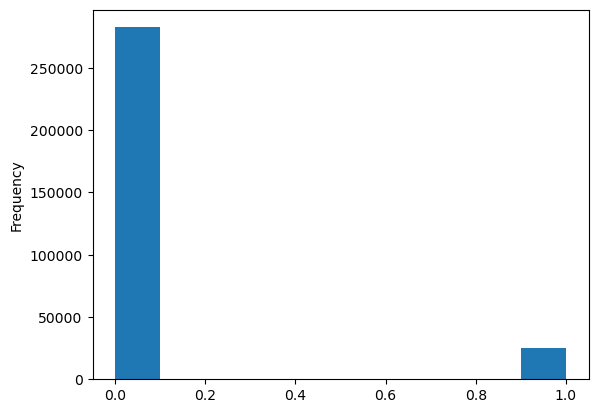

In [7]:
df['TARGET'].astype(int).plot.hist();

**Compared to the existing records, nearly 92% of poeple are good candidates**

<a id='Data_Quality'></a>
<h3 style="color:blue">Categorical columns</h2>

In [8]:
# Count nemeric and categorical features
categorical_features = [col for col in df.columns if df[col].dtype == 'object']
numerical_features = [col for col in df.columns if col not in categorical_features]

In [9]:
print('categorical_features : {} \n\
numerical_features : {}'.format(len(categorical_features), len(numerical_features)))

categorical_features : 16 
numerical_features : 106


In [10]:
df.dtypes.value_counts()
df.select_dtypes('object').apply(pd.Series.nunique, axis = 0)

float64    65
int64      41
object     16
Name: count, dtype: int64

NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64

- Dataset with  307511 entries, ID from 0 to 307510. 
- We have both numerical and categorical columns. 
- There are 64 out of 122 columns with missing values.

In [11]:
df[categorical_features].head()

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
0,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,reg oper account,block of flats,"Stone, brick",No
1,Cash loans,F,N,N,Family,State servant,Higher education,Married,House / apartment,Core staff,MONDAY,School,reg oper account,block of flats,Block,No
2,Revolving loans,M,Y,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Laborers,MONDAY,Government,NaN,NaN,NaN,NaN
3,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Civil marriage,House / apartment,Laborers,WEDNESDAY,Business Entity Type 3,NaN,NaN,NaN,NaN
4,Cash loans,M,N,Y,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,Core staff,THURSDAY,Religion,NaN,NaN,NaN,NaN


<a id='Data_Quality'></a>
<h3 style="color:blue">Numerical columns</h2>

In [12]:
df[numerical_features].head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,0,202500.0,406597.5,24700.5,351000.0,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,1.0,2,2,10,0,0,0,0,0,0,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,0.0149,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,0,270000.0,1293502.5,35698.5,1129500.0,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,2.0,1,1,11,0,0,0,0,0,0,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,0.0714,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,0,67500.0,135000.0,6750.0,135000.0,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,1.0,2,2,9,0,0,0,0,0,0,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,-815.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,0,135000.0,312682.5,29686.5,297000.0,0.008019,-19005,-3039,-9833.0,-2437,NaN,1,1,0,1,0,0,2.0,2,2,17,0,0,0,0,0,0,NaN,0.650442,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-617.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,0,121500.0,513000.0,21865.5,513000.0,0.028663,-19932,-3038,-4311.0,-3458,NaN,1,1,0,1,0,0,1.0,2,2,11,0,0,0,0,1,1,NaN,0.322738,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [13]:
# Distribution of numeric columns
df[numerical_features].describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

    **Preliminary Thoughts**
In the above preliminary examination of the train dataset, I did:

* Convert categorical data using the "get_dummies" method to transform them into numerical format.
* Generate a correlation heatmap to visualize the relationships between variables.
* Identify the 21 most correlated features with the target variable from the initial set of 122 features, these variables are more likely to have a direct influence on the target variable and may contribute more to the predictive power of your model.

In the next phase of my exploratory data analysis (EDA), I will do:

* Explore the original numerical and categorical features within the selected 21 important features.
* Utilize the backward-forward approach for feature engineering, considering criteria such as statistical significance, model fit, and predictive power.
* Evaluate the impact of adding or removing features on the model performance.
* Select the subset of features that contribute meaningfully to the overall model performance.

<a id="4"></a>
<h1 style="background-color:#16DCC9;font-family:Calibri;font-size:200%;text-align:left">Exploratory Data Analysis</h1>

<a id='Data_Quality'></a>
<h2 style="color:blue">Training Data Split and Imbalanced Dataset</h2>

**To avoid data leakage, I will split training data into df_train and df_test. I will use df_train for EDA and model building. df_test will be used to test model performance.**

In [15]:
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(df,
                                      test_size=0.2,
                                      stratify = df['TARGET'],
                                      random_state= 42
)

In [16]:
df_train.info(), print('='*50), df_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 246008 entries, 181648 to 285162
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 230.9+ MB
<class 'pandas.core.frame.DataFrame'>
Index: 61503 entries, 256571 to 268861
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 57.7+ MB


(None, None, None)

In [17]:
# Count numeric and categorical features
train_cat_features = [col for col in df_train.columns if df_train[col].dtype == 'object']
train_num_features = [col for col in df_train.columns if col not in train_cat_features]

print("Categorical features:")
print(train_cat_features)

print("Numeric features:")
print(train_num_features)

Categorical features:
['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE', 'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE']
Numeric features:
['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 

<AxesSubplot:title={'center':'Target Label'}, ylabel='count'>

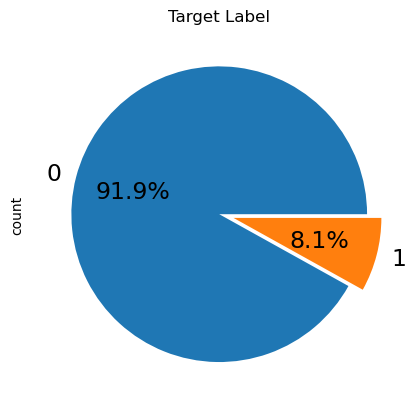

In [18]:
# To check the distribution of target values

df.TARGET.value_counts().plot(kind = 'pie',
                         autopct = '%1.1f%%',
                         startangle = 0,
                         fontsize = 17,
                         #shadow = True,
                         explode = (0, 0.1),
                         title = 'Target Label'
)

**An imbalanced dataset!**

I will use two common approaches: using class weights and applying the Synthetic Minority Over-sampling Technique (SMOTE).

<a id='Data_Quality'></a>
<h2 style="color:blue"> Skewness</h2>  

**Rule of Thumb for Skewness:**

- Skewness between -0.5 and 0.5: Data are nearly symmetrical.
- Skewness between -1 and -0.5 (negative skew) or between 0.5 and 1 (positive skew): Data are slightly skewed.
- Skewness less than -1 (negative skew) or greater than 1 (positive skew): Data are extremely skewed.

Here are some common techniques for handling skewed data:

1. For normally distributed columns: If you have columns that are already normally distributed, you can leave them as they are.

2. For left-skewed columns: For left-skewed data, you can apply a transformation to make the distribution more symmetric. Common transformations include logarithmic transformation (e.g., np.log1p()) or square root transformation (e.g., np.sqrt()). Experiment with different transformations to find the one that works best for your data.

3. For right-skewed columns: Similar to left-skewed data, you can apply a transformation to right-skewed columns. Common transformations include logarithmic transformation or square root transformation. Again, you should experiment with different transformations to find the most appropriate one.

In [19]:
# Check skewness of numerical columns
skewness = df[train_num_features].skew().to_frame().T

# Reshape the skewness dataframe for seaborn
skewness = skewness.melt(var_name='Columns', value_name='Skewness')
print(skewness)

                          Columns    Skewness
0                      SK_ID_CURR   -0.001200
1                          TARGET    3.078159
2                    CNT_CHILDREN    1.974604
3                AMT_INCOME_TOTAL  391.559654
4                      AMT_CREDIT    1.234778
5                     AMT_ANNUITY    1.579777
6                 AMT_GOODS_PRICE    1.349000
7      REGION_POPULATION_RELATIVE    1.488009
8                      DAYS_BIRTH   -0.115673
9                   DAYS_EMPLOYED    1.664346
10              DAYS_REGISTRATION   -0.590872
11                DAYS_ID_PUBLISH    0.349327
12                    OWN_CAR_AGE    2.745422
13                     FLAG_MOBIL -554.536744
14                 FLAG_EMP_PHONE   -1.664886
15                FLAG_WORK_PHONE    1.504950
16               FLAG_CONT_MOBILE  -23.081172
17                     FLAG_PHONE    0.974083
18                     FLAG_EMAIL    3.832853
19                CNT_FAM_MEMBERS    0.987543
20           REGION_RATING_CLIENT 

<Figure size 2000x600 with 0 Axes>

<AxesSubplot:>

(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
         13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
         26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
         39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
         52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
         65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
         78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
         91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
        104, 105]),
 [Text(0, 0, 'SK_ID_CURR'),
  Text(1, 0, 'TARGET'),
  Text(2, 0, 'CNT_CHILDREN'),
  Text(3, 0, 'AMT_INCOME_TOTAL'),
  Text(4, 0, 'AMT_CREDIT'),
  Text(5, 0, 'AMT_ANNUITY'),
  Text(6, 0, 'AMT_GOODS_PRICE'),
  Text(7, 0, 'REGION_POPULATION_RELATIVE'),
  Text(8, 0, 'DAYS_BIRTH'),
  Text(9, 0, 'DAYS_EMPLOYED'),
  Text(10, 0, 'DAYS_REGISTRATION'),
  Text(11, 0, 'DAYS_ID_PUBLISH'),
  Text(12, 0, 'OW

Text(0.5, 0, 'Columns')

Text(0, 0.5, 'Skewness')

Text(0.5, 1.0, 'Skewness of Numerical Columns')

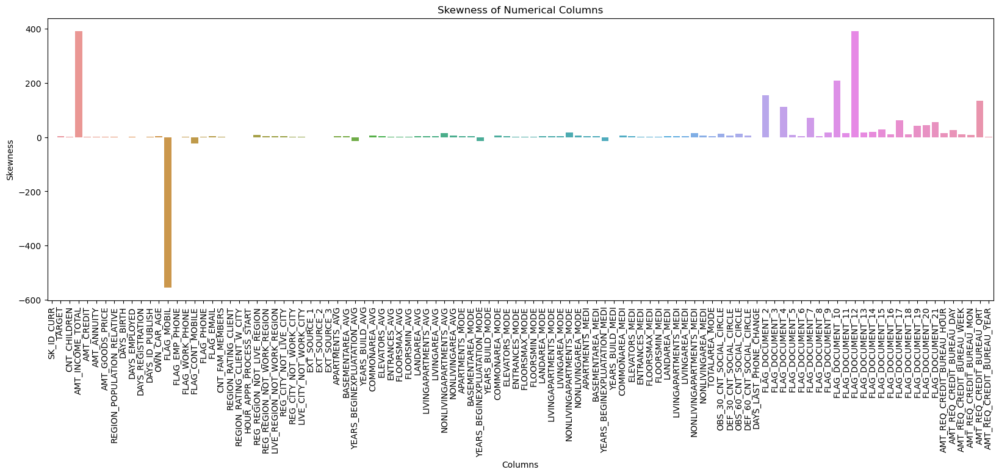

In [20]:
numeric_columns = df.select_dtypes(include=np.number).columns
skewness = df[numeric_columns].skew()

plt.figure(figsize=(20, 6))
sns.barplot(x=skewness.index, y=skewness.values)
plt.xticks(rotation=90)
plt.xlabel('Columns')
plt.ylabel('Skewness')
plt.title('Skewness of Numerical Columns')
plt.show()

## Quick check on constant

In [21]:
# check which columns have constant value. Those columns are not useful for modeling
idx = np.where(df[train_cat_features].nunique()<2)
drop_constant = df[train_cat_features].columns[idx].tolist()
print('There are {} constant columns:'.format(len(drop_constant)))
print(drop_constant)

#drop_constant in cat_col
cat_col = [x for x in train_cat_features if x not in drop_constant]
print("="*60)
print('There are {} categorical columns:'.format(len(train_cat_features)))

There are 0 constant columns:
[]
There are 16 categorical columns:


__There are 16 categorical features, and None of them contain just one value.__

<BarContainer object of 2 artists>

[Text(0, 0, 'Cash loans'), Text(1, 0, 'Revolving loans')]

Text(0.5, 1.0, 'NAME_CONTRACT_TYPE')

<BarContainer object of 3 artists>

[Text(0, 0, 'F'), Text(1, 0, 'M'), Text(2, 0, 'XNA')]

Text(0.5, 1.0, 'CODE_GENDER')

<BarContainer object of 2 artists>

[Text(0, 0, 'N'), Text(1, 0, 'Y')]

Text(0.5, 1.0, 'FLAG_OWN_CAR')

<BarContainer object of 2 artists>

[Text(0, 0, 'Y'), Text(1, 0, 'N')]

Text(0.5, 1.0, 'FLAG_OWN_REALTY')

<BarContainer object of 7 artists>

[Text(0, 0, 'Unaccompanied'),
 Text(1, 0, 'Family'),
 Text(2, 0, 'Spouse, partner'),
 Text(3, 0, 'Children'),
 Text(4, 0, 'Other_B'),
 Text(5, 0, 'Other_A'),
 Text(6, 0, 'Group of people')]

Text(0.5, 1.0, 'NAME_TYPE_SUITE')

<BarContainer object of 8 artists>

[Text(0, 0, 'Working'),
 Text(1, 0, 'Commercial associate'),
 Text(2, 0, 'Pensioner'),
 Text(3, 0, 'State servant'),
 Text(4, 0, 'Unemployed'),
 Text(5, 0, 'Student'),
 Text(6, 0, 'Businessman'),
 Text(7, 0, 'Maternity leave')]

Text(0.5, 1.0, 'NAME_INCOME_TYPE')

<BarContainer object of 5 artists>

[Text(0, 0, 'Secondary / secondary special'),
 Text(1, 0, 'Higher education'),
 Text(2, 0, 'Incomplete higher'),
 Text(3, 0, 'Lower secondary'),
 Text(4, 0, 'Academic degree')]

Text(0.5, 1.0, 'NAME_EDUCATION_TYPE')

<BarContainer object of 6 artists>

[Text(0, 0, 'Married'),
 Text(1, 0, 'Single / not married'),
 Text(2, 0, 'Civil marriage'),
 Text(3, 0, 'Separated'),
 Text(4, 0, 'Widow'),
 Text(5, 0, 'Unknown')]

Text(0.5, 1.0, 'NAME_FAMILY_STATUS')

<BarContainer object of 6 artists>

[Text(0, 0, 'House / apartment'),
 Text(1, 0, 'With parents'),
 Text(2, 0, 'Municipal apartment'),
 Text(3, 0, 'Rented apartment'),
 Text(4, 0, 'Office apartment'),
 Text(5, 0, 'Co-op apartment')]

Text(0.5, 1.0, 'NAME_HOUSING_TYPE')

<BarContainer object of 18 artists>

[Text(0, 0, 'Laborers'),
 Text(1, 0, 'Sales staff'),
 Text(2, 0, 'Core staff'),
 Text(3, 0, 'Managers'),
 Text(4, 0, 'Drivers'),
 Text(5, 0, 'High skill tech staff'),
 Text(6, 0, 'Accountants'),
 Text(7, 0, 'Medicine staff'),
 Text(8, 0, 'Security staff'),
 Text(9, 0, 'Cooking staff'),
 Text(10, 0, 'Cleaning staff'),
 Text(11, 0, 'Private service staff'),
 Text(12, 0, 'Low-skill Laborers'),
 Text(13, 0, 'Waiters/barmen staff'),
 Text(14, 0, 'Secretaries'),
 Text(15, 0, 'Realty agents'),
 Text(16, 0, 'HR staff'),
 Text(17, 0, 'IT staff')]

Text(0.5, 1.0, 'OCCUPATION_TYPE')

<BarContainer object of 7 artists>

[Text(0, 0, 'TUESDAY'),
 Text(1, 0, 'WEDNESDAY'),
 Text(2, 0, 'MONDAY'),
 Text(3, 0, 'THURSDAY'),
 Text(4, 0, 'FRIDAY'),
 Text(5, 0, 'SATURDAY'),
 Text(6, 0, 'SUNDAY')]

Text(0.5, 1.0, 'WEEKDAY_APPR_PROCESS_START')

<BarContainer object of 58 artists>

[Text(0, 0, 'Business Entity Type 3'),
 Text(1, 0, 'XNA'),
 Text(2, 0, 'Self-employed'),
 Text(3, 0, 'Other'),
 Text(4, 0, 'Medicine'),
 Text(5, 0, 'Business Entity Type 2'),
 Text(6, 0, 'Government'),
 Text(7, 0, 'School'),
 Text(8, 0, 'Trade: type 7'),
 Text(9, 0, 'Kindergarten'),
 Text(10, 0, 'Construction'),
 Text(11, 0, 'Business Entity Type 1'),
 Text(12, 0, 'Transport: type 4'),
 Text(13, 0, 'Trade: type 3'),
 Text(14, 0, 'Industry: type 9'),
 Text(15, 0, 'Industry: type 3'),
 Text(16, 0, 'Security'),
 Text(17, 0, 'Housing'),
 Text(18, 0, 'Industry: type 11'),
 Text(19, 0, 'Military'),
 Text(20, 0, 'Bank'),
 Text(21, 0, 'Agriculture'),
 Text(22, 0, 'Police'),
 Text(23, 0, 'Transport: type 2'),
 Text(24, 0, 'Postal'),
 Text(25, 0, 'Security Ministries'),
 Text(26, 0, 'Trade: type 2'),
 Text(27, 0, 'Restaurant'),
 Text(28, 0, 'Services'),
 Text(29, 0, 'University'),
 Text(30, 0, 'Industry: type 7'),
 Text(31, 0, 'Transport: type 3'),
 Text(32, 0, 'Industry: type 1'),
 Text(33, 0, 

Text(0.5, 1.0, 'ORGANIZATION_TYPE')

<BarContainer object of 4 artists>

[Text(0, 0, 'reg oper account'),
 Text(1, 0, 'reg oper spec account'),
 Text(2, 0, 'not specified'),
 Text(3, 0, 'org spec account')]

Text(0.5, 1.0, 'FONDKAPREMONT_MODE')

<BarContainer object of 3 artists>

[Text(0, 0, 'block of flats'),
 Text(1, 0, 'specific housing'),
 Text(2, 0, 'terraced house')]

Text(0.5, 1.0, 'HOUSETYPE_MODE')

<BarContainer object of 7 artists>

[Text(0, 0, 'Panel'),
 Text(1, 0, 'Stone, brick'),
 Text(2, 0, 'Block'),
 Text(3, 0, 'Wooden'),
 Text(4, 0, 'Mixed'),
 Text(5, 0, 'Monolithic'),
 Text(6, 0, 'Others')]

Text(0.5, 1.0, 'WALLSMATERIAL_MODE')

<BarContainer object of 2 artists>

[Text(0, 0, 'No'), Text(1, 0, 'Yes')]

Text(0.5, 1.0, 'EMERGENCYSTATE_MODE')

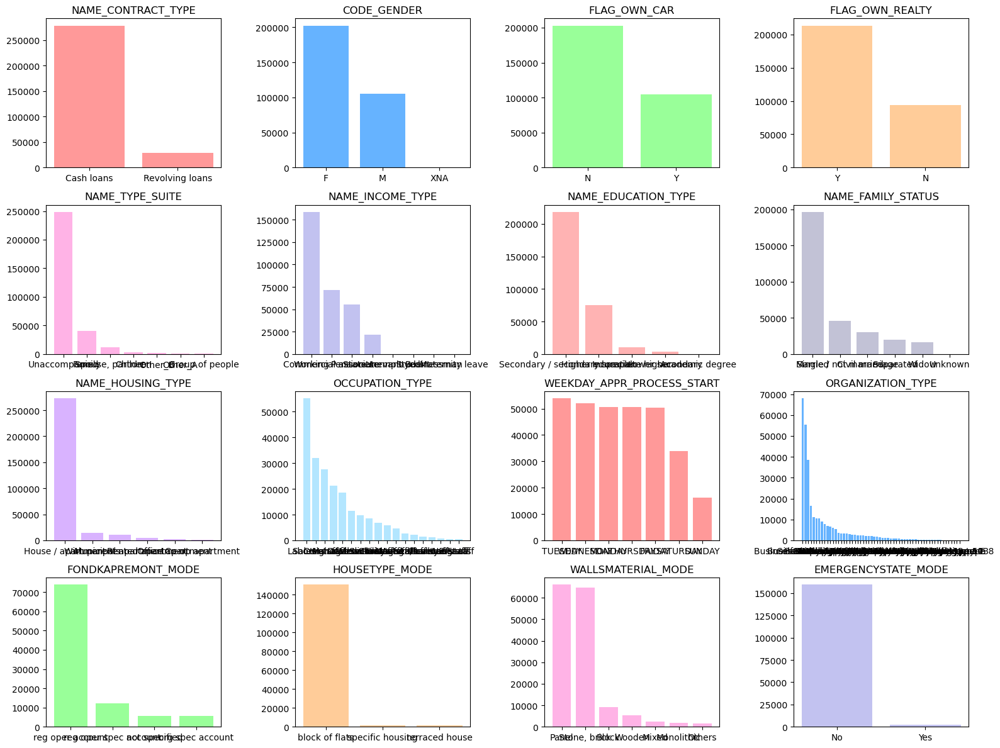

In [22]:
#### plot 16 categorical features
# loop through each feature and plot a bar chart of unique values

# Create a 4x4 subplot grid
fig, axs = plt.subplots(4, 4, figsize=(16, 12))

# Define a list of colors to use for the bars
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#ffb3e6',
          '#c2c2f0','#ffb3b3','#c2c2d6','#d9b3ff','#b3e6ff',
          '#ff9999','#66b3ff','#99ff99','#ffcc99','#ffb3e6',
          '#c2c2f0','#ffb3b3','#c2c2d6','#d9b3ff','#b3e6ff']

# Loop through each feature and plot a bar chart of unique values
for i, col in enumerate(cat_col):
    row = i // 4  # determine which row to plot the current feature
    col_idx = i % 4  # determine the column index of the current feature
    unique_vals = df[col].nunique()
    axs[row, col_idx].bar(range(unique_vals), df[col].value_counts().values, color=colors[i])
    axs[row, col_idx].set_xticks(range(unique_vals))
    axs[row, col_idx].set_xticklabels(df[col].value_counts().index)
    axs[row, col_idx].set_title(col)

plt.tight_layout()
plt.show()

<a id='Data_Quality'></a>
<h2 style="color:blue">Missing Values</h2>

In [23]:
df_missing = df_train.copy()
df_missing.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
181648,310536,0,Cash loans,F,N,N,2,90000.0,227520.0,13189.5,180000.0,Unaccompanied,Commercial associate,Higher education,Married,House / apartment,0.008230,-12298,-946,-6378.0,-4670,NaN,1,1,0,1,0,0,Laborers,4.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 2,0.384582,0.289573,0.622922,0.2227,0.1613,0.9851,0.7960,0.0736,0.32,0.2759,0.3333,0.3750,0.0650,0.1816,0.2281,0.0,0.0,0.2269,0.1673,0.9851,0.8040,0.0742,0.3222,0.2759,0.3333,0.3750,0.0665,0.1983,0.2377,0.0,0.0,0.2248,0.1613,0.9851,0.7987,0.0740,0.32,0.2759,0.3333,0.3750,0.0661,0.1847,0.2322,0.0,0.0,reg oper account,block of flats,0.2197,Panel,No,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
229245,365516,0,Cash loans,M,Y,Y,0,90000.0,161730.0,13095.0,135000.0,Unaccompanied,Commercial associate,Secondary / secondary special,Married,House / apartment,0.003069,-15375,-92,-1292.0,-1994,23.0,1,1,0,1,0,0,Drivers,2.0,3,3,TUESDAY,13,0,0,0,0,1,1,Other,NaN,0.514261,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-509.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
122525,242055,1,Cash loans,M,N,Y,0,135000.0,728847.0,26307.0,553500.0,"Spouse, partner",Working,Secondary / secondary special,Single / not married,House / apartment,0.020713,-19307,-1646,-7951.0,-2842,NaN,1,1,0,1,1,0,Laborers,1.0,3,2,TUESDAY,5,0,0,0,0,0,0,Business Entity Type 3,NaN,0.486906,0.598926,0.1485,0.1124,0.9891,0.8504,0.0383,0.16,0.1379,0.3750,0.4167,0.3064,0.1210,0.1614,0.0,0.0,0.1513,0.1166,0.9891,0.8563,0.0387,0.1611,0.1379,0.3750,0.4167,0.3133,0.1322,0.1681,0.0,0.0,0.1499,0.1124,0.9891,0.8524,0.0386,0.16,0.1379,0.3750,0.4167,0.3117,0.123

In [24]:
# calculate the miss values of each columns:                      
missing_values = pd.DataFrame(df_missing.isnull().sum().sort_values(ascending=False), columns=['missing_numuber'])

In [25]:
def missing_proportions(dataframe):
    dataframe['missing_proportions'] =  missing_values['missing_numuber'].map(lambda x:x/len(df_train))
    return dataframe

In [26]:
missing_values.T

,COMMONAREA_MEDI,COMMONAREA_AVG,COMMONAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAPARTMENTS_AVG,NONLIVINGAPARTMENTS_MEDI,FONDKAPREMONT_MODE,LIVINGAPARTMENTS_MODE,LIVINGAPARTMENTS_AVG,LIVINGAPARTMENTS_MEDI,FLOORSMIN_AVG,FLOORSMIN_MODE,FLOORSMIN_MEDI,YEARS_BUILD_MEDI,YEARS_BUILD_MODE,YEARS_BUILD_AVG,OWN_CAR_AGE,LANDAREA_MEDI,LANDAREA_MODE,LANDAREA_AVG,BASEMENTAREA_MEDI,BASEMENTAREA_AVG,BASEMENTAREA_MODE,EXT_SOURCE_1,NONLIVINGAREA_MODE,NONLIVINGAREA_AVG,NONLIVINGAREA_MEDI,ELEVATORS_MEDI,ELEVATORS_AVG,ELEVATORS_MODE,WALLSMATERIAL_MODE,APARTMENTS_MEDI,APARTMENTS_AVG,APARTMENTS_MODE,ENTRANCES_MEDI,ENTRANCES_AVG,ENTRANCES_MODE,LIVINGAREA_AVG,LIVINGAREA_MODE,LIVINGAREA_MEDI,HOUSETYPE_MODE,FLOORSMAX_MODE,FLOORSMAX_MEDI,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BEGINEXPLUATATION_AVG,TOTALAREA_MODE,EMERGENCYSTATE_MODE,OCCUPATION_TYPE,EXT_SOURCE_3,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_TYPE_SUITE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,EXT_SOURCE_2,AMT_GOODS_PRICE,AMT_ANNUITY,CNT_FAM_MEMBERS,DAYS_LAST_PHONE_CHANGE,CNT_CHILDREN,FLAG_DOCUMENT_8,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_9,FLAG_DOCUMENT_21,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_OWN_REALTY,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_12,AMT_CREDIT,AMT_INCOME_TOTAL,FLAG_PHONE,LIVE_CITY_NOT_WORK_CITY,REG_CITY_NOT_WORK_CITY,TARGET,REG_CITY_NOT_LIVE_CITY,LIVE_REGION_NOT_WORK_REGION,REG_REGION_NOT_WORK_REGION,REG_REGION_NOT_LIVE_REGION,HOUR_APPR_PROCESS_START,WEEKDAY_APPR_PROCESS_START,REGION_RATING_CLIENT_W_CITY,REGION_RATING_CLIENT,FLAG_EMAIL,FLAG_CONT_MOBILE,ORGANIZATION_TYPE,FLAG_WORK_PHONE,FLAG_EMP_PHONE,FLAG_MOBIL,DAYS_ID_PUBLISH,DAYS_REGISTRATION,DAYS_EMPLOYED,DAYS_BIRTH,REGION_POPULATION_RELATIVE,NAME_HOUSING_TYPE,NAME_FAMILY_STATUS,NAME_EDUCATION_TYPE,NAME_INCOME_TYPE,SK_ID_CURR
missing_numuber,171811,171811,171811,170729,170729,170729,168215,168119,168119,168119,166921,166921,166921,163543,163543,163543,162418,145985,145985,145985,143829,143829,143829,138595,135624,135624,135624,131017,131017,131017,124975,124732,124732,124732,123775,123775,123775,123462,123462,123462,123328,122297,122297,122297,119949,119949,119949,118707,116581,76940,48805,33244,33244,33244,33244,33244,33244,1029,811,811,811,811,531,221,10,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [27]:
missing_proportions(missing_values)

,missing_numuber,missing_proportions
COMMONAREA_MEDI,171811,0.698396
COMMONAREA_AVG,171811,0.698396
COMMONAREA_MODE,171811,0.698396
NONLIVINGAPARTMENTS_MODE,170729,0.693998
NONLIVINGAPARTMENTS_AVG,170729,0.693998
NONLIVINGAPARTMENTS_MEDI,170729,0.693998
FONDKAPREMONT_MODE,168215,0.683779
LIVINGAPARTMENTS_MODE,168119,0.683388
LIVINGAPARTMENTS_AVG,168119,0.683388
LIVINGAPARTMENTS_MEDI,168119,0.683388


Total number of missing features: 67


<Figure size 1200x400 with 0 Axes>

Text(0.5, 0, 'Column')

Text(0, 0.5, 'Proportions')

Text(0.5, 1.0, 'Proportions of missing values')

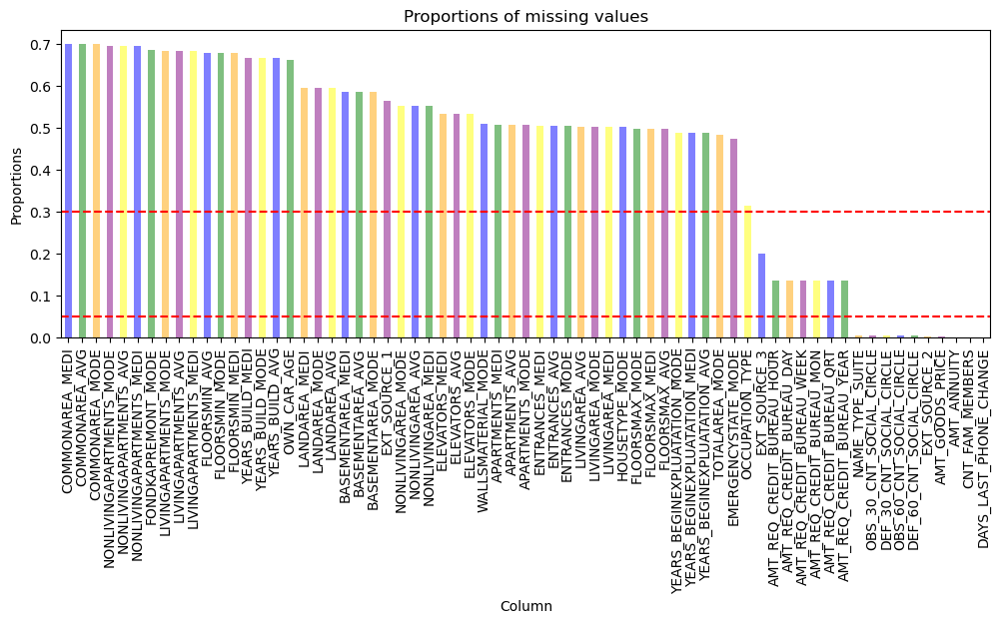

In [28]:
# Filter DataFrame for columns with missing values
missing_columns = missing_values[missing_values['missing_proportions'] > 0]

# Print the total number of missing features
print("Total number of missing features:", len(missing_columns))

plt.figure(figsize=(12, 4))
ax = missing_columns['missing_proportions'].plot(kind='bar', color=['blue', 'green', 'orange', 'purple', 'yellow'], alpha=0.5)

# Add dashed lines at the threshold values for moderate skewness
ax.axhline(y=0.3, color='red', linestyle='--')
ax.axhline(y=0.05, color='red', linestyle='--')

# Add labels and title to the plot
ax.set_xlabel('Column')
ax.set_ylabel('Proportions')
ax.set_title('Proportions of missing values')

plt.show()

**There are 67 features with missing values. Different strategies will be used to impute missing values.**

<a id='Data_Quality'></a>
<h2 style="color:blue">Univariate Analysis - Categorical Features</h2>

- Data distribution: normal or skewed.
- Missing values fillin.
- Outliers elimination.
- Check distribution of target label in each group in a category column to infer the importance of the variable for target prediction

### General strategies for filling missing values in categorical columns and their corresponding Python code

**1. Mode imputation: Replace the missing values with the mode (most frequent value) of the column.**

In [384]:
# Mode imputation: Replace the missing values with the mode (most frequent value) of the column.
# code template 1
# df['col_1'].fillna(df['col_1'].mode()[0], inplace=True)

In [385]:
# Mode imputation
# code template 2: use SimpleImputer from scikit-learn
# from sklearn.impute import SimpleImputer
# Initialize the imputer object with the strategy 'most_frequent' and 
# imputer = SimpleImputer(strategy='most_frequent')
# Fit and transform the imputer on the categorical column with missing values
# df[['col_2']] = imputer.fit_transform(df[['col_2']])

In [30]:
# Mode imputation
# code template 3: use SimpleImputer from scikit-learn and wrap it in a pipeline
# Here is an example
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

# create a sample dataframe with a categorical column
df_example = pd.DataFrame({
    'color': ['red', 'blue', 'green', 'red', 'blue', None, 'red', 'green']
})

# create a pipeline to fill in missing values with mode and one-hot encode the column
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

# apply the pipeline to the categorical column using ColumnTransformer
preprocessor = ColumnTransformer(transformers=[
    ('cat', categorical_transformer, ['color'])
])

# fit and transform the preprocessor on the sample dataframe
transformed_df_example = preprocessor.fit_transform(df_example)
print(transformed_df_example)

  (0, 2)	1.0
  (1, 0)	1.0
  (2, 1)	1.0
  (3, 2)	1.0
  (4, 0)	1.0
  (5, 3)	1.0
  (6, 2)	1.0
  (7, 1)	1.0


In [31]:
# Convert the sparse matrix into a dataframe or a dense matrix
transformed_df_example1 = pd.DataFrame(transformed_df_example)
transformed_df_example2 = transformed_df_example.toarray()

In [32]:
transformed_df_example1
transformed_df_example2

,0
0,"(0, 2)\t1.0"
1,"(0, 0)\t1.0"
2,"(0, 1)\t1.0"
3,"(0, 2)\t1.0"
4,"(0, 0)\t1.0"
5,"(0, 3)\t1.0"
6,"(0, 2)\t1.0"
7,"(0, 1)\t1.0"


array([[0., 0., 1., 0.],
       [1., 0., 0., 0.],
       [0., 1., 0., 0.],
       [0., 0., 1., 0.],
       [1., 0., 0., 0.],
       [0., 0., 0., 1.],
       [0., 0., 1., 0.],
       [0., 1., 0., 0.]])

**2. Forward fill (ffill) or backward fill (bfill): Replace the missing value with the previous or next non-missing value.**

In [33]:
# Replace missing values with a random value from the column
df[cat_col[0]].fillna(df[cat_col[0]].dropna().sample().values[0], inplace=False)

0              Cash loans
1              Cash loans
2         Revolving loans
3              Cash loans
4              Cash loans
5              Cash loans
6              Cash loans
7              Cash loans
8              Cash loans
9         Revolving loans
10             Cash loans
11             Cash loans
12             Cash loans
13             Cash loans
14             Cash loans
15             Cash loans
16             Cash loans
17        Revolving loans
18        Revolving loans
19             Cash loans
20        Revolving loans
21             Cash loans
22             Cash loans
23             Cash loans
24             Cash loans
25             Cash loans
26             Cash loans
27             Cash loans
28             Cash loans
29        Revolving loans
30             Cash loans
31             Cash loans
32             Cash loans
33             Cash loans
34             Cash loans
35             Cash loans
36             Cash loans
37             Cash loans
38          

In [34]:
df[cat_col[0]].isnull().sum()

0

**3. Random imputation: Replace the missing value with a random value from the non-missing values in the column.**

The proportion of missing values in the dataset is considered moderate to high. To address these missing values, a technique called random imputation can be used. Random imputation involves assigning a category randomly to each missing value, taking into account the distribution of categories observed in the available data. This method assumes that the missing values follow a similar distribution to the observed values.

In [568]:
# Replace missing values with a random value from the column
#df_data['col1'].fillna(df_data['col1'].dropna().sample().values[0], inplace=True)

**4. Prediction imputation: Use a machine learning model (KNN) to predict the missing values based on the values in the other columns.**

Prediction imputation (KNN):

Proportion of missing values: Moderate to high

Description: Prediction imputation is a method used to handle missing values by leveraging predictive models, such as the k-nearest neighbors (KNN) algorithm. This approach considers the relationships between the categorical feature with missing values and other features in the dataset. By utilizing the observed data, the KNN algorithm predicts the missing categories, taking into account the similarities between instances. This technique is particularly useful when dealing with moderate to high proportions of missing values.

In [35]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import OneHotEncoder

# Create a dataframe with missing values in categorical features
data = {'col1': ['a', 'b', np.nan, 'c', 'a'],
        'col2': ['x', np.nan, 'y', 'x', np.nan],
        'col3': ['p', 'q', 'r', np.nan, 's']}
df_data = pd.DataFrame(data)

# Perform one-hot encoding on the categorical features
encoder = OneHotEncoder(handle_unknown='ignore', sparse=False)
df_encoded = pd.DataFrame(encoder.fit_transform(df_data.astype(str)))

# Instantiate the imputer
imputer = KNNImputer(n_neighbors=3)

# Fit and transform the encoded dataframe
df_imputed = pd.DataFrame(imputer.fit_transform(df_encoded), columns=df_encoded.columns)

# Print the imputed dataframe
print(df_imputed)

    0    1    2    3    4    5    6    7    8    9    10   11
0  1.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0
1  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  1.0  0.0  0.0
2  0.0  0.0  0.0  1.0  0.0  0.0  1.0  0.0  0.0  0.0  1.0  0.0
3  0.0  0.0  1.0  0.0  0.0  1.0  0.0  1.0  0.0  0.0  0.0  0.0
4  1.0  0.0  0.0  0.0  1.0  0.0  0.0  0.0  0.0  0.0  0.0  1.0


**5. Assign missing values into a new category as "unknown":**

**Proportion of missing values: Moderate to high
Description: When the proportion of missing values is relatively high, one option is to create a new category or label, such as "unknown" or "missing," to represent the missing values. This approach allows the missingness to be explicitly captured as a separate category, preserving the information about missing values.**

In [36]:
#df.column_name.fillna('unknown', inplace = True)

### Functions to plot counts and normalized counts

In [37]:
def plot_counts(df, category_col, target_col, length, height, fontsize, show_percentages=True):
    fig = plt.figure(figsize=(length, height))
    ax = sns.countplot(x=category_col, hue=target_col, data=df)

    if show_percentages:
        for p in ax.patches:
            height = p.get_height()
            ax.annotate(f'{height / len(df) * 100:.1f}%', 
                        xy=(p.get_x() + p.get_width() / 2., height), 
                        ha='center', va='center', xytext=(0, 5),
                        textcoords='offset points', fontsize=fontsize)
    plt.xticks(rotation=90)
    plt.show()

In [38]:
def plot_normalized_counts(df, category_col, target_col, length, height, fontsize, show_percentages=True):
    """
    Plot a normalized bar plot of the counts of 0 and 1 in each category of a categorical column.

    Args:
    df (pandas dataframe): The input dataframe.
    category_col (str): The name of the categorical column.
    target_col (str): The name of the target column.
    length (float): The length of the plot.
    height (float): The height of the plot.

    Returns:
    None.
    """

    # Calculate the normalized count for each category
    counts = df.groupby([category_col, target_col]).size().unstack().fillna(0)

    # Calculate percentages
    counts_percent = counts.div(counts.sum(axis=1), axis=0) * 100

    # Plot the bar chart
    fig, ax = plt.subplots(figsize=(length, height))
    counts_percent.plot(kind='bar', stacked=True, ax=ax)

    if show_percentages:
        for col in counts_percent.columns:
            for index, value in enumerate(counts_percent[col]):
                if value != 0:  # Skip displaying percentage for 0 values
                    ax.text(
                        index,
                        counts_percent.iloc[:, :counts_percent.columns.get_loc(col)].sum(axis=1)[index] + value / 2,
                        f"{value:.2f}%",
                        ha='center',
                        va='center',
                        fontsize=fontsize,
                        color='white'
                    )
    plt.xticks(rotation=90)
    ax.set_xlabel(category_col)
    ax.set_ylabel('Percentage of normalized counts')
    ax.legend(title=target_col, bbox_to_anchor=(1, 1))

    plt.show()

In [39]:
cat_col

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'WEEKDAY_APPR_PROCESS_START',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

In [40]:
# To check the missing values in categorical columns.
pd.DataFrame({'missing':df_train[cat_col].isnull().sum(), 
              'missing percentage': df_train[cat_col].isnull().sum() / len(df_train[cat_col])*100
             }
).sort_values(by=['missing'],ascending = False)

,missing,missing percentage
FONDKAPREMONT_MODE,168215,68.377858
WALLSMATERIAL_MODE,124975,50.801193
HOUSETYPE_MODE,123328,50.131703
EMERGENCYSTATE_MODE,116581,47.389109
OCCUPATION_TYPE,76940,31.275406
NAME_TYPE_SUITE,1029,0.418279
NAME_CONTRACT_TYPE,0,0.000000
CODE_GENDER,0,0.000000
FLAG_OWN_CAR,0,0.000000
FLAG_OWN_REALTY,0,0.000000


Total 6 out of 10 categorical features have missing values.


[Text(0, 0, 'FONDKAPREMONT_MODE'),
 Text(1, 0, 'WALLSMATERIAL_MODE'),
 Text(2, 0, 'HOUSETYPE_MODE'),
 Text(3, 0, 'EMERGENCYSTATE_MODE'),
 Text(4, 0, 'OCCUPATION_TYPE'),
 Text(5, 0, 'NAME_TYPE_SUITE')]

Text(0.5, 0, 'Column name')

Text(0, 0.5, 'Percentage\nof missing values')

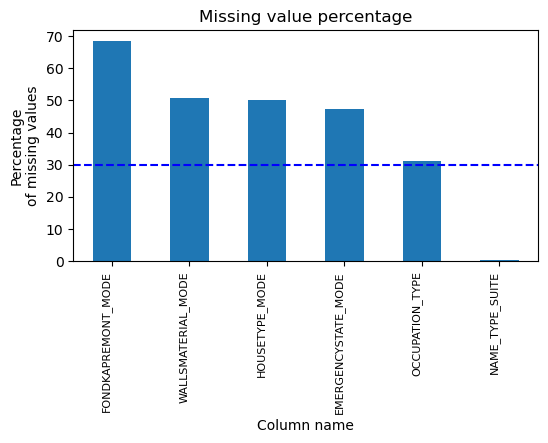

In [41]:
print(f"Total {sum(df_train[cat_col].isnull().mean()>0)} out of 10 categorical features have missing values.")
print('='*60)

ax = (df_train[cat_col].isnull().mean()
            .nlargest(sum(df_train[cat_col].isnull().mean()>0))
            .mul(100)
            .plot(kind='bar', figsize=(6,3),
                  title='Missing value percentage')
     )
ax.set_xticklabels(ax.get_xticklabels(), rotation=90, ha='right', fontsize=8)
ax.axhline(y=30, color='blue', linestyle='--')
ax.set_xlabel('Column name')
ax.set_ylabel('Percentage\nof missing values')
plt.show()

In [42]:
# Count unique values in each categorical column.
n_unique = df_train[cat_col].nunique()
print("Number of unique values:\n{}".format(n_unique))

Number of unique values:
NAME_CONTRACT_TYPE             2
CODE_GENDER                    3
FLAG_OWN_CAR                   2
FLAG_OWN_REALTY                2
NAME_TYPE_SUITE                7
NAME_INCOME_TYPE               8
NAME_EDUCATION_TYPE            5
NAME_FAMILY_STATUS             6
NAME_HOUSING_TYPE              6
OCCUPATION_TYPE               18
WEEKDAY_APPR_PROCESS_START     7
ORGANIZATION_TYPE             58
FONDKAPREMONT_MODE             4
HOUSETYPE_MODE                 3
WALLSMATERIAL_MODE             7
EMERGENCYSTATE_MODE            2
dtype: int64


In [577]:
# Check unique values in each categorical column
print("Unique values in each categorical column:", '\n')
for col in cat_col:
    print(col,":", df_train[col].unique(), '\n')

Unique values in each categorical column: 

NAME_CONTRACT_TYPE : ['Cash loans' 'Revolving loans'] 

CODE_GENDER : ['F' 'M' 'XNA'] 

FLAG_OWN_CAR : ['N' 'Y'] 

FLAG_OWN_REALTY : ['N' 'Y'] 

NAME_TYPE_SUITE : ['Unaccompanied' 'Spouse, partner' 'Family' 'Other_B' nan 'Children'
 'Group of people' 'Other_A'] 

NAME_INCOME_TYPE : ['Commercial associate' 'Working' 'Pensioner' 'State servant'
 'Businessman' 'Unemployed' 'Student' 'Maternity leave'] 

NAME_EDUCATION_TYPE : ['Higher education' 'Secondary / secondary special' 'Incomplete higher'
 'Lower secondary' 'Academic degree'] 

NAME_FAMILY_STATUS : ['Married' 'Single / not married' 'Civil marriage' 'Separated' 'Widow'
 'Unknown'] 

NAME_HOUSING_TYPE : ['House / apartment' 'Municipal apartment' 'With parents'
 'Rented apartment' 'Co-op apartment' 'Office apartment'] 

OCCUPATION_TYPE : ['Laborers' 'Drivers' 'Accountants' nan 'Sales staff'
 'High skill tech staff' 'Medicine staff' 'Core staff' 'Security staff'
 'Managers' 'Waiters/barmen st

**We have a total of 16 categorical features in our dataset. Among them, the OCCUPATION_TYPE column has missing values ranging from 10% to 30%.**

**Additionally, there are three columns, namely FLAG_OWN_CAR, FLAG_OWN_REALTY, and EMERGENCYSTATE_MODE, that contain binary information.**

**To address these categorical features, I will examine each of these columns individually.**

### Use comon sense and domain knowledge to drop some columns.

* Based on the column description, the feature 'WEEKDAY_APPR_PROCESS_START' represents the day of the week when the client applied for the loan. It appears unlikely to contribute significantly to predicting the target variable. Therefore, I will proceed to drop this feature from the dataset.

* The feature 'NAME_TYPE_SUITE' indicates who accompanied the client during the previous application. It seems unlikely to provide substantial predictive value for the target variable. As a result, I have decided to remove this feature from the dataset.

In [43]:
# drop column 'WEEKDAY_APPR_PROCESS_START'.
df_train.drop(['WEEKDAY_APPR_PROCESS_START','NAME_TYPE_SUITE'],axis = 1, inplace = True)

In [44]:
# update cat_col
cat_col.remove('WEEKDAY_APPR_PROCESS_START')

In [45]:
cat_col.remove('NAME_TYPE_SUITE')

In [46]:
cat_col

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

### Column 'CODE_GENDER': contains Gender information.No missing value.

In [47]:
df_train.CODE_GENDER.value_counts(dropna = False)

CODE_GENDER
F      161887
M       84119
XNA         2
Name: count, dtype: int64

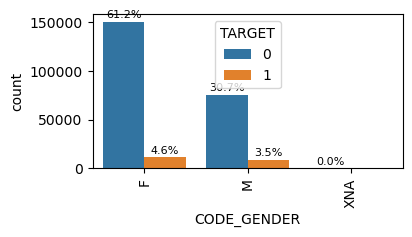

In [48]:
plot_counts(df_train, 'CODE_GENDER', 'TARGET', 4, 2, 8, show_percentages=True)

In [49]:
df_train.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
181648,310536,0,Cash loans,F,N,N,2,90000.0,227520.0,13189.5,180000.0,Commercial associate,Higher education,Married,House / apartment,0.008230,-12298,-946,-6378.0,-4670,NaN,1,1,0,1,0,0,Laborers,4.0,2,2,10,0,0,0,0,0,0,Business Entity Type 2,0.384582,0.289573,0.622922,0.2227,0.1613,0.9851,0.7960,0.0736,0.32,0.2759,0.3333,0.3750,0.0650,0.1816,0.2281,0.0,0.0,0.2269,0.1673,0.9851,0.8040,0.0742,0.3222,0.2759,0.3333,0.3750,0.0665,0.1983,0.2377,0.0,0.0,0.2248,0.1613,0.9851,0.7987,0.0740,0.32,0.2759,0.3333,0.3750,0.0661,0.1847,0.2322,0.0,0.0,reg oper account,block of flats,0.2197,Panel,No,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,1.0,1.0
229245,365516,0,Cash loans,M,Y,Y,0,90000.0,161730.0,13095.0,135000.0,Commercial associate,Secondary / secondary special,Married,House / apartment,0.003069,-15375,-92,-1292.0,-1994,23.0,1,1,0,1,0,0,Drivers,2.0,3,3,13,0,0,0,0,1,1,Other,NaN,0.514261,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,0.0,2.0,0.0,-509.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
122525,242055,1,Cash loans,M,N,Y,0,135000.0,728847.0,26307.0,553500.0,Working,Secondary / secondary special,Single / not married,House / apartment,0.020713,-19307,-1646,-7951.0,-2842,NaN,1,1,0,1,1,0,Laborers,1.0,3,2,5,0,0,0,0,0,0,Business Entity Type 3,NaN,0.486906,0.598926,0.1485,0.1124,0.9891,0.8504,0.0383,0.16,0.1379,0.3750,0.4167,0.3064,0.1210,0.1614,0.0,0.0,0.1513,0.1166,0.9891,0.8563,0.0387,0.1611,0.1379,0.3750,0.4167,0.3133,0.1322,0.1681,0.0,0.0,0.1499,0.1124,0.9891,0.8524,0.0386,0.16,0.1379,0.3750,0.4167,0.3117,0.1231,0.1643,0.0,0.0,reg oper spec account,block of flats,0.1269,Panel,No,1.0,0.0,1.0,0.0,-1474.0,0,1,0,0,0,0,0,0,0,0,0

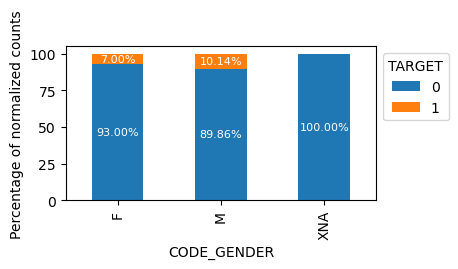

In [50]:
# normalized counts in each group
plot_normalized_counts(df_train, 'CODE_GENDER', 'TARGET', 4, 2, 8, show_percentages=True)

* The distribution of the target label varies between the "yes" and "no" groups for the 'CODE_GENDER' column. This suggests that the 'CODE_GENDER' column is likely to contribute to predicting the target label, 'y'.

### Column 'NAME_CONTRACT_TYPE'，No missing value.

In [51]:
df_train.NAME_CONTRACT_TYPE.value_counts(dropna = False)

NAME_CONTRACT_TYPE
Cash loans         222560
Revolving loans     23448
Name: count, dtype: int64

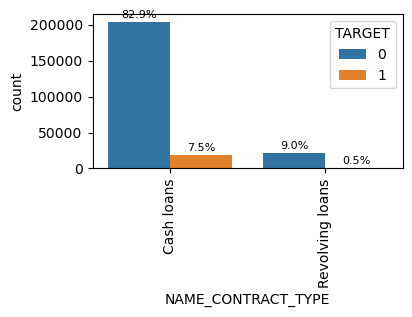

In [52]:
plot_counts(df_train, 'NAME_CONTRACT_TYPE', 'TARGET', 4, 2, 8, show_percentages=True)

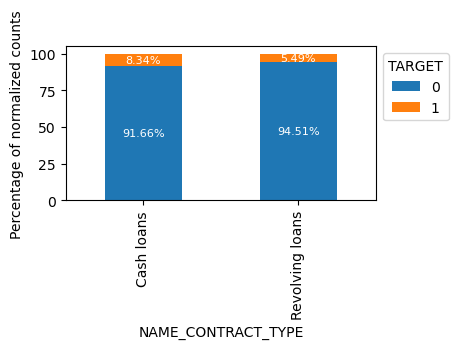

In [53]:
plot_normalized_counts(df_train, 'NAME_CONTRACT_TYPE', 'TARGET', 4, 2, 8, show_percentages=True)

* The distribution of the target label varies between the "yes" and "no" groups for the 'NAME_CONTRACT_TYPE' column. This indicates that the 'NAME_CONTRACT_TYPE' column is likely to contribute to predicting the target label, 'y'.

### Column 'FLAG_OWN_CAR', contain binary information,  No missing value.

In [54]:
df_train.FLAG_OWN_CAR.value_counts(dropna = False)

FLAG_OWN_CAR
N    162413
Y     83595
Name: count, dtype: int64

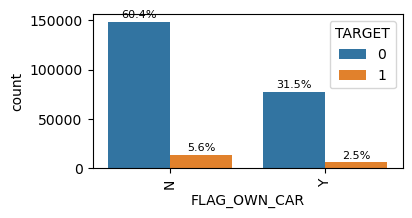

In [55]:
plot_counts(df_train, 'FLAG_OWN_CAR', 'TARGET', 4, 2, 8, show_percentages=True)

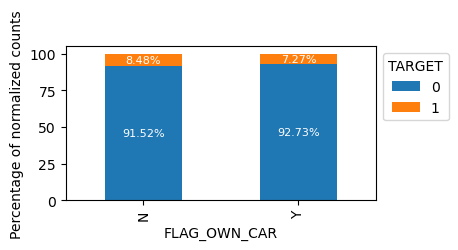

In [56]:
plot_normalized_counts(df_train, 'FLAG_OWN_CAR', 'TARGET', 4, 2, 8, show_percentages=True)

* The distribution of the target label varies between the "yes" and "no" groups for the 'NAME_CONTRACT_TYPE' column. This indicates that the 'NAME_CONTRACT_TYPE' column is likely to contribute to predicting the target label, 'y'

### Column 'NAME_CONTRACT_TYPE', contain binary information, No missing value.

In [57]:
df_train.NAME_CONTRACT_TYPE.value_counts(dropna = False)

NAME_CONTRACT_TYPE
Cash loans         222560
Revolving loans     23448
Name: count, dtype: int64

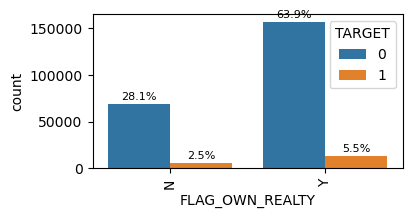

In [58]:
plot_counts(df_train, 'FLAG_OWN_REALTY', 'TARGET', 4, 2, 8, show_percentages=True)

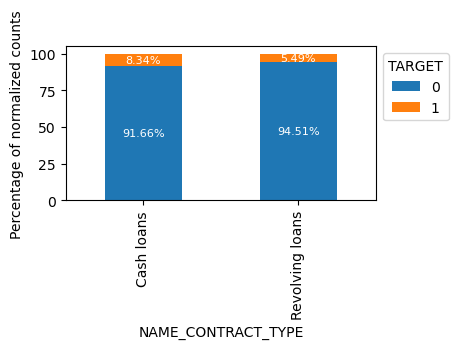

In [59]:
plot_normalized_counts(df_train, 'NAME_CONTRACT_TYPE', 'TARGET', 4, 2, 8, show_percentages=True)

* The distribution of the target label varies between the "yes" and "no" groups for the 'NAME_CONTRACT_TYPE' column. This indicates that the 'NAME_CONTRACT_TYPE' column is likely to contribute to predicting the target label, 'y'.

### Column 'NAME_INCOME_TYPE'，No missing value.

In [60]:
df_train.NAME_INCOME_TYPE.value_counts(dropna = False)

NAME_INCOME_TYPE
Working                 127043
Commercial associate     57273
Pensioner                44134
State servant            17518
Unemployed                  17
Student                     11
Businessman                  9
Maternity leave              3
Name: count, dtype: int64

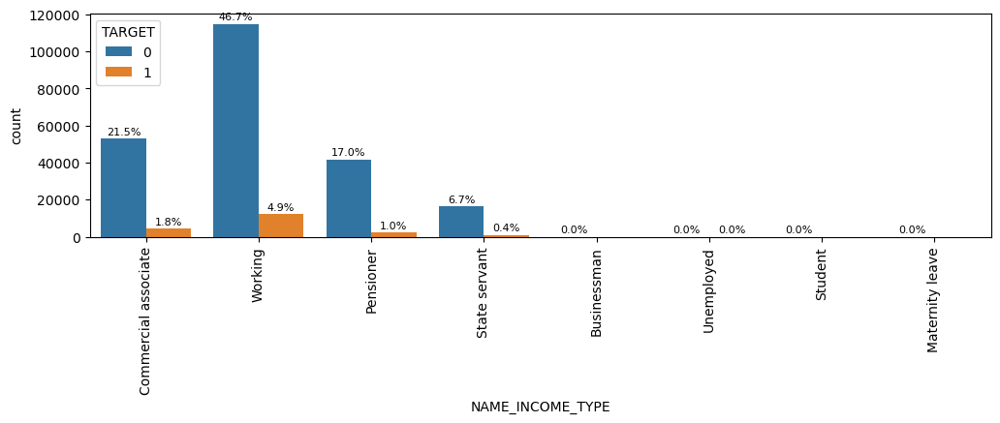

In [61]:
plot_counts(df_train, 'NAME_INCOME_TYPE', 'TARGET', 12, 3, 8, show_percentages=True)

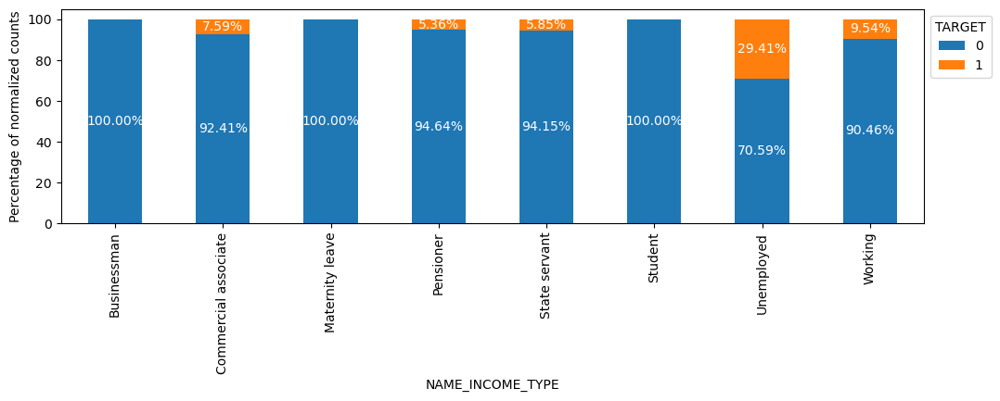

In [62]:
plot_normalized_counts(df_train, 'NAME_INCOME_TYPE', 'TARGET',12, 3, 10, show_percentages=True)

### Column 'NAME_EDUCATION_TYPE'，No missing value.

In [63]:
df_train.NAME_EDUCATION_TYPE.value_counts(dropna = False)

NAME_EDUCATION_TYPE
Secondary / secondary special    174768
Higher education                  59802
Incomplete higher                  8289
Lower secondary                    3025
Academic degree                     124
Name: count, dtype: int64

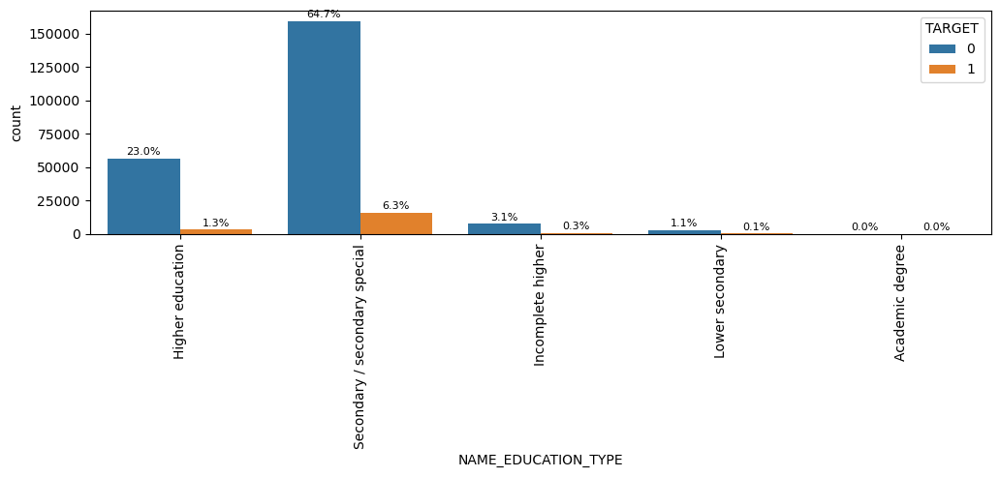

In [64]:
plot_counts(df_train, 'NAME_EDUCATION_TYPE', 'TARGET', 12, 3, 8, show_percentages=True)

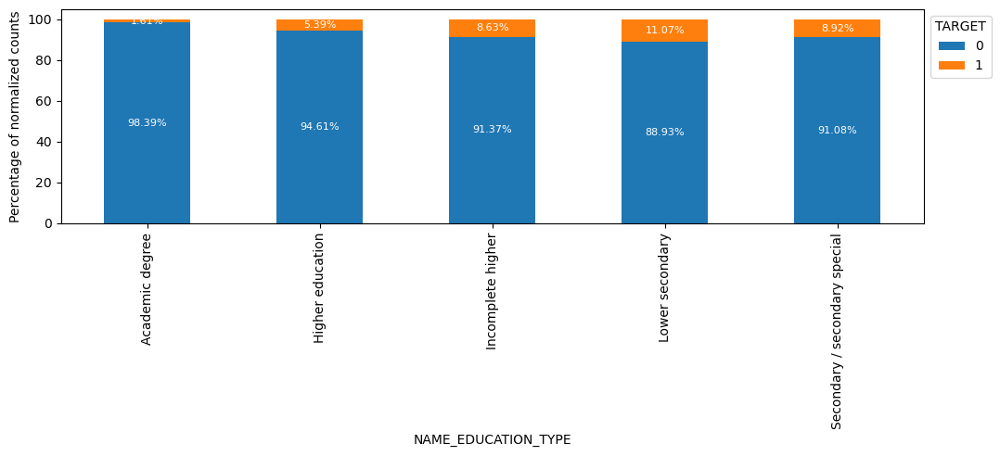

In [65]:
plot_normalized_counts(df_train, 'NAME_EDUCATION_TYPE', 'TARGET', 12, 3, 8, show_percentages=True)

* The distribution of the target label varies between the "yes" and "no" groups for the 'NAME_EDUCATION_TYPE' column. This indicates that the 'NAME_EDUCATION_TYPE' column is likely to contribute to predicting the target label, 'y'.

### Column 'NAME_FAMILY_STATUS'，No missing value.

In [66]:
df_train.NAME_FAMILY_STATUS.value_counts(dropna = False)

NAME_FAMILY_STATUS
Married                 157153
Single / not married     36359
Civil marriage           23812
Separated                15840
Widow                    12842
Unknown                      2
Name: count, dtype: int64

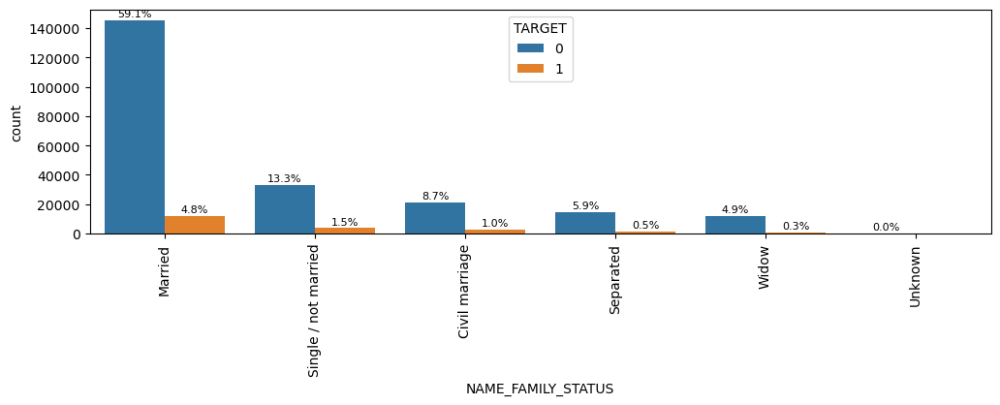

In [67]:
plot_counts(df_train, 'NAME_FAMILY_STATUS', 'TARGET', 12, 3, 8, show_percentages=True)

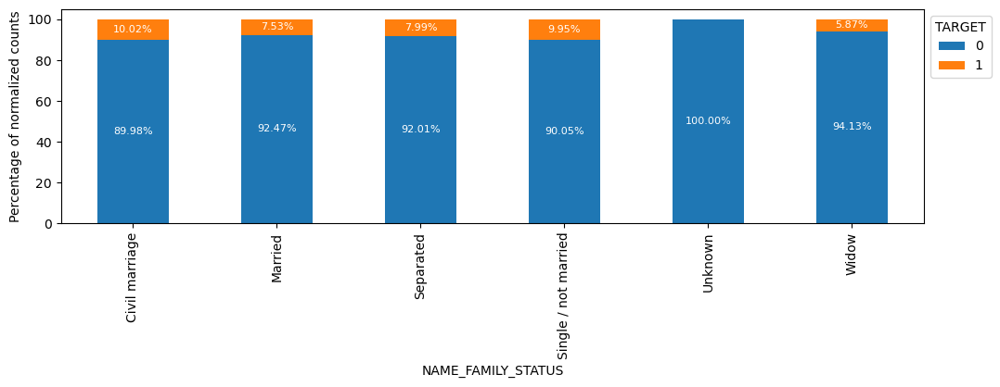

In [68]:
plot_normalized_counts(df_train, 'NAME_FAMILY_STATUS', 'TARGET', 12, 3, 8, show_percentages=True)

* The distribution of the target label varies between the "yes" and "no" groups for the 'NAME_FAMILY_STATUS' column. This suggests that the 'NAME_FAMILY_STATUS' column is likely to contribute to predicting the target label, 'y'.

### Column 'NAME_HOUSING_TYPE'，No missing value.

In [69]:
df_train.NAME_HOUSING_TYPE.value_counts(dropna = False)

NAME_HOUSING_TYPE
House / apartment      218383
With parents            11857
Municipal apartment      8916
Rented apartment         3873
Office apartment         2097
Co-op apartment           882
Name: count, dtype: int64

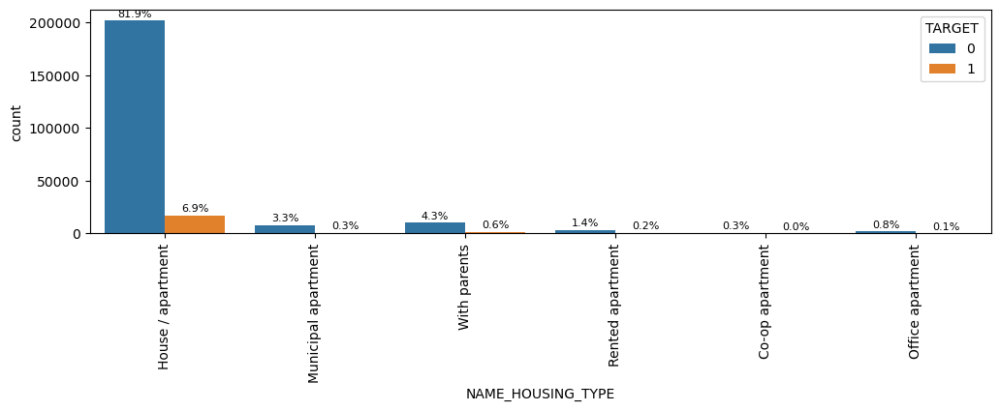

In [70]:
plot_counts(df_train, 'NAME_HOUSING_TYPE', 'TARGET', 12, 3, 8, show_percentages=True)

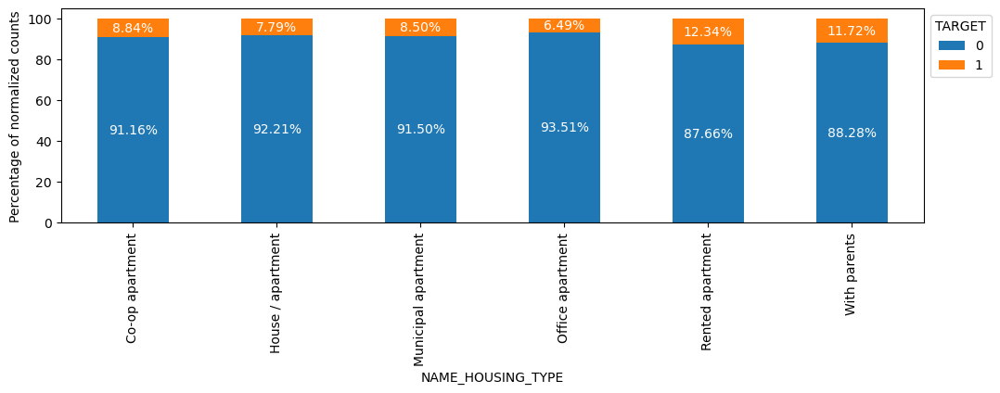

In [71]:
plot_normalized_counts(df_train, 'NAME_HOUSING_TYPE', 'TARGET', 12, 3, 10, show_percentages=True)

* The distribution of the target label varies between the "yes" and "no" groups for the 'NAME_HOUSING_TYPE' column. This suggests that the 'NAME_HOUSING_TYPE' column is likely to contribute to predicting the target label, 'y'.

### Column 'ORGANIZATION_TYPE'，No missing value.

In [72]:
df_train.ORGANIZATION_TYPE.value_counts(dropna = False)

ORGANIZATION_TYPE
Business Entity Type 3    54436
XNA                       44143
Self-employed             30572
Other                     13307
Medicine                   8985
Business Entity Type 2     8431
Government                 8341
School                     7179
Trade: type 7              6264
Kindergarten               5552
Construction               5399
Business Entity Type 1     4820
Transport: type 4          4311
Trade: type 3              2800
Industry: type 9           2720
Industry: type 3           2650
Security                   2607
Housing                    2371
Industry: type 11          2169
Military                   2113
Bank                       2000
Agriculture                1975
Police                     1861
Transport: type 2          1769
Postal                     1738
Security Ministries        1598
Trade: type 2              1523
Restaurant                 1442
Services                   1255
University                 1054
Industry: type 7      

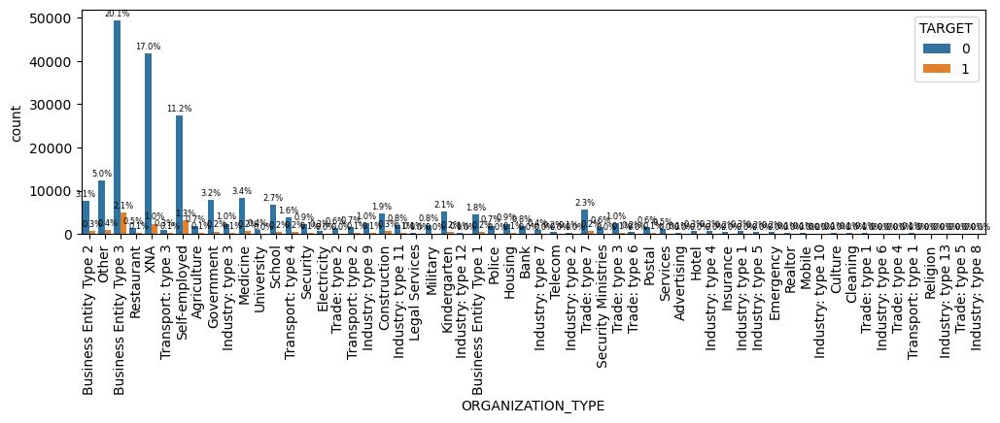

In [73]:
plot_counts(df_train, 'ORGANIZATION_TYPE', 'TARGET', 12, 3, 6, show_percentages=True)

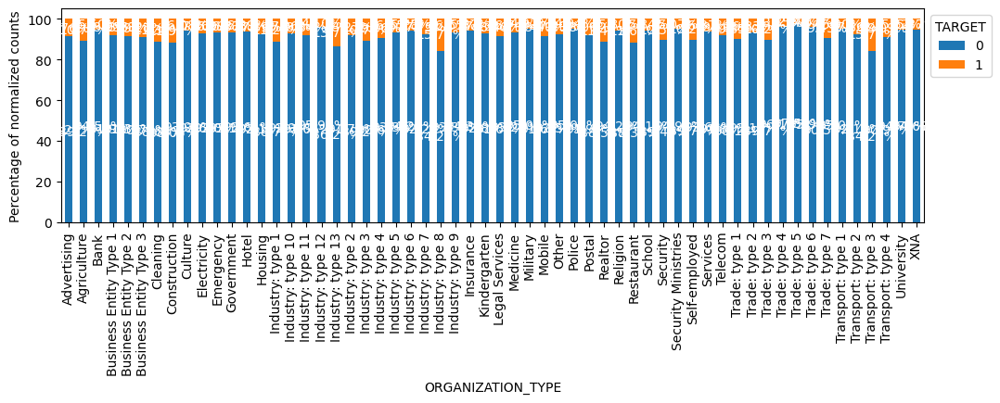

In [74]:
plot_normalized_counts(df_train, 'ORGANIZATION_TYPE', 'TARGET', 12, 3, 10, show_percentages=True)

* The distribution of the target label varies between the "yes" and "no" groups for the 'ORGANIZATION_TYPE' column. This indicates that the 'ORGANIZATION_TYPE' column is likely to contribute to predicting the target label, 'y'.

### Column 'FONDKAPREMONT_MODE'，with 68.38% missiing values, fillin with 'unknow'.

In [75]:
# fillin NaN as a new group
df_train.FONDKAPREMONT_MODE.fillna('unknown',inplace = True)

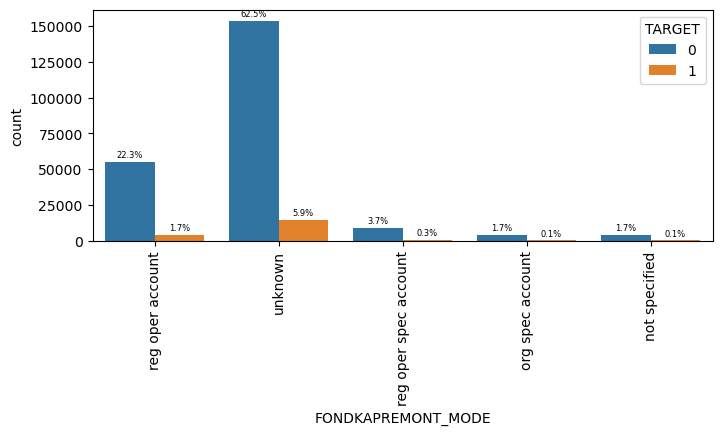

In [76]:
plot_counts(df_train, 'FONDKAPREMONT_MODE', 'TARGET', 8, 3, 6, show_percentages=True)

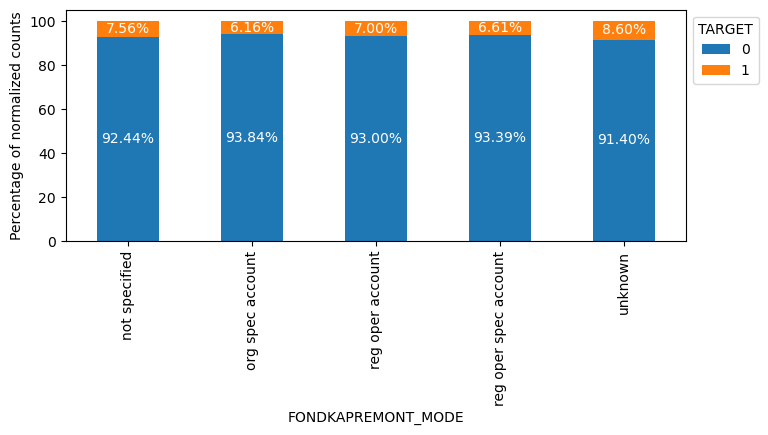

In [77]:
plot_normalized_counts(df_train, 'FONDKAPREMONT_MODE', 'TARGET', 8, 3, 10, show_percentages=True)

* The distribution of the target label varies, indicating that the feature is likely to contribute significantly to the modeling process.

### Column 'WALLSMATERIAL_MODE'，with high percentage of missing value 50.80% , fill with 'unknown'.

In [78]:
# fillin NaN as a new group
df_train.WALLSMATERIAL_MODE.fillna('unknown',inplace = True)

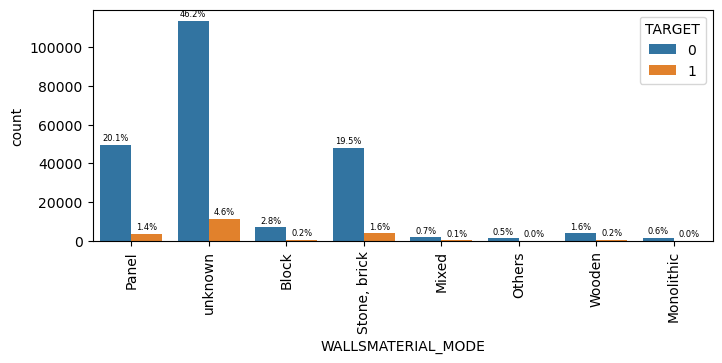

In [79]:
plot_counts(df_train, 'WALLSMATERIAL_MODE', 'TARGET', 8, 3, 6, show_percentages=True)

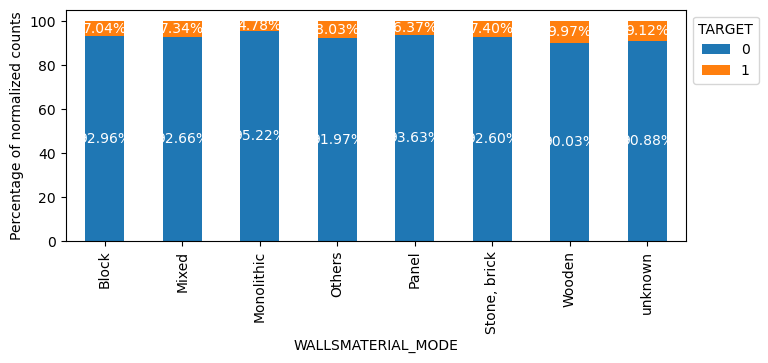

In [80]:
plot_normalized_counts(df_train, 'WALLSMATERIAL_MODE', 'TARGET', 8, 3, 10, show_percentages=True)

* The distribution of the target label varies, suggesting that the feature is likely to play a significant role in the modeling process.

### Column 'HOUSETYPE_MODE'，with high percentage of missing value 50.13% , fill with 'unknown'.

In [81]:
# fillin NaN as a new group
df_train.HOUSETYPE_MODE.fillna('unknown',inplace = True)

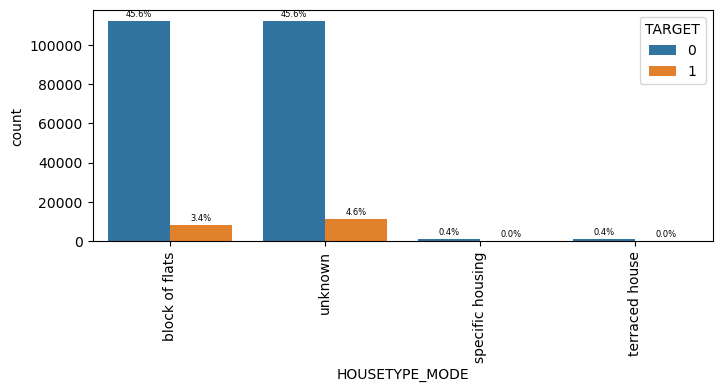

In [82]:
plot_counts(df_train, 'HOUSETYPE_MODE', 'TARGET', 8, 3, 6, show_percentages=True)

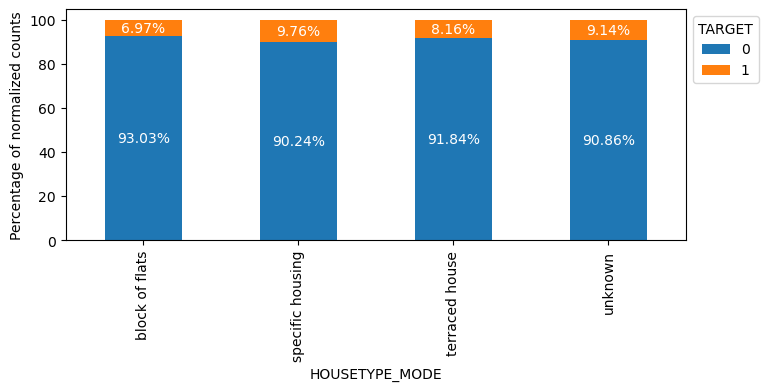

In [83]:
plot_normalized_counts(df_train, 'HOUSETYPE_MODE', 'TARGET', 8, 3, 10, show_percentages=True)

* The distribution of the target label varies, which suggests that the feature is likely to make a meaningful contribution to the modeling process.

### Column 'EMERGENCYSTATE_MODE'，with high percentage of missing value 47.39% , fill with 'unknown'.

In [84]:
# fillin NaN as a new group
df_train.EMERGENCYSTATE_MODE.fillna('unknown',inplace = True)

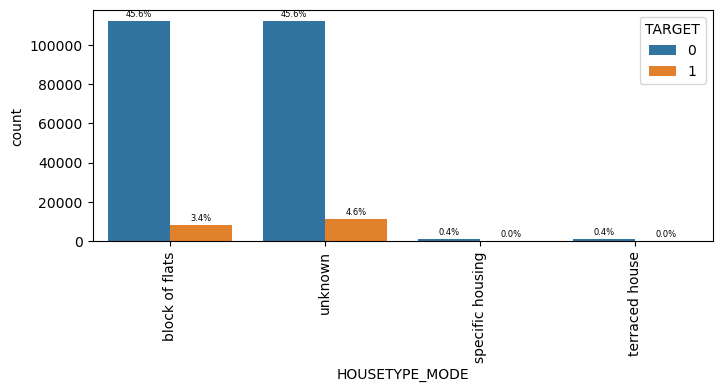

In [85]:
plot_counts(df_train, 'HOUSETYPE_MODE', 'TARGET', 8, 3, 6, show_percentages=True)

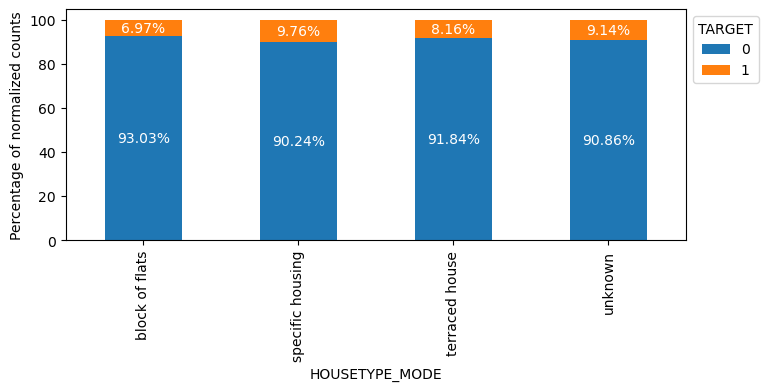

In [86]:
plot_normalized_counts(df_train, 'HOUSETYPE_MODE', 'TARGET', 8, 3, 10, show_percentages=True)

* The target label distribution exhibits variation, indicating that the feature is likely to be influential in the modeling process.

### Column 'OCCUPATION_TYPE'，with high percentage of missing value 31.27% , fill with 'unknown'.

In [87]:
# fillin NaN as a new group
df_train.OCCUPATION_TYPE.fillna('unknown',inplace = True)

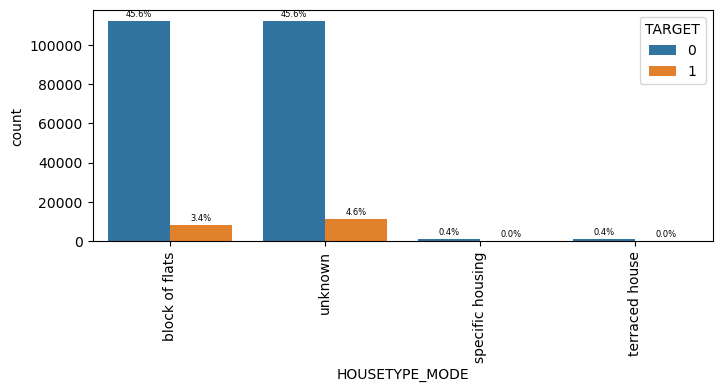

In [88]:
plot_counts(df_train, 'HOUSETYPE_MODE', 'TARGET', 8, 3, 6, show_percentages=True)

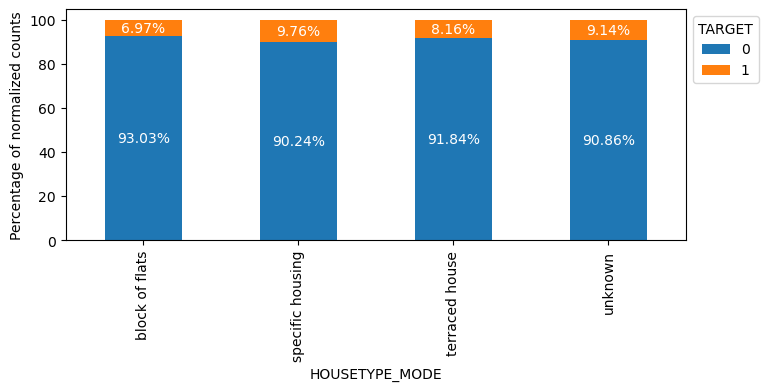

In [89]:
plot_normalized_counts(df_train, 'HOUSETYPE_MODE', 'TARGET', 8, 3, 10, show_percentages=True)

* The distribution of the target label demonstrates variation, suggesting that the feature is likely to have a significant impact on the modeling process.

<a id='Data_Quality'></a>
<h2 style="color:blue">Univariate Analysis - Numerical Features</h2>

- Missing values fillin
- Outliers elimination
- data distribution: normal or skewed
- Distribution of data in each target label class. Infer the importance of each variable.

There are several factors that can affect the choice of method for filling in missing values of numerical features, including:
1. The type and distribution of missing values: The type of missing values can be categorized into three types: missing completely at random (MCAR), missing at random (MAR), and missing not at random (MNAR). The distribution of missing values can also impact the choice of method. For instance, if the missing values are sporadic, then interpolation or regression-based imputation may be appropriate, while if the missing values are clustered, then k-nearest neighbors imputation may be more suitable.
2. The level of correlation between variables: The degree of correlation between variables can influence the choice of method. For example, if there is a high correlation between variables, regression-based imputation may be more effective, while if the correlation is low, then k-nearest neighbors imputation may be more suitable.
3. The amount of missing data: The amount of missing data can also impact the choice of method. For instance, if the amount of missing data is relatively small, then mean or median imputation may be appropriate. However, if there is a large amount of missing data, then more sophisticated methods such as interpolation or regression-based imputation may be more effective.

### Check missing values in numerical columns

In [90]:
# numerical columns in the dataset
print("There are {} numerical columns:".format(len(numerical_features)))
print('='*50)
print(numerical_features)

There are 106 numerical columns:
['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'APARTMENTS_AVG', 'BASEMENTAREA_AVG', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BUILD_AVG', 'COMMONAREA_AVG', 'ELEVATORS_AVG', 'ENTRANCES_AVG', 'FLOORSMAX_AVG', 'FLOORSMIN_AVG', 'LANDAREA_AVG', 'LIVINGAPARTMENTS_AVG', 'LIVINGAREA_AVG', 'NONLIVINGAPARTMENTS_AVG', 'NONLIVINGAREA_AVG', 'APARTMENTS_MODE', 'BASEMENTAREA_MODE', 'YEA

The top columns with the most missing values are:
COMMONAREA_MODE has 171811 missing values (69.84%).
COMMONAREA_AVG has 171811 missing values (69.84%).
COMMONAREA_MEDI has 171811 missing values (69.84%).
NONLIVINGAPARTMENTS_AVG has 170729 missing values (69.40%).
NONLIVINGAPARTMENTS_MODE has 170729 missing values (69.40%).
NONLIVINGAPARTMENTS_MEDI has 170729 missing values (69.40%).
LIVINGAPARTMENTS_MODE has 168119 missing values (68.34%).
LIVINGAPARTMENTS_AVG has 168119 missing values (68.34%).
LIVINGAPARTMENTS_MEDI has 168119 missing values (68.34%).
FLOORSMIN_MEDI has 166921 missing values (67.85%).
FLOORSMIN_MODE has 166921 missing values (67.85%).
FLOORSMIN_AVG has 166921 missing values (67.85%).
YEARS_BUILD_MEDI has 163543 missing values (66.48%).
YEARS_BUILD_MODE has 163543 missing values (66.48%).
YEARS_BUILD_AVG has 163543 missing values (66.48%).
OWN_CAR_AGE has 162418 missing values (66.02%).
LANDAREA_AVG has 145985 missing values (59.34%).
LANDAREA_MEDI has 145985 missing 

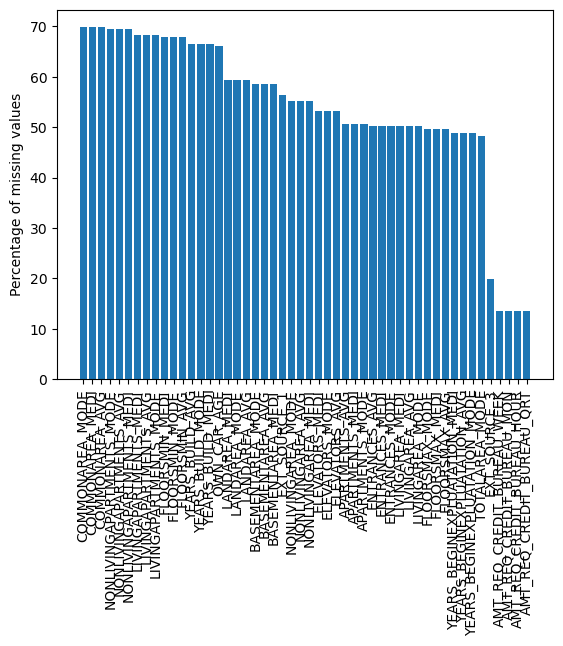

In [91]:
missing_counts = df_train[numerical_features].isnull().sum()

total_rows = len(df_train[numerical_features])

# Sort the columns by the number of missing values, in descending order
missing_counts = missing_counts.sort_values(ascending=False)

# Select the column with the most missing values
column_with_most_missing = missing_counts.index[0]
top_columns = missing_counts.index[:50]
print("The top columns with the most missing values are:")
print('='*50)

for column in top_columns:
    missing_values = missing_counts[column]
    percentage_missing = (missing_values / total_rows) * 100
    print(f"{column} has {missing_values} missing values ({percentage_missing:.2f}%).")

def plot_missing_values(df, num_col, top_n, figsize=(10, 2)):
    missing_counts = df[num_col].isna().sum()
    total_rows = len(df[num_col])

    # Select only the columns with missing percentages > 0
    missing_percentages = (missing_counts / total_rows) * 100
    missing_percentages = missing_percentages[missing_percentages > 0]

    # Sort the columns by the number of missing values, in descending order
    missing_percentages = missing_percentages.sort_values(ascending=False)

    # Select the top N columns with the most missing values
    top_columns = missing_percentages.index[:top_n]

    # Calculate the percentage of missing values for each column
    percentages = [missing_percentages[col] for col in top_columns]

    # Create a bar chart showing the percentage of missing values for each column
    plt.bar(top_columns, percentages)
    plt.xticks(rotation=90)
    plt.ylabel("Percentage of missing values")
    plt.show()

plot_missing_values(df_train, numerical_features, 50, figsize=(10, 2))

Total 61 features have missing values.


Text(0.5, 0, 'Column name')

Text(0, 0.5, 'Percentage\nof missing values')

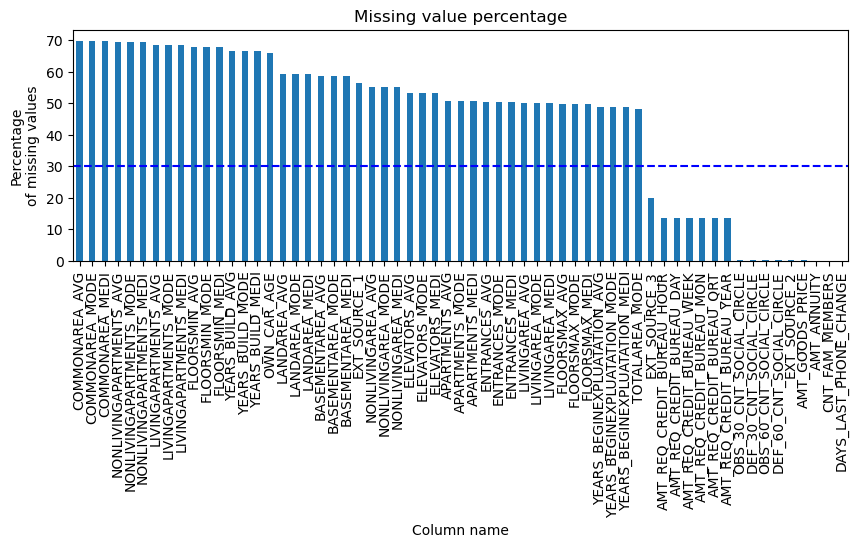

In [92]:
# Plot missing value percentage
# dash line set at 30%

print(f"Total {sum(df_train[numerical_features].isnull().mean()>0)} features have missing values.")
print('='*40)

ax = (df_train[numerical_features].isnull().mean()
            .nlargest(sum(df_train[numerical_features].isnull().mean()>0))
            .mul(100)
            .plot(kind='bar', figsize=(10,3), 
                  title='Missing value percentage')
     )

ax.axhline(y=30, color='blue', linestyle='--')
ax.set_xlabel('Column name')
ax.set_ylabel('Percentage\nof missing values')
plt.show()

**First, check columns with missing values over 50%.**

In [94]:
# check the correlation of columns with missing values over 30% with target label y

col_missing_50 = [col for col in missing_counts.index if missing_counts[col] / len(df_train) > 0.5]
df_train[['TARGET'] + col_missing_50].corr()

,TARGET,COMMONAREA_MODE,COMMONAREA_AVG,COMMONAREA_MEDI,NONLIVINGAPARTMENTS_AVG,NONLIVINGAPARTMENTS_MODE,NONLIVINGAPARTMENTS_MEDI,LIVINGAPARTMENTS_MODE,LIVINGAPARTMENTS_AVG,LIVINGAPARTMENTS_MEDI,FLOORSMIN_MEDI,FLOORSMIN_MODE,FLOORSMIN_AVG,YEARS_BUILD_MEDI,YEARS_BUILD_MODE,YEARS_BUILD_AVG,OWN_CAR_AGE,LANDAREA_AVG,LANDAREA_MEDI,LANDAREA_MODE,BASEMENTAREA_MEDI,BASEMENTAREA_AVG,BASEMENTAREA_MODE,EXT_SOURCE_1,NONLIVINGAREA_MODE,NONLIVINGAREA_MEDI,NONLIVINGAREA_AVG,ELEVATORS_MEDI,ELEVATORS_AVG,ELEVATORS_MODE,APARTMENTS_MEDI,APARTMENTS_MODE,APARTMENTS_AVG,ENTRANCES_MEDI,ENTRANCES_MODE,ENTRANCES_AVG,LIVINGAREA_AVG,LIVINGAREA_MODE,LIVINGAREA_MEDI
TARGET,1.000000,-0.013730,-0.015986,-0.015961,-0.000410,0.001296,0.000027,-0.022923,-0.024566,-0.024099,-0.033524,-0.032652,-0.033705,-0.021602,-0.021068,-0.021413,0.038289,-0.008729,-0.009267,-0.008176,-0.020792,-0.021554,-0.019014,-0.155362,-0.011805,-0.012257,-0.012641,-0.034062,-0.034463,-0.032301,-0.029158,-0.027215,-0.029359,-0.019196,-0.017709,-0.019548,-0.032414,-0.030305,-0.032261
COMMONAREA_MODE,-0.013730,1.000000,0.975988,0.978934,0.105712,0.110966,0.107489,0.540931,0.525802,0.529648,0.273785,0.276027,0.274452,0.222674,0.226730,0.223164,-0.026506,0.268174,0.270951,0.268091,0.408518,0.405366,0.410984,0.029486,0.230126,0.223989,0.220003,0.507949,0.506557,0.510296,0.535194,0.533247,0.533265,0.337025,0.328459,0.337646,0.538913,0.541654,0.540352
COMMONAREA_AVG,-0.015986,0.975988,1.000000,0.995660,0.108701,0.106505,0.108607,0.527899,0.535672,0.537005,0.293818,0.287841,0.294647,0.231197,0.228564,0.231631,-0.032481,0.257652,0.259244,0.245955,0.407747,0.408865,0.391578,0.035357,0.218610,0.226427,0.227511,0.522183,0.523601,0.508237,0.541641,0.520495,0.542501,0.327571,0.306368,0.330068,0.548278,0.527568,0.547148
COMMONAREA_MEDI,-0.015961,0.978934,0.995660,1.000000,0.108650,0.107678,0.109571,0.531087,0.536477,0.539765,0.292487,0.286599,0.293040,0.232284,0.229807,0.232330,-0.031917,0.259771,0.261663,0.249137,0.410096,0.410380,0.394487,0.034205,0.220750,0.228164,0.227725,0.524068,0.523645,0.509918,0.544552,0.523703,0.543563,0.330331,0.309264,0.331731,0.549523,0.530762,0.550060
NONLIVINGAPARTMENTS_AVG,-0.000410,0.105712,0.108701,0.108650,1.000000,0.970068,0.989047,0.139923,0.159714,0.154707,0.078931,0.076294,0.079532,0.070689,0.069810,0.071160,-0.024179,0.065575,0.067729,0.061892,0.097787,0.098284,0.092778,0.017272,0.216246,0.223685,0.224913,0.125049,0.125265,0.118392,0.188763,0.178821,0.193559,0.060185,0.051322,0.060936,0.139597,0.132311,0.138575
NONLIVINGAPARTMENTS_MODE,0.001296,0.110966,0.106505,0.107678,0.970068,1.000000,0.981259,0.143568,0.144969,0.145995,0.072011,0.073623,0.072052,0.064669,0.066569,0.064659,-0.021629,0.064845,0.065826,0.065494,0.097592,0.096919,0.098854,0.015032,0.221110,0.218425,0.217474,0.119559,0.118799,0.119090,0.185358,0.183938,0.186705,0.064102,0.060459,0.064024,0.134513,0.136113,0.134508
NONLIVINGAPARTMENTS_MEDI,0.000027,0.107489,0.108607,0.109571,0.989047,0.981259,1.000000,0.141760,0.155024,0.155819,0.077631,0.075133,0.077755,0.069252,0.068625,0.069358,-0.023589,0.064493,0.065315,0.060407,0.098444,0.098294,0.094478,0.016694,0.218725,0.225448,0.225220,0.125321,0.124738,0.119267,0.190477,0.181809,0.191942,0.061857,0.053712,0.062082,0.139913,0.134212,0.139584
LIVINGAPARTMENTS_MODE,-0.022923,0.540931,0.527899,0.531087,0.139923,0.143568,0.141760,1.000000,0.969449,0.975138,0.424057,0.427873,0.425037,0.323213,0.330769,0.324279,-0.043193,0.431291,0.435956,0.437849,0.654117,0.649819,0.657202,0.039346,0.288720,0.285276,0.283052,0.800567,0.799062,0.810610,0.934145,0.940871,0.933212,0.577622,0.571232,0.578856,0.874517,0.881550,0.876144
LIVINGAPARTMENTS_AVG,-0.024566,0.525802,0.535672,0.536477,0.159714,0.144969,0.155024,0.969449,1.000000,0.993621,0.436477,0.429999,0.438506,0.330498,0.329706,0.331785,-0.050165,0.416378,0.419700,0.409333,0.649458,0.649358,0.628019,0.046535,0.275337,0.287780,0.290218,0.810824,0.813318,0.796596,0.936922,0.910617,0.945033,0.564423,0.535247,0.568682,0.8

**Decide to drop those columns with missing valuse more than 50% and poor correlation with TARGET under 0.1**

In [95]:
poor_corr = [col for col in col_missing_50 if abs(df_train[col].corr(df_train['TARGET'])) < 0.1]

In [96]:
df_train.drop(poor_corr,axis = 1, inplace = True)

In [97]:
# update num_col
for col in poor_corr:
    numerical_features.remove(col)

**Next, we need to check the pattern of missing in numerical columns.**

<AxesSubplot:>

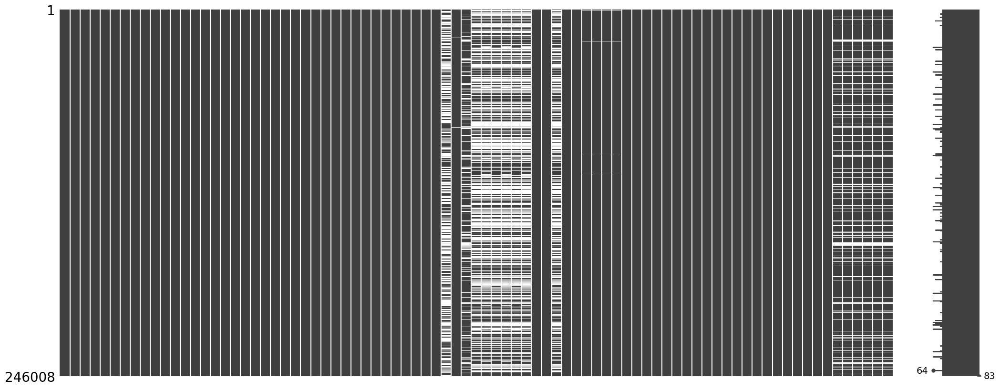

In [98]:
msno.matrix(df_train)

**For the rest of numerical columns with missing values, I will fillin using different strategy**

- For missing values less than 10%:
    - check missing value distribution in the column, is it MCAR or not?
    - check data distribution in the column
    - fillin with mean for columns with normal distribution
    - fillin with median for columns with skewed distribution
    - check if there is abnormal data distribution
    
- For missing values over 10%, check missing value distribution in the columns
    - if missing is MCAR: fillin with interpolation or regression based strategy
        - if column has good correlation with target label, used regression based strategy
        - if no good correlation, use interpolation to fillin
    - if missing is not MCAR: fillin with KNN
   

**Check the distribution of missing values in each numerical column to see if the missingness is MCAR (missing completely at random) or not**

In [99]:
# check if missing in these column is MCAR (missing completely at random)
import sys
from scipy import stats
from scipy.stats import ttest_ind

In [100]:
num_col_with_missing = [col for col in df_train.columns if df_train[col].isnull().sum() > 0 ]

In [101]:
# Calculate percentage of missing values for each column and determine MCAR
mcar_cols = []
non_mcar_cols = []
for col in num_col_with_missing:
    missing_percentages = df_train[col].isnull().sum() / len(df_train) * 100
    if missing_percentages == 0:
        continue
    elif missing_percentages == 100:
        non_mcar_cols.append(col)
    else:
        p_value = 1.0  # initialize p-value
        # Check MCAR by comparing original column with a column with missing 
        # values imputed using mean imputation
        col_imputed = df_train[col].fillna(df_train[col].mean())
        t_statistic, p_value = stats.ttest_ind(df_train[col], col_imputed, equal_var=False)
        if p_value < 0.05:
            non_mcar_cols.append(col)
        else:
            mcar_cols.append(col)
    
print("MCAR columns:", mcar_cols)
print("Non-MCAR columns:", non_mcar_cols)

MCAR columns: ['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'YEARS_BEGINEXPLUATATION_AVG', 'FLOORSMAX_AVG', 'YEARS_BEGINEXPLUATATION_MODE', 'FLOORSMAX_MODE', 'YEARS_BEGINEXPLUATATION_MEDI', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE', 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']
Non-MCAR columns: []


* For all numerical columns with missing values, it appears that the missingness is Missing Completely at Random (MCAR). In cases where the missingness is severe, methods such as interpolation or regression-based imputation may be appropriate. On the other hand, if the missingness is relatively light, filling the missing values with the mean or median could be suitable.

**Next, we will divide the columns with missing values into two groups based on the severity of the missingness.**

In [102]:
miss_percent = df_train.isna().mean() * 100
num_col_light = miss_percent[(miss_percent < 10) & (miss_percent != 0)].index
num_col_heavy = miss_percent[(miss_percent > 10) & (miss_percent != 0)].index

In [103]:
print("There are {} numerical columns with light missing:".format(len(num_col_light)))
print(num_col_light)
print('='*80)
print("There are {} numerical columns with heavy missing:".format(len(num_col_heavy)))
print(num_col_heavy)

There are 9 numerical columns with light missing:
Index(['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_2',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE'],
      dtype='object')
There are 15 numerical columns with heavy missing:
Index(['EXT_SOURCE_1', 'EXT_SOURCE_3', 'YEARS_BEGINEXPLUATATION_AVG',
       'FLOORSMAX_AVG', 'YEARS_BEGINEXPLUATATION_MODE', 'FLOORSMAX_MODE',
       'YEARS_BEGINEXPLUATATION_MEDI', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')


### Mising value fillin for columns with light missing

array([[<AxesSubplot:title={'center':'AMT_ANNUITY'}>,
        <AxesSubplot:title={'center':'AMT_GOODS_PRICE'}>,
        <AxesSubplot:title={'center':'CNT_FAM_MEMBERS'}>],
       [<AxesSubplot:title={'center':'EXT_SOURCE_2'}>,
        <AxesSubplot:title={'center':'OBS_30_CNT_SOCIAL_CIRCLE'}>,
        <AxesSubplot:title={'center':'DEF_30_CNT_SOCIAL_CIRCLE'}>],
       [<AxesSubplot:title={'center':'OBS_60_CNT_SOCIAL_CIRCLE'}>,
        <AxesSubplot:title={'center':'DEF_60_CNT_SOCIAL_CIRCLE'}>,
        <AxesSubplot:title={'center':'DAYS_LAST_PHONE_CHANGE'}>]],
      dtype=object)

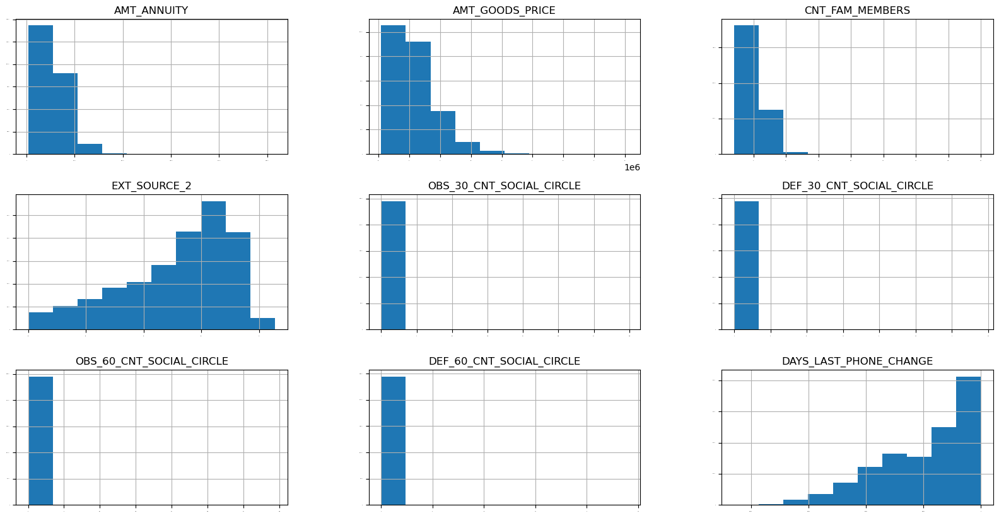

In [104]:
# Check data distribution
df_train[num_col_light].hist(sharex=False, sharey=False,xlabelsize=1,ylabelsize=1,figsize=(20,10))
plt.show()

* The columns 'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', and 'DEF_60_CNT_SOCIAL_CIRCLE' exhibit abnormal characteristics. As a result, we need to handle them as special cases in our data analysis.

In [105]:
# Get value counts and percentage frequencies for column OBS_30_CNT_SOCIAL_CIRCLE
value_counts = df_train['OBS_30_CNT_SOCIAL_CIRCLE'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['OBS_30_CNT_SOCIAL_CIRCLE'])) * 100

## Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)
# calculate variance of column OBS_30_CNT_SOCIAL_CIRCLE 
print('variance of \'OBS_30_CNT_SOCIAL_CIRCLE\': ', df_train['OBS_30_CNT_SOCIAL_CIRCLE'].var())

                           Count  Percentage
OBS_30_CNT_SOCIAL_CIRCLE                    
0.0                       131101   53.291356
1.0                        39064   15.879158
2.0                        23832    9.687490
3.0                        16269    6.613200
4.0                        11352    4.614484
variance of 'OBS_30_CNT_SOCIAL_CIRCLE':  5.853854302712922


In [106]:
# Get value counts and percentage frequencies for column DEF_30_CNT_SOCIAL_CIRCLE
value_counts = df_train['DEF_30_CNT_SOCIAL_CIRCLE'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['DEF_30_CNT_SOCIAL_CIRCLE'])) * 100

## Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)
# calculate variance of column DEF_30_CNT_SOCIAL_CIRCLE 
print('variance of \'DEF_30_CNT_SOCIAL_CIRCLE\': ', df_train['DEF_30_CNT_SOCIAL_CIRCLE'].var())

                           Count  Percentage
DEF_30_CNT_SOCIAL_CIRCLE                    
0.0                       217088   88.244285
1.0                        22600    9.186693
2.0                         4299    1.747504
3.0                          956    0.388605
NaN                          811    0.329664
variance of 'DEF_30_CNT_SOCIAL_CIRCLE':  0.2006933670623495


In [107]:
# Get value counts and percentage frequencies for column OBS_60_CNT_SOCIAL_CIRCLE
value_counts = df_train['OBS_60_CNT_SOCIAL_CIRCLE'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['OBS_60_CNT_SOCIAL_CIRCLE'])) * 100

## Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)
# calculate variance of column OBS_60_CNT_SOCIAL_CIRCLE 
print('variance of \'OBS_60_CNT_SOCIAL_CIRCLE\': ', df_train['OBS_60_CNT_SOCIAL_CIRCLE'].var())

                           Count  Percentage
OBS_60_CNT_SOCIAL_CIRCLE                    
0.0                       131706   53.537283
1.0                        39133   15.907206
2.0                        23810    9.678547
3.0                        16166    6.571331
4.0                        11202    4.553510
variance of 'OBS_60_CNT_SOCIAL_CIRCLE':  5.751092715976129


In [108]:
# Get value counts and percentage frequencies for column DEF_60_CNT_SOCIAL_CIRCLE
value_counts = df_train['DEF_60_CNT_SOCIAL_CIRCLE'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['DEF_60_CNT_SOCIAL_CIRCLE'])) * 100

## Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)
# calculate variance of column OBS_60_CNT_SOCIAL_CIRCLE 
print('variance of \'DEF_60_CNT_SOCIAL_CIRCLE\': ', df_train['DEF_60_CNT_SOCIAL_CIRCLE'].var())

                           Count  Percentage
DEF_60_CNT_SOCIAL_CIRCLE                    
0.0                       224667   91.325079
1.0                        17404    7.074567
2.0                         2531    1.028828
NaN                          811    0.329664
3.0                          474    0.192677
variance of 'DEF_60_CNT_SOCIAL_CIRCLE':  0.13085338318202142


- **Column DEF_30_CNT_SOCIAL_CIRCLE: 88% data is just one value. Extremely low variance (0.2).**
- **Column DEF_60_CNT_SOCIAL_CIRCLE: 91% data is just one value. Extremely low variance (0.13).**
- **Drop these two columns.**

In [109]:
# Check the distribution of the binary target label
target_dist = df_train['TARGET'].value_counts(normalize=True)
print("Target distribution:\n", target_dist)

# Check the distribution of the binary target label within the dominant value of DEF_30_CNT_SOCIAL_CIRCLE
dominant_value = df_train['DEF_30_CNT_SOCIAL_CIRCLE'].mode().iloc[0]
dominant_value_dist = df_train.loc[df_train['DEF_30_CNT_SOCIAL_CIRCLE'] == dominant_value, 'TARGET'].value_counts(normalize=True)
print(f"\nTarget distribution within dominant value ({dominant_value}):\n", dominant_value_dist)

Target distribution:
 TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64

Target distribution within dominant value (0.0):
 TARGET
0    0.922234
1    0.077766
Name: proportion, dtype: float64


In [110]:
# check correlation between column DEF_30_CNT_SOCIAL_CIRCLE and target label TARGET
df_train['DEF_30_CNT_SOCIAL_CIRCLE'].corr(df_train.TARGET)

0.03205897889276275

**Target label distribution is the same in dominant value as base rate. Correlation of DEF_30_CNT_SOCIAL_CIRCLE with TARGET is also very low. So we can drop column DEF_30_CNT_SOCIAL_CIRCLE.**

In [111]:
# group by unique values in column 'x79' and calculate the target label distribution for each group
df_train.groupby('DEF_60_CNT_SOCIAL_CIRCLE')['TARGET'].value_counts(normalize=True, dropna=False)

DEF_60_CNT_SOCIAL_CIRCLE  TARGET
0.0                       0         0.921715
                          1         0.078285
1.0                       0         0.894162
                          1         0.105838
2.0                       0         0.879494
                          1         0.120506
3.0                       0         0.837553
                          1         0.162447
4.0                       0         0.870000
                          1         0.130000
5.0                       0         0.823529
                          1         0.176471
6.0                       0         1.000000
7.0                       0         1.000000
24.0                      0         1.000000
Name: proportion, dtype: float64

In [112]:
# Check the distribution of the binary target label
target_dist = df_train['TARGET'].value_counts(normalize=True)
print("Target distribution:\n", target_dist)

# Check the distribution of the binary target label within the dominant value of DEF_60_CNT_SOCIAL_CIRCLE
dominant_value = df_train['DEF_60_CNT_SOCIAL_CIRCLE'].mode().iloc[0]
dominant_value_dist = df_train.loc[df_train['DEF_60_CNT_SOCIAL_CIRCLE'] == dominant_value, 'TARGET'].value_counts(normalize=True)
print(f"\nTarget distribution within dominant value ({dominant_value}):\n", dominant_value_dist)

Target distribution:
 TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64

Target distribution within dominant value (0.0):
 TARGET
0    0.921715
1    0.078285
Name: proportion, dtype: float64


In [113]:
# check correlation between column DEF_60_CNT_SOCIAL_CIRCLE and target label TARGET
df_train['DEF_60_CNT_SOCIAL_CIRCLE'].corr(df_train.TARGET)

0.03207389413640713

* Target label distribution is the same in dominant value as base rate. Correlation of DEF_60_CNT_SOCIAL_CIRCLE with TARGET is also very low. So we can drop column DEF_60_CNT_SOCIAL_CIRCLE.

In [114]:
#drop column 'DEF_30_CNT_SOCIAL_CIRCLE' and 'DEF_60_CNT_SOCIAL_CIRCLE'.
df_train.drop(['DEF_30_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE'],axis = 1, inplace = True)

In [115]:
# update cat_col
numerical_features.remove('DEF_30_CNT_SOCIAL_CIRCLE')
numerical_features.remove('DEF_60_CNT_SOCIAL_CIRCLE')

* Next we are going to update the num_col_light. Calculate the skewness of each column and group columns based on data distribution. Fillin missing values with mean for normal distributed columns and median for skewed columns.

In [116]:
# update the num_col_light
miss_percent = df_train.isna().mean() * 100
num_col_light = miss_percent[(miss_percent < 10) & (miss_percent != 0)].index
num_col_light

Index(['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_2',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE',
       'DAYS_LAST_PHONE_CHANGE'],
      dtype='object')

In [117]:
# separate features based on data distribition
num_col_light_normal = [col for col in num_col_light if abs(df_train[col].skew()) < 0.5]
num_col_light_skew = [col for col in num_col_light if abs(df_train[col].skew()) >= 0.5]
print('Normal columns:', num_col_light_normal)
print('Skewed columns:', num_col_light_skew)

Normal columns: []
Skewed columns: ['AMT_ANNUITY', 'AMT_GOODS_PRICE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_2', 'OBS_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE']


In [118]:
# fill missing values in num_col_light_normal with mean
df_train[num_col_light_normal] = df_train[num_col_light_normal].fillna(df_train[num_col_light_normal].mean())

# fill missing values in num_col_light_skew with median
df_train[num_col_light_skew] = df_train[num_col_light_skew].fillna(df_train[num_col_light_skew].median())

### Mising value fillin for columns with heavy missing

array([[<AxesSubplot:title={'center':'EXT_SOURCE_1'}>,
        <AxesSubplot:title={'center':'EXT_SOURCE_3'}>,
        <AxesSubplot:title={'center':'YEARS_BEGINEXPLUATATION_AVG'}>,
        <AxesSubplot:title={'center':'FLOORSMAX_AVG'}>],
       [<AxesSubplot:title={'center':'YEARS_BEGINEXPLUATATION_MODE'}>,
        <AxesSubplot:title={'center':'FLOORSMAX_MODE'}>,
        <AxesSubplot:title={'center':'YEARS_BEGINEXPLUATATION_MEDI'}>,
        <AxesSubplot:title={'center':'FLOORSMAX_MEDI'}>],
       [<AxesSubplot:title={'center':'TOTALAREA_MODE'}>,
        <AxesSubplot:title={'center':'AMT_REQ_CREDIT_BUREAU_HOUR'}>,
        <AxesSubplot:title={'center':'AMT_REQ_CREDIT_BUREAU_DAY'}>,
        <AxesSubplot:title={'center':'AMT_REQ_CREDIT_BUREAU_WEEK'}>],
       [<AxesSubplot:title={'center':'AMT_REQ_CREDIT_BUREAU_MON'}>,
        <AxesSubplot:title={'center':'AMT_REQ_CREDIT_BUREAU_QRT'}>,
        <AxesSubplot:title={'center':'AMT_REQ_CREDIT_BUREAU_YEAR'}>,
        <AxesSubplot:>]], dtype=objec

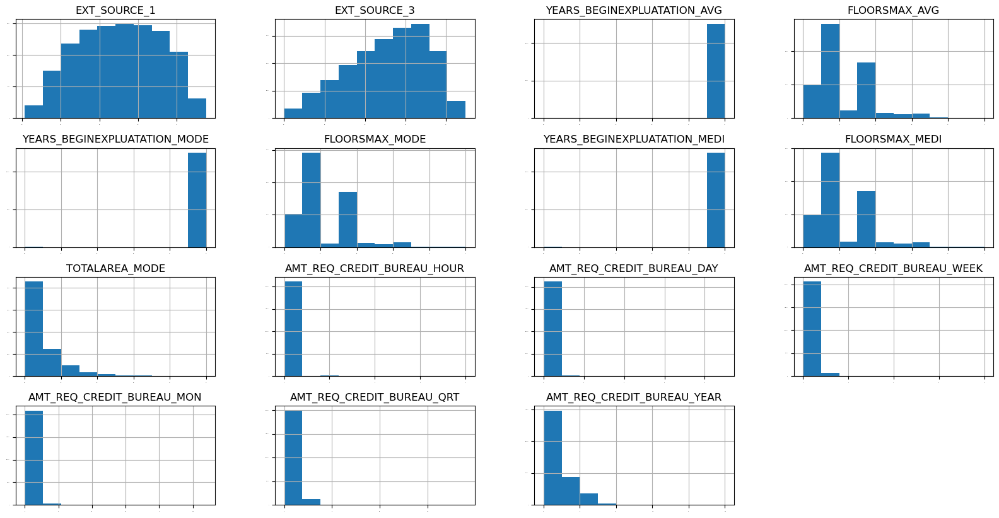

In [119]:
# Check data distribution
df_train[num_col_heavy].hist(sharex=False, sharey=False,xlabelsize=1,ylabelsize=1,figsize=(20,10))
plt.show()

In [120]:
num_col_heavy

Index(['EXT_SOURCE_1', 'EXT_SOURCE_3', 'YEARS_BEGINEXPLUATATION_AVG',
       'FLOORSMAX_AVG', 'YEARS_BEGINEXPLUATATION_MODE', 'FLOORSMAX_MODE',
       'YEARS_BEGINEXPLUATATION_MEDI', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE',
       'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY',
       'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON',
       'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

**Columns YEARS_BEGINEXPLUATATION_AVG,YEARS_BEGINEXPLUATATION_MODE,YEARS_BEGINEXPLUATATION_MEDI,'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK', 'AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT', are abnormal. We need to treat them as special cases.**

- **check YEARS_BEGINEXPLUATATION_AVG**

In [121]:
# Get value counts and percentage frequencies for column YEARS_BEGINEXPLUATATION_AVG
value_counts = df_train['YEARS_BEGINEXPLUATATION_AVG'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['YEARS_BEGINEXPLUATATION_AVG'])) * 100

# Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)

                              Count  Percentage
YEARS_BEGINEXPLUATATION_AVG                    
NaN                          119949   48.758170
0.9871                         3486    1.417027
0.9856                         3369    1.369468
0.9801                         3344    1.359305
0.9861                         3343    1.358899


In [122]:
df_train['YEARS_BEGINEXPLUATATION_AVG'].nunique()

267

In [123]:
# calculate variance of column YEARS_BEGINEXPLUATATION_AVG
df_train['YEARS_BEGINEXPLUATATION_AVG'].corr(df_train.TARGET)

-0.010706133458571519

- **check YEARS_BEGINEXPLUATATION_MODE**

In [124]:
# Get value counts and percentage frequencies for column YEARS_BEGINEXPLUATATION_MODE
value_counts = df_train['YEARS_BEGINEXPLUATATION_MODE'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['YEARS_BEGINEXPLUATATION_MODE'])) * 100

# Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)

                               Count  Percentage
YEARS_BEGINEXPLUATATION_MODE                    
NaN                           119949   48.758170
0.9871                          3446    1.400767
0.9866                          3367    1.368655
0.9861                          3352    1.362557
0.9801                          3309    1.345078


In [125]:
df_train['YEARS_BEGINEXPLUATATION_MODE'].nunique()

214

In [126]:
# calculate variance of column YEARS_BEGINEXPLUATATION_MODE
df_train['YEARS_BEGINEXPLUATATION_MODE'].corr(df_train.TARGET)

-0.009836093974712207

- **check YEARS_BEGINEXPLUATATION_MEDI**

In [127]:
# Get value counts and percentage frequencies for column YEARS_BEGINEXPLUATATION_MEDI
value_counts = df_train['YEARS_BEGINEXPLUATATION_MEDI'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['YEARS_BEGINEXPLUATATION_MEDI'])) * 100

# Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)

                               Count  Percentage
YEARS_BEGINEXPLUATATION_MEDI                    
NaN                           119949   48.758170
0.9871                          3474    1.412149
0.9861                          3407    1.384914
0.9856                          3377    1.372720
0.9866                          3330    1.353615


In [128]:
df_train['YEARS_BEGINEXPLUATATION_MEDI'].nunique()

235

In [129]:
# calculate variance of column YEARS_BEGINEXPLUATATION_MEDI
df_train['YEARS_BEGINEXPLUATATION_MEDI'].corr(df_train.TARGET)

-0.010809428357375323

In [130]:
# Check the distribution of the binary target label
target_dist = df_train['TARGET'].value_counts(normalize=True)
print("Target distribution:\n", target_dist)

# Check the distribution of the binary target label within the dominant value of YEARS_BEGINEXPLUATATION_MEDI
dominant_value = df_train['YEARS_BEGINEXPLUATATION_MEDI'].mode().iloc[0]
dominant_value_dist = df_train.loc[df_train['YEARS_BEGINEXPLUATATION_MEDI'] == dominant_value, 'TARGET'].value_counts(normalize=True)
print(f"\nTarget distribution within dominant value ({dominant_value}):\n", dominant_value_dist)

Target distribution:
 TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64

Target distribution within dominant value (0.9871):
 TARGET
0    0.933794
1    0.066206
Name: proportion, dtype: float64


- **check AMT_REQ_CREDIT_BUREAU_HOUR**

In [131]:
# Get value counts and percentage frequencies for column AMT_REQ_CREDIT_BUREAU_HOUR
value_counts = df_train['AMT_REQ_CREDIT_BUREAU_HOUR'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['AMT_REQ_CREDIT_BUREAU_HOUR'])) * 100

# Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)

                             Count  Percentage
AMT_REQ_CREDIT_BUREAU_HOUR                    
0.0                         211484   85.966310
NaN                          33244   13.513382
1.0                           1230    0.499984
2.0                             43    0.017479
3.0                              6    0.002439


In [132]:
# calculate variance of column AMT_REQ_CREDIT_BUREAU_HOUR
df_train['AMT_REQ_CREDIT_BUREAU_HOUR'].corr(df_train.TARGET)

0.0012148101909419293

In [133]:
#Check the distribution of the binary target label
target_dist = df_train['TARGET'].value_counts(normalize=True)
print("Target distribution:\n", target_dist)

# Check the distribution of the binary target label within the dominant value of AMT_REQ_CREDIT_BUREAU_HOUR
dominant_value = df_train['AMT_REQ_CREDIT_BUREAU_HOUR'].mode().iloc[0]
dominant_value_dist = df_train.loc[df_train['AMT_REQ_CREDIT_BUREAU_HOUR'] == dominant_value, 'TARGET'].value_counts(normalize=True)
print(f"\nTarget distribution within dominant value ({dominant_value}):\n", dominant_value_dist)

Target distribution:
 TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64

Target distribution within dominant value (0.0):
 TARGET
0    0.922836
1    0.077164
Name: proportion, dtype: float64


- **The distribution of the target label in the dominant value is the same as the base rate. Additionally, the correlation between the 'AMT_REQ_CREDIT_BUREAU_HOUR' column and the target label is also very low. Based on these findings, I have decided to drop the 'AMT_REQ_CREDIT_BUREAU_HOUR' column from the dataset.**
* When referring to the target label distribution being the same as the base rate, it means that the proportion of positive and negative instances in the target variable is similar to the overall prevalence or occurrence rate of the positive class in the dataset.

* For example, if the base rate is 20%, it implies that 20% of the instances in the dataset belong to the positive class, while the remaining 80% belong to the negative class. When the target label distribution aligns closely with the base rate, it indicates that the distribution of positive and negative instances in the target variable is consistent with the overall prevalence observed in the data.

- **check AMT_REQ_CREDIT_BUREAU_DAY**

In [134]:
# Get value counts and percentage frequencies for column AMT_REQ_CREDIT_BUREAU_DAY
value_counts = df_train['AMT_REQ_CREDIT_BUREAU_DAY'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['AMT_REQ_CREDIT_BUREAU_DAY'])) * 100

# Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)

                            Count  Percentage
AMT_REQ_CREDIT_BUREAU_DAY                    
0.0                        211591   86.009805
NaN                         33244   13.513382
1.0                          1020    0.414621
2.0                            84    0.034145
3.0                            33    0.013414


In [135]:
# calculate variance of column AMT_REQ_CREDIT_BUREAU_DAY
df_train['AMT_REQ_CREDIT_BUREAU_DAY'].corr(df_train.TARGET)

0.003302183456178626

In [136]:
#Check the distribution of the binary target label
target_dist = df_train['TARGET'].value_counts(normalize=True)
print("Target distribution:\n", target_dist)

# Check the distribution of the binary target label within the dominant value of AMT_REQ_CREDIT_BUREAU_DAY
dominant_value = df_train['AMT_REQ_CREDIT_BUREAU_DAY'].mode().iloc[0]
dominant_value_dist = df_train.loc[df_train['AMT_REQ_CREDIT_BUREAU_DAY'] == dominant_value, 'TARGET'].value_counts(normalize=True)
print(f"\nTarget distribution within dominant value ({dominant_value}):\n", dominant_value_dist)

Target distribution:
 TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64

Target distribution within dominant value (0.0):
 TARGET
0    0.922922
1    0.077078
Name: proportion, dtype: float64


- **The target label distribution in the dominant value is consistent with the base rate. Additionally, the correlation between the 'AMT_REQ_CREDIT_BUREAU_DAY' column and the target label is also very low. Based on these findings, I have made the decision to drop the 'AMT_REQ_CREDIT_BUREAU_DAY' column from the dataset.**

- **check AMT_REQ_CREDIT_BUREAU_WEEK**

In [137]:
# Get value counts and percentage frequencies for column AMT_REQ_CREDIT_BUREAU_WEEK
value_counts = df_train['AMT_REQ_CREDIT_BUREAU_WEEK'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['AMT_REQ_CREDIT_BUREAU_WEEK'])) * 100

# Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)

# calculate variance of column AMT_REQ_CREDIT_BUREAU_WEEK
print(df_train['AMT_REQ_CREDIT_BUREAU_WEEK'].corr(df_train.TARGET))

#Check the distribution of the binary target label
target_dist = df_train['TARGET'].value_counts(normalize=True)
print("Target distribution:\n", target_dist)

# Check the distribution of the binary target label within the dominant value of AMT_REQ_CREDIT_BUREAU_WEEK
dominant_value = df_train['AMT_REQ_CREDIT_BUREAU_WEEK'].mode().iloc[0]
dominant_value_dist = df_train.loc[df_train['AMT_REQ_CREDIT_BUREAU_WEEK'] == dominant_value, 'TARGET'].value_counts(normalize=True)
print(f"\nTarget distribution within dominant value ({dominant_value}):\n", dominant_value_dist)

                             Count  Percentage
AMT_REQ_CREDIT_BUREAU_WEEK                    
0.0                         205968   83.724107
NaN                          33244   13.513382
1.0                           6536    2.656824
2.0                            155    0.063006
3.0                             46    0.018699
0.0015963152721189804
Target distribution:
 TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64

Target distribution within dominant value (0.0):
 TARGET
0    0.922857
1    0.077143
Name: proportion, dtype: float64


- **target label distribution is the same in dominant value as base rate. Correlation AMT_REQ_CREDIT_BUREAU_WEEK with TARGET is also very low. I will drop this column.**

- **check AMT_REQ_CREDIT_BUREAU_MON**

In [138]:
# Get value counts and percentage frequencies for column AMT_REQ_CREDIT_BUREAU_MON
value_counts = df_train['AMT_REQ_CREDIT_BUREAU_MON'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['AMT_REQ_CREDIT_BUREAU_MON'])) * 100

# Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)

# calculate variance of column AMT_REQ_CREDIT_BUREAU_MON
print(df_train['AMT_REQ_CREDIT_BUREAU_MON'].corr(df_train.TARGET))

#Check the distribution of the binary target label
target_dist = df_train['TARGET'].value_counts(normalize=True)
print("Target distribution:\n", target_dist)

# Check the distribution of the binary target label within the dominant value of AMT_REQ_CREDIT_BUREAU_MON
dominant_value = df_train['AMT_REQ_CREDIT_BUREAU_MON'].mode().iloc[0]
dominant_value_dist = df_train.loc[df_train['AMT_REQ_CREDIT_BUREAU_MON'] == dominant_value, 'TARGET'].value_counts(normalize=True)
print(f"\nTarget distribution within dominant value ({dominant_value}):\n", dominant_value_dist)

                            Count  Percentage
AMT_REQ_CREDIT_BUREAU_MON                    
0.0                        177851   72.294803
NaN                         33244   13.513382
1.0                         26438   10.746805
2.0                          4287    1.742626
3.0                          1596    0.648759
-0.011775276626853555
Target distribution:
 TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64

Target distribution within dominant value (0.0):
 TARGET
0    0.922154
1    0.077846
Name: proportion, dtype: float64


- **check AMT_REQ_CREDIT_BUREAU_QRT**

In [139]:
# Get value counts and percentage frequencies for column AMT_REQ_CREDIT_BUREAU_QRT
value_counts = df_train['AMT_REQ_CREDIT_BUREAU_QRT'].value_counts(dropna=False).sort_values(ascending=False).head(5)
percentages = (value_counts / len(df_train['AMT_REQ_CREDIT_BUREAU_QRT'])) * 100

# Create resulting DataFrame
result = pd.DataFrame({'Count': value_counts, 'Percentage': percentages})
print(result)

# calculate variance of column AMT_REQ_CREDIT_BUREAU_MON
print(df_train['AMT_REQ_CREDIT_BUREAU_QRT'].corr(df_train.TARGET))

#Check the distribution of the binary target label
target_dist = df_train['TARGET'].value_counts(normalize=True)
print("Target distribution:\n", target_dist)

# Check the distribution of the binary target label within the dominant value of AMT_REQ_CREDIT_BUREAU_QRT
dominant_value = df_train['AMT_REQ_CREDIT_BUREAU_QRT'].mode().iloc[0]
dominant_value_dist = df_train.loc[df_train['AMT_REQ_CREDIT_BUREAU_QRT'] == dominant_value, 'TARGET'].value_counts(normalize=True)
print(f"\nTarget distribution within dominant value ({dominant_value}):\n", dominant_value_dist)

                            Count  Percentage
AMT_REQ_CREDIT_BUREAU_QRT                    
0.0                        172364   70.064388
NaN                         33244   13.513382
1.0                         27052   10.996390
2.0                         11526    4.685213
3.0                          1340    0.544698
-0.003404409064243154
Target distribution:
 TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64

Target distribution within dominant value (0.0):
 TARGET
0    0.92144
1    0.07856
Name: proportion, dtype: float64


- **drop AMT_REQ_CREDIT_BUREAU_DAY and AMT_REQ_CREDIT_BUREAU_week**

In [140]:
df_train.drop(['AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK'],axis = 1, inplace = True)
# update num_col and num_col_heavy
numerical_features.remove('AMT_REQ_CREDIT_BUREAU_WEEK')
numerical_features.remove('AMT_REQ_CREDIT_BUREAU_DAY')

In [141]:
num_col_heavy = list(num_col_heavy)
for col in ['AMT_REQ_CREDIT_BUREAU_DAY', 'AMT_REQ_CREDIT_BUREAU_WEEK']:
    num_col_heavy.remove(col)

In [142]:
df_train[num_col_heavy].head()

,EXT_SOURCE_1,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
181648,0.384582,0.622922,0.9851,0.3333,0.9851,0.3333,0.9851,0.3333,0.2197,0.0,0.0,1.0,1.0
229245,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
122525,NaN,0.598926,0.9891,0.3750,0.9891,0.3750,0.9891,0.3750,0.1269,0.0,0.0,0.0,2.0
306311,NaN,0.454321,0.9682,0.0417,0.9682,0.0417,0.9682,0.0417,0.0065,0.0,0.0,0.0,4.0
300658,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


For the remaining columns with missing data, we will apply different imputation strategies based on their characteristics.

* Firstly, we will check the correlation of each column with missing data. If a column shows a high correlation with other columns, we will utilize a regression-based strategy to impute the missing values.

* Alternatively, for normally distributed columns, we will fill in the missing values with the mean. However, for skewed columns, we will use the median as a more robust measure to fill in the missing values.

* It's important to note that interpolation imputation is typically suitable for time series data, while KNN imputation is often used for smaller datasets. Therefore, these specific strategies will not be applied in this case.

**code for interpolation imputation**

In [674]:
## Interpolate missing values using linear interpolation
#df_train['x100'] = df_train['x100'].interpolate(method='linear')

**code for KNN imputation**

In [675]:
## Import the necessary libraries
#import numpy as np
#from sklearn.impute import KNNImputer

## Create a dataframe with missing values in multiple columns
#data_KNN = train_raw_NT[['cost','price','weight']].copy()


## Instantiate the imputer
#imputer = KNNImputer(n_neighbors=3)

## Fit and transform the dataframe
#data_KNN = pd.DataFrame(imputer.fit_transform(data_KNN), columns=data_KNN.columns)
#data_KNN.head()


In [143]:
# calculate the correlation matrix of numerical columns
corr_matrix = df_train[numerical_features].corr()

# create a dataframe to store the correlation values
corr_df = pd.DataFrame(columns=['column', 'corr'])

# loop through the numerical columns with missing values
for col in num_col_heavy:
    # calculate the correlation of the column with other numerical columns
    corr_values = corr_matrix.loc[col]
    corr_values = corr_values[corr_values.index.isin(num_col_heavy)]
    mean_corr = np.mean(np.abs(corr_values))
    
    # append the results to the dataframe
    corr_df = pd.concat([corr_df, pd.DataFrame({'column': [col], 'corr': [mean_corr]})],ignore_index=True)


# sort the dataframe by correlation values in descending order
corr_df = corr_df.sort_values(by='corr', ascending=False)

# output the dataframe
print(corr_df)

                          column      corr
3                  FLOORSMAX_AVG  0.318496
7                 FLOORSMAX_MEDI  0.318395
5                 FLOORSMAX_MODE  0.316954
2    YEARS_BEGINEXPLUATATION_AVG  0.265955
6   YEARS_BEGINEXPLUATATION_MEDI  0.264940
4   YEARS_BEGINEXPLUATATION_MODE  0.258409
8                 TOTALAREA_MODE  0.255832
0                   EXT_SOURCE_1  0.121044
1                   EXT_SOURCE_3  0.100624
12    AMT_REQ_CREDIT_BUREAU_YEAR  0.098681
10     AMT_REQ_CREDIT_BUREAU_MON  0.095218
11     AMT_REQ_CREDIT_BUREAU_QRT  0.090056
9     AMT_REQ_CREDIT_BUREAU_HOUR  0.079264


In [144]:
# Define the cutoff criteria
corr_cutoff = 0.5
num_corr_columns = 3

# Create empty lists to store column names
corr_columns = []
non_corr_columns = []

# Loop through the numerical columns with missing values
for col in num_col_heavy:
    corr_with_other_cols = df_train[num_col_heavy].corr()[col]
    # Subtract 1 to exclude self-correlation
    num_corr_with_other_cols = corr_with_other_cols[(corr_with_other_cols > corr_cutoff)].shape[0] - 1 
    if num_corr_with_other_cols >= num_corr_columns:
        corr_columns.append(col)
    else:
        non_corr_columns.append(col)

print('Numerical columns with good correlation: ', corr_columns)
print('Numerical columns without good correlation: ', non_corr_columns)

Numerical columns with good correlation:  ['FLOORSMAX_AVG', 'FLOORSMAX_MODE', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE']
Numerical columns without good correlation:  ['EXT_SOURCE_1', 'EXT_SOURCE_3', 'YEARS_BEGINEXPLUATATION_AVG', 'YEARS_BEGINEXPLUATATION_MODE', 'YEARS_BEGINEXPLUATATION_MEDI', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']


In [145]:
df_train[['FLOORSMAX_AVG', 'FLOORSMAX_MODE', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE']].corr()

,FLOORSMAX_AVG,FLOORSMAX_MODE,FLOORSMAX_MEDI,TOTALAREA_MODE
FLOORSMAX_AVG,1.000000,0.985561,0.996983,0.633699
FLOORSMAX_MODE,0.985561,1.000000,0.988205,0.626663
FLOORSMAX_MEDI,0.996983,0.988205,1.000000,0.631241
TOTALAREA_MODE,0.633699,0.626663,0.631241,1.000000


**So I decise to fill 'Numerical columns with good correlation' by regression based interpolation.**
* By fitting a regression model using the correlated columns as predictors, we can impute the missing values based on the relationships observed in the data. This approach leverages the information from the other columns to make accurate predictions for the missing values.

In [146]:
corr_columns

['FLOORSMAX_AVG', 'FLOORSMAX_MODE', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE']

In [147]:
from sklearn.linear_model import LinearRegression
from sklearn.impute import SimpleImputer

def fillna_with_regression(df, corr_columns):
    for col in corr_columns:
        # Create a copy of the dataframe without missing values in the correlated columns
        data = df.dropna(subset=corr_columns)
        
        # Skip column if there are no missing values
        if data[col].isnull().sum() == 0:
            continue
        
        # Split the data into features (X) and target variable (y)
        X = data.drop(col, axis=1)
        y = data[col]
        
        # Impute missing values in X
        imputer = SimpleImputer()
        X_imputed = imputer.fit_transform(X)
        
        # Create a linear regression model
        model = LinearRegression()
        
        # Fit the model on the available data
        model.fit(X_imputed, y)
        
        # Predict the missing values based on the other columns
        missing_data = df[df[col].isnull()].drop(col, axis=1)
        if missing_data.empty:
            continue
        missing_data_imputed = imputer.transform(missing_data)
        predicted_values = model.predict(missing_data_imputed)
        
        # Fill the missing values with the predicted values
        df.loc[df[col].isnull(), col] = predicted_values
    
    return df

# Fill missing values using linear regression
df_train_filled = fillna_with_regression(df_train[numerical_features], corr_columns)


In [681]:
# #another way to fill by linear regression
# for col in corr_columns:
#     df_train[col] = df_train[col].interpolate(method='linear')

**we will fillin with mean for normal distributed columns and median for skewed columns.**

In [148]:
# separate features based on data distribition
num_col_heavy_normal = [col for col in num_col_heavy if abs(df_train[col].skew()) < 0.5]
num_col_heavy_skew = [col for col in num_col_heavy if abs(df_train[col].skew()) >= 0.5]
print('Normal columns:', num_col_heavy_normal)
print('Skewed columns:', num_col_heavy_skew)

Normal columns: ['EXT_SOURCE_1', 'EXT_SOURCE_3']
Skewed columns: ['YEARS_BEGINEXPLUATATION_AVG', 'FLOORSMAX_AVG', 'YEARS_BEGINEXPLUATATION_MODE', 'FLOORSMAX_MODE', 'YEARS_BEGINEXPLUATATION_MEDI', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR']


In [149]:
# fill missing values in num_col_heavy_normal with mean
df_train[num_col_heavy_normal] = df_train[num_col_heavy_normal].fillna(df_train[num_col_heavy_normal].mean())

# fill missing values in num_col_heavy_skew with median
df_train[num_col_heavy_skew] = df_train[num_col_heavy_skew].fillna(df_train[num_col_heavy_skew].median())

In [150]:
# check if we still have missing values in the dataset
df_train.isnull().sum().sum()

0

<AxesSubplot:>

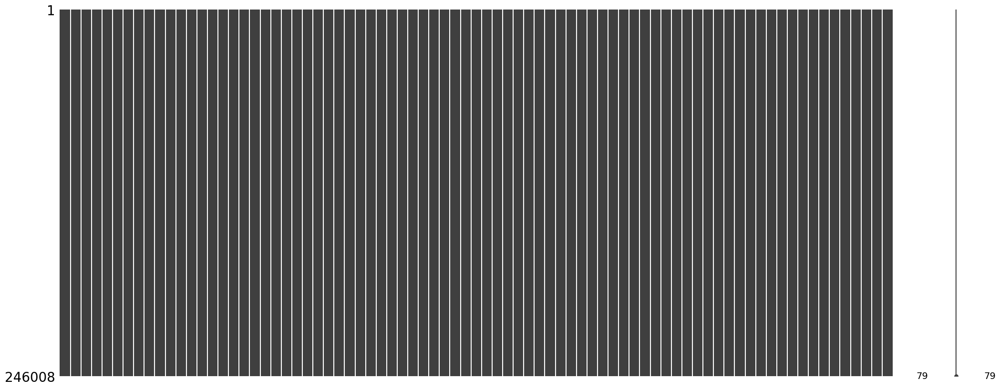

In [151]:
msno.matrix(df_train)

### Summary of missing value fill-in for numerical columns:

| missing ratio| column description | Fillin | Feature |
| ------ | ----- | ------- | ---------------------------------- |
|light  | Normal distribution | Mean |      |
|light  | Skewed distribution | Median | 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'CNT_FAM_MEMBERS', 'EXT_SOURCE_2', 'OBS_30_CNT_SOCIAL_CIRCLE', 'OBS_60_CNT_SOCIAL_CIRCLE', 'DAYS_LAST_PHONE_CHANGE' |
|heavy  | week corr, Normal distribution | Mean | 'EXT_SOURCE_1', 'EXT_SOURCE_3' |
|heavy  | week corr, Skewed distribution | Median | 'YEARS_BEGINEXPLUATATION_AVG', 'FLOORSMAX_AVG', 'YEARS_BEGINEXPLUATATION_MODE', 'FLOORSMAX_MODE', 'YEARS_BEGINEXPLUATATION_MEDI', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE', 'AMT_REQ_CREDIT_BUREAU_HOUR', 'AMT_REQ_CREDIT_BUREAU_MON', 'AMT_REQ_CREDIT_BUREAU_QRT', 'AMT_REQ_CREDIT_BUREAU_YEAR' |
|heavy  | good corr| regression | 'FLOORSMAX_AVG', 'FLOORSMAX_MODE', 'FLOORSMAX_MEDI', 'TOTALAREA_MODE' |

### Distribution of data in numerical columns 

In [152]:
num_col_train = df_train.select_dtypes(['int64','float64']).columns.to_list()
cat_col_train = df_train.select_dtypes(['object']).columns.to_list()

print('cat_col : {} \n\
num_col : {}'.format(len(cat_col_train), len(num_col_train)))

cat_col : 14 
num_col : 65


In [153]:
df_train[num_col_train].head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,YEARS_BEGINEXPLUATATION_AVG,FLOORSMAX_AVG,YEARS_BEGINEXPLUATATION_MODE,FLOORSMAX_MODE,YEARS_BEGINEXPLUATATION_MEDI,FLOORSMAX_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
181648,310536,0,2,90000.0,227520.0,13189.5,180000.0,0.008230,-12298,-946,-6378.0,-4670,1,1,0,1,0,0,4.0,2,2,10,0,0,0,0,0,0,0.384582,0.289573,0.622922,0.9851,0.3333,0.9851,0.3333,0.9851,0.3333,0.2197,0.0,0.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,1.0,1.0
229245,365516,0,0,90000.0,161730.0,13095.0,135000.0,0.003069,-15375,-92,-1292.0,-1994,1,1,0,1,0,0,2.0,3,3,13,0,0,0,0,1,1,0.501650,0.514261,0.510871,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,2.0,2.0,-509.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0
122525,242055,1,0,135000.0,728847.0,26307.0,553500.0,0.020713,-19307,-1646,-7951.0,-2842,1,1,0,1,1,0,1.0,3,2,5,0,0,0,0,0,0,0.501650,0.486906,0.598926,0.9891,0.3750,0.9891,0.3750,0.9891,0.3750,0.1269,1.0,1.0,-1474.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,2.0
306311,454894,1,0,135000.0,474183.0,34636.5,391500.0,0.011703,-17791,-1651,-1033.0,-1345,1,1,0,1,1,0,1.0,2,2,10,0,0,0,0,0,0,0.501650,0.675705,0.454321,0.9682,0.0417,0.9682,0.0417,0.9682,0.0417,0.0065,2.0,2.0,-2016.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,4.0
300658,448321,0,0,180000.0,254700.0,27558.0,225000.0,0.006629,-8486,-977,-2873.0,-852,1,1,0,1,0,0,1.0,2,2,5,0,0,0,0,0,0,0.501650,0.154565,0.510871,0.9816,0.1667,0.9816,0.1667,0.9816,0.1667,0.0688,0.0,0.0,-695.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,1.0


**Check the data distribution of numerical columns with missing values**

In [154]:
# Let's check data distribution and see if the above grouping make sense or not
num_col_train

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'CNT_FAM_MEMBERS',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'YEARS_BEGINEXPLUATATION_AVG',
 'FLOORSMAX_AVG',
 'YEARS_BEGINEXPLUATATION_MODE',
 'FLOORSMAX_MODE',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'FLOORSMAX_MEDI',
 'TOTALAREA_MODE',
 'OBS_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'FLAG_DOCUMENT_2',
 'FLAG_DOCUMENT_3',
 'FLAG_DOCUMENT_4',
 'FLAG_DOCUMENT_5',
 'FL

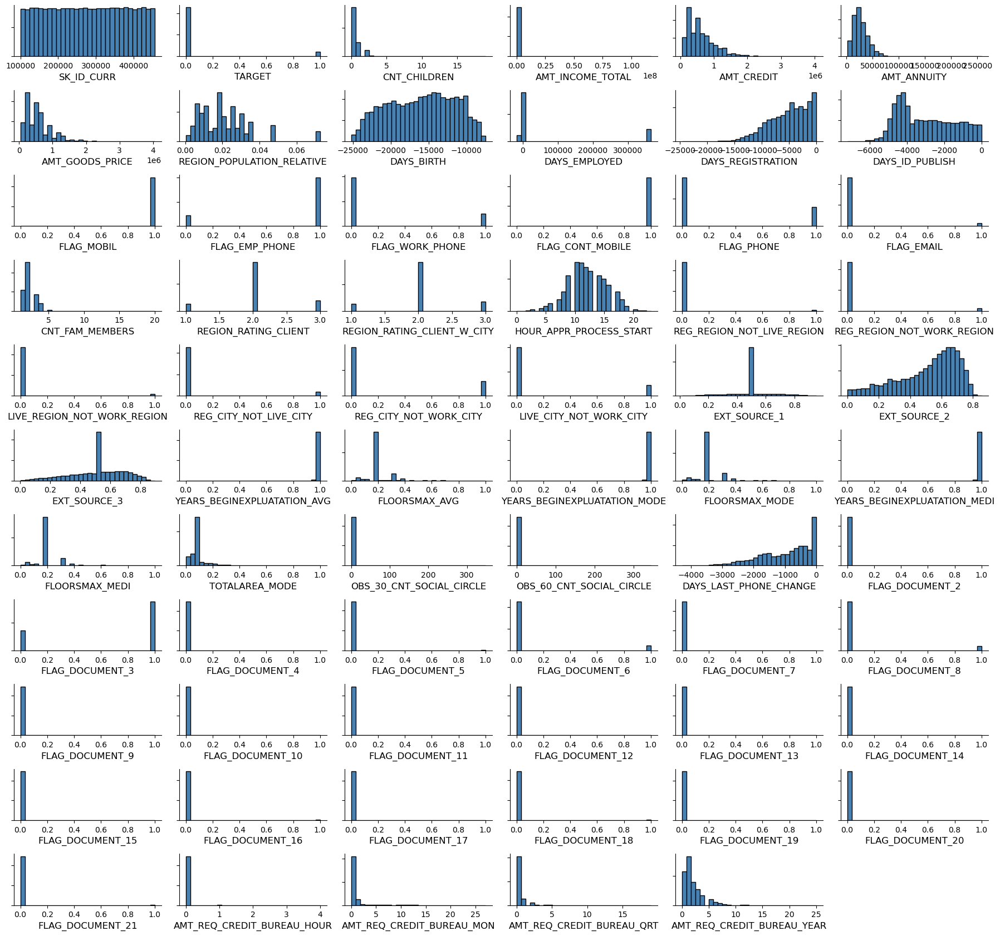

In [155]:
import matplotlib.pyplot as plt

def plot_histograms(df, num_columns, n_rows=10, n_cols=7, figsize=(18, 18)):
    fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
    axes = axes.flatten()

    for i, col in enumerate(num_columns):
        ax = axes[i]
        ax.hist(df[col], bins=30, color='steelblue', edgecolor='black')
        ax.tick_params(axis='both', which='both', labelsize=10)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xlabel(col, fontsize=12)
        ax.set_yticklabels([])  # Remove y-axis tick labels

    # Remove empty subplots
    if len(num_columns) < len(axes):
        for j in range(len(num_columns), len(axes)):
            fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Plot histograms of numerical columns in a 7x10 grid layout
plot_histograms(df_train, num_col_train, n_rows=12, n_cols=6)


**Columns need attention:**

In [156]:
abnormal_cols = ['AMT_INCOME_TOTAL', 'DAYS_EMPLOYED', 'FLAG_MOBIL','FLAG_EMP_PHONE','FLAG_WORK_PHONE','FLAG_CONT_MOBILE','FLAG_PHONE','FLAG_EMAIL','REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY','REG_REGION_NOT_LIVE_REGION',
'REG_REGION_NOT_WORK_REGION','LIVE_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY','REG_CITY_NOT_WORK_CITY','LIVE_CITY_NOT_WORK_CITY','EXT_SOURCE_1','YEARS_BEGINEXPLUATATION_AVG','YEARS_BEGINEXPLUATATION_MODE','YEARS_BEGINEXPLUATATION_MEDI',
'OBS_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7','FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21','AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT']

In [157]:
abnormal_cols_new = abnormal_cols.copy()

In [158]:
abnormal_cols_new.append('Target')

<Figure size 1000x800 with 0 Axes>

[Text(0, 0, 'AMT_INCOME_TOTAL'),
 Text(1, 0, 'DAYS_EMPLOYED'),
 Text(2, 0, 'FLAG_MOBIL'),
 Text(3, 0, 'FLAG_EMP_PHONE'),
 Text(4, 0, 'FLAG_WORK_PHONE'),
 Text(5, 0, 'FLAG_CONT_MOBILE'),
 Text(6, 0, 'FLAG_PHONE'),
 Text(7, 0, 'FLAG_EMAIL'),
 Text(8, 0, 'REGION_RATING_CLIENT'),
 Text(9, 0, 'REGION_RATING_CLIENT_W_CITY'),
 Text(10, 0, 'REG_REGION_NOT_LIVE_REGION'),
 Text(11, 0, 'REG_REGION_NOT_WORK_REGION'),
 Text(12, 0, 'LIVE_REGION_NOT_WORK_REGION'),
 Text(13, 0, 'REG_CITY_NOT_LIVE_CITY'),
 Text(14, 0, 'REG_CITY_NOT_WORK_CITY'),
 Text(15, 0, 'LIVE_CITY_NOT_WORK_CITY'),
 Text(16, 0, 'EXT_SOURCE_1'),
 Text(17, 0, 'YEARS_BEGINEXPLUATATION_AVG'),
 Text(18, 0, 'YEARS_BEGINEXPLUATATION_MODE'),
 Text(19, 0, 'YEARS_BEGINEXPLUATATION_MEDI'),
 Text(20, 0, 'OBS_30_CNT_SOCIAL_CIRCLE'),
 Text(21, 0, 'OBS_60_CNT_SOCIAL_CIRCLE'),
 Text(22, 0, 'FLAG_DOCUMENT_2'),
 Text(23, 0, 'FLAG_DOCUMENT_3'),
 Text(24, 0, 'FLAG_DOCUMENT_4'),
 Text(25, 0, 'FLAG_DOCUMENT_5'),
 Text(26, 0, 'FLAG_DOCUMENT_6'),
 Text(27,

[Text(0, 0, 'AMT_INCOME_TOTAL'),
 Text(0, 1, 'DAYS_EMPLOYED'),
 Text(0, 2, 'FLAG_MOBIL'),
 Text(0, 3, 'FLAG_EMP_PHONE'),
 Text(0, 4, 'FLAG_WORK_PHONE'),
 Text(0, 5, 'FLAG_CONT_MOBILE'),
 Text(0, 6, 'FLAG_PHONE'),
 Text(0, 7, 'FLAG_EMAIL'),
 Text(0, 8, 'REGION_RATING_CLIENT'),
 Text(0, 9, 'REGION_RATING_CLIENT_W_CITY'),
 Text(0, 10, 'REG_REGION_NOT_LIVE_REGION'),
 Text(0, 11, 'REG_REGION_NOT_WORK_REGION'),
 Text(0, 12, 'LIVE_REGION_NOT_WORK_REGION'),
 Text(0, 13, 'REG_CITY_NOT_LIVE_CITY'),
 Text(0, 14, 'REG_CITY_NOT_WORK_CITY'),
 Text(0, 15, 'LIVE_CITY_NOT_WORK_CITY'),
 Text(0, 16, 'EXT_SOURCE_1'),
 Text(0, 17, 'YEARS_BEGINEXPLUATATION_AVG'),
 Text(0, 18, 'YEARS_BEGINEXPLUATATION_MODE'),
 Text(0, 19, 'YEARS_BEGINEXPLUATATION_MEDI'),
 Text(0, 20, 'OBS_30_CNT_SOCIAL_CIRCLE'),
 Text(0, 21, 'OBS_60_CNT_SOCIAL_CIRCLE'),
 Text(0, 22, 'FLAG_DOCUMENT_2'),
 Text(0, 23, 'FLAG_DOCUMENT_3'),
 Text(0, 24, 'FLAG_DOCUMENT_4'),
 Text(0, 25, 'FLAG_DOCUMENT_5'),
 Text(0, 26, 'FLAG_DOCUMENT_6'),
 Text(0, 

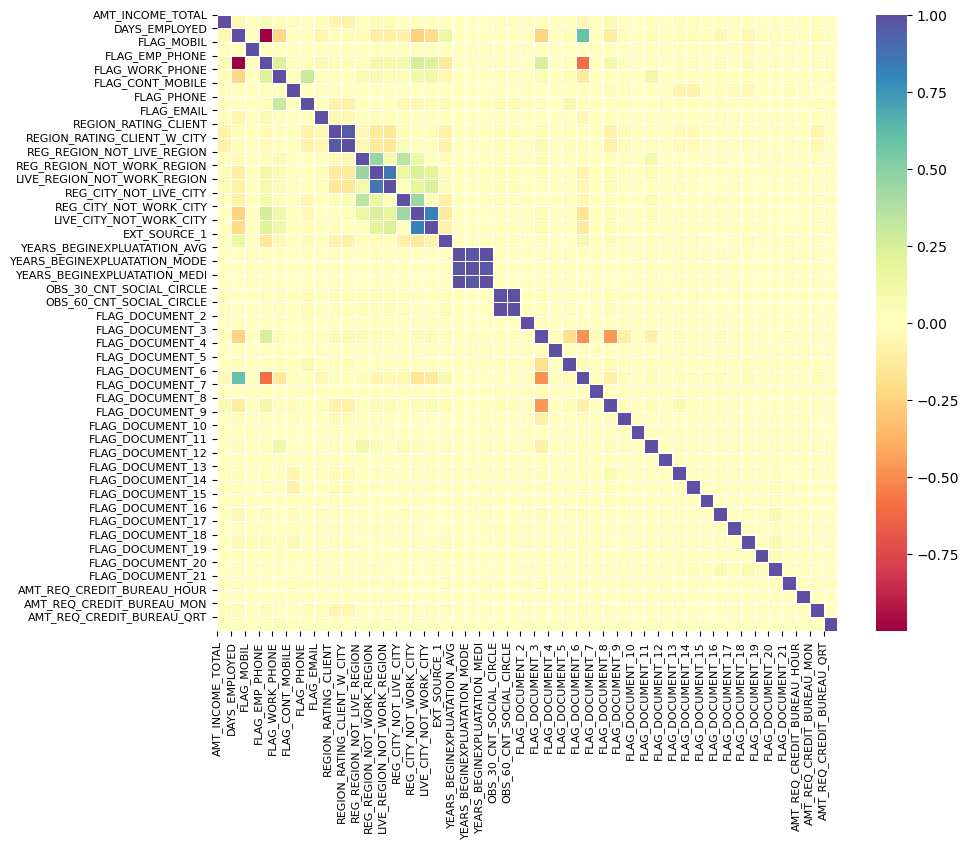

In [159]:
plt.figure(figsize=(10, 8))  # Increase the figure size

# Create the heatmap
ax = sns.heatmap(df_train[abnormal_cols].corr(), cmap='Spectral',
                 linewidths=0.5, linecolor='white')

# Adjust the font size of x and y labels
ax.set_xticks(range(len(abnormal_cols)))
ax.set_yticks(range(len(abnormal_cols)))
ax.set_xticklabels(abnormal_cols, fontsize=8)
ax.set_yticklabels(abnormal_cols, fontsize=8)

plt.show()

In [160]:
# Check the distribution of the binary target label in abnormal_cols
target_dist = df_train['TARGET'].value_counts(normalize=True)
print("Target distribution:\n", target_dist)

col_var_low = []
for col in abnormal_cols:
    dominant_value = df_train[col].mode().iloc[0]
    dominant_value_dist = df_train.loc[df_train[col] == dominant_value, 'TARGET'].value_counts(normalize=True)
    print(f"\nTarget distribution in column {col} dominant value ({dominant_value}):\n", col, dominant_value_dist)
    print(df_train[col].var())

Target distribution:
 TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64

Target distribution in column AMT_INCOME_TOTAL dominant value (135000.0):
 AMT_INCOME_TOTAL TARGET
0    0.916812
1    0.083188
Name: proportion, dtype: float64
67060609055.18428

Target distribution in column DAYS_EMPLOYED dominant value (365243):
 DAYS_EMPLOYED TARGET
0    0.946311
1    0.053689
Name: proportion, dtype: float64
19904045206.66252

Target distribution in column FLAG_MOBIL dominant value (1):
 FLAG_MOBIL TARGET
0    0.919271
1    0.080729
Name: proportion, dtype: float64
4.064908458253222e-06

Target distribution in column FLAG_EMP_PHONE dominant value (1):
 FLAG_EMP_PHONE TARGET
0    0.913358
1    0.086642
Name: proportion, dtype: float64
0.14726878983909875

Target distribution in column FLAG_WORK_PHONE dominant value (0):
 FLAG_WORK_PHONE TARGET
0    0.923123
1    0.076877
Name: proportion, dtype: float64
0.15980884644395169

Target distribution in column FLAG_CONT_MOBILE domina

**Therefore, I will drop all these columns since one value dominates in them,and they have pretty weak correlation with TARGET.**

In [161]:
df_train.drop(abnormal_cols, axis = 1, inplace = True)

In [162]:
df_train.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_CREDIT',
       'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_INCOME_TYPE',
       'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_REGISTRATION',
       'DAYS_ID_PUBLISH', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'HOUR_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'EXT_SOURCE_2',
       'EXT_SOURCE_3', 'FLOORSMAX_AVG', 'FLOORSMAX_MODE', 'FLOORSMAX_MEDI',
       'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE', 'TOTALAREA_MODE',
       'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE', 'DAYS_LAST_PHONE_CHANGE',
       'AMT_REQ_CREDIT_BUREAU_YEAR'],
      dtype='object')

In [163]:
#update the colums
num_col_train = df_train.select_dtypes(['int64','float64']).columns.to_list()
cat_col_train = df_train.select_dtypes(['object']).columns.to_list()

print('cat_col : {} \n\
num_col : {}'.format(len(cat_col_train), len(num_col_train)))

cat_col : 14 
num_col : 20


### Check distribution of target label y in numerical features

In [164]:
df_train[num_col_train].head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_REGISTRATION,DAYS_ID_PUBLISH,CNT_FAM_MEMBERS,HOUR_APPR_PROCESS_START,EXT_SOURCE_2,EXT_SOURCE_3,FLOORSMAX_AVG,FLOORSMAX_MODE,FLOORSMAX_MEDI,TOTALAREA_MODE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_YEAR
181648,310536,0,2,227520.0,13189.5,180000.0,0.008230,-12298,-6378.0,-4670,4.0,10,0.289573,0.622922,0.3333,0.3333,0.3333,0.2197,0.0,1.0
229245,365516,0,0,161730.0,13095.0,135000.0,0.003069,-15375,-1292.0,-1994,2.0,13,0.514261,0.510871,0.1667,0.1667,0.1667,0.0688,-509.0,1.0
122525,242055,1,0,728847.0,26307.0,553500.0,0.020713,-19307,-7951.0,-2842,1.0,5,0.486906,0.598926,0.3750,0.3750,0.3750,0.1269,-1474.0,2.0
306311,454894,1,0,474183.0,34636.5,391500.0,0.011703,-17791,-1033.0,-1345,1.0,10,0.675705,0.454321,0.0417,0.0417,0.0417,0.0065,-2016.0,4.0
300658,448321,0,0,254700.0,27558.0,225000.0,0.006629,-8486,-2873.0,-852,1.0,5,0.154565,0.510871,0.1667,0.1667,0.1667,0.0688,-695.0,1.0


**plot the distribution of data in either 0 or 1 group for each numerical columns**

[Text(0.5, 0, '')]

Text(0, 0.5, 'SK_ID_CURR')

[Text(0.5, 0, '')]

Text(0, 0.5, 'TARGET')

[Text(0.5, 0, '')]

Text(0, 0.5, 'CNT_CHILDREN')

[Text(0.5, 0, '')]

Text(0, 0.5, 'AMT_CREDIT')

[Text(0.5, 0, '')]

Text(0, 0.5, 'AMT_ANNUITY')

[Text(0.5, 0, '')]

Text(0, 0.5, 'AMT_GOODS_PRICE')

[Text(0.5, 0, '')]

Text(0, 0.5, 'REGION_POPULATION_RELATIVE')

[Text(0.5, 0, '')]

Text(0, 0.5, 'DAYS_BIRTH')

[Text(0.5, 0, '')]

Text(0, 0.5, 'DAYS_REGISTRATION')

[Text(0.5, 0, '')]

Text(0, 0.5, 'DAYS_ID_PUBLISH')

[Text(0.5, 0, '')]

Text(0, 0.5, 'CNT_FAM_MEMBERS')

[Text(0.5, 0, '')]

Text(0, 0.5, 'HOUR_APPR_PROCESS_START')

[Text(0.5, 0, '')]

Text(0, 0.5, 'EXT_SOURCE_2')

[Text(0.5, 0, '')]

Text(0, 0.5, 'EXT_SOURCE_3')

[Text(0.5, 0, '')]

Text(0, 0.5, 'FLOORSMAX_AVG')

[Text(0.5, 0, '')]

Text(0, 0.5, 'FLOORSMAX_MODE')

[Text(0.5, 0, '')]

Text(0, 0.5, 'FLOORSMAX_MEDI')

[Text(0.5, 0, '')]

Text(0, 0.5, 'TOTALAREA_MODE')

[Text(0.5, 0, '')]

Text(0, 0.5, 'DAYS_LAST_PHONE_CHANGE')

[Text(0.5, 0, '')]

Text(0, 0.5, 'AMT_REQ_CREDIT_BUREAU_YEAR')

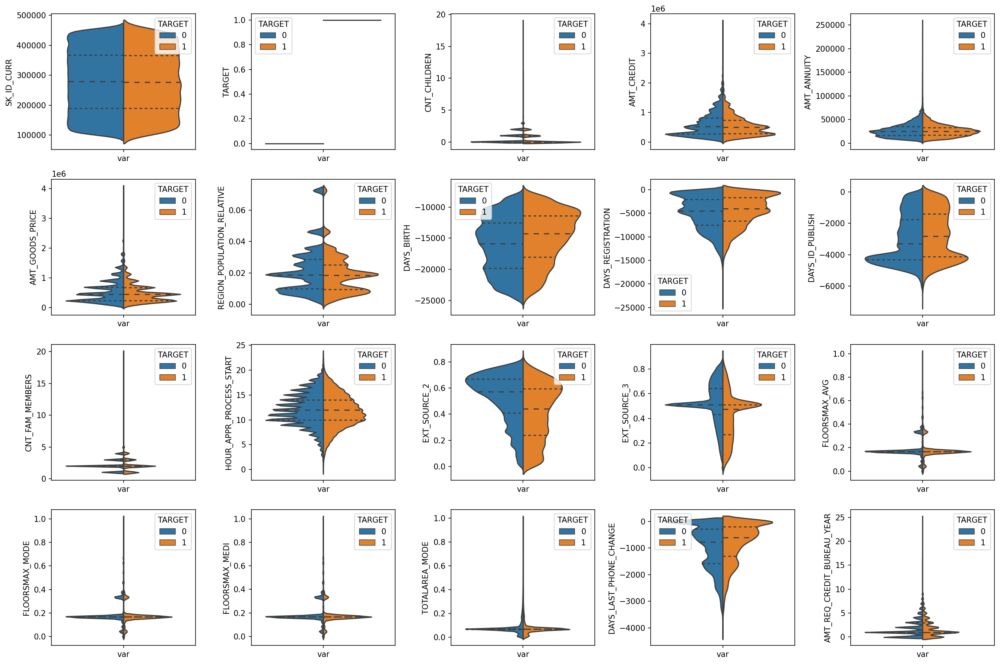

In [165]:
num_df = df_train[num_col_train].copy()
num_df['var'] = 'var'
nrows = 4  
ncols = 5  
fig, axes = plt.subplots(nrows, ncols, figsize=(18, 12), dpi=150)
for r in range(nrows):
    for c in range(ncols):
        i = r * ncols + c  # index of the current column
        if i >= len(num_col_train):  # check if we've reached the end of the columns
            break
        ax = sns.violinplot(x='var', y=num_col_train[i], data=num_df, hue='TARGET', split=True, inner='quart', ax=axes[r, c])
        ax.set(xlabel=None)
        ax.set_ylabel(f'{num_col_train[i]}', fontsize=10)
        ax.tick_params(labelsize=10)

plt.tight_layout()

**use ttest to calculate if there is significant difference in the distribution**

[Text(0.5, 0, '')]

Text(0, 0.5, 'SK_ID_CURR')

[Text(0.5, 0, '')]

Text(0, 0.5, 'TARGET')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'CNT_CHILDREN')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'AMT_CREDIT')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'AMT_ANNUITY')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'AMT_GOODS_PRICE')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'REGION_POPULATION_RELATIVE')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'DAYS_BIRTH')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'DAYS_REGISTRATION')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'DAYS_ID_PUBLISH')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'CNT_FAM_MEMBERS')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'HOUR_APPR_PROCESS_START')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'EXT_SOURCE_2')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'EXT_SOURCE_3')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'FLOORSMAX_AVG')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'FLOORSMAX_MODE')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'FLOORSMAX_MEDI')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'TOTALAREA_MODE')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'DAYS_LAST_PHONE_CHANGE')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'AMT_REQ_CREDIT_BUREAU_YEAR')

Text(0.5, 0.9, 'p = 0.0000')

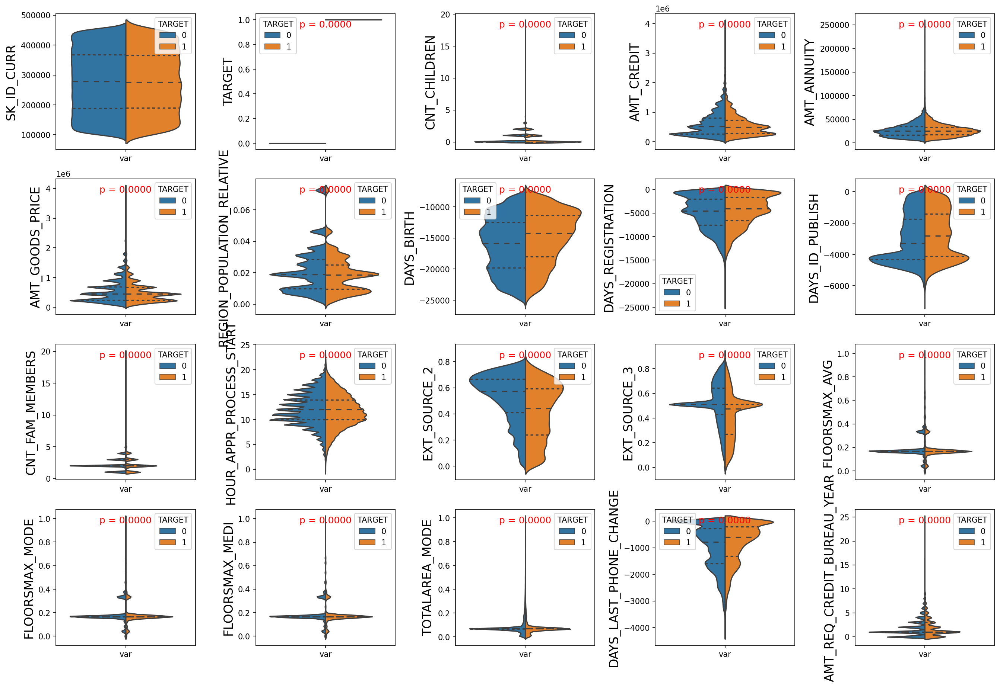

In [166]:
from scipy.stats import ttest_ind
num_df = df_train[num_col_train].copy()
num_df['var'] = 'var'
nrows = 4  
ncols = 5  
fig, axes = plt.subplots(nrows, ncols, figsize=(18, 12), dpi=150)

for r in range(nrows):
    for c in range(ncols):
        i = r * ncols + c  # index of the current column
        if i >= len(num_col_train):  # check if we've reached the end of the columns
            break
        ax = sns.violinplot(x='var', y=num_col_train[i], data=num_df, hue='TARGET', split=True, inner='quart', ax=axes[r, c])
        ax.set(xlabel=None)
        ax.set_ylabel(f'{num_col_train[i]}', fontsize=16)
        ax.tick_params(labelsize=10)

        # perform two-sample t-test
        x0 = df_train.loc[df_train['TARGET'] == 0, num_col_train[i]].values
        x1 = df_train.loc[df_train['TARGET'] == 1, num_col_train[i]].values
        t, p = ttest_ind(x0, x1, equal_var=False)
        if p < 0.05:  # if p-value is less than 0.05, annotate the plot with the p-value
            ax.text(0.5, 0.9, f'p = {p:.4f}', transform=ax.transAxes, ha='center', fontsize=12, color='red')

plt.tight_layout()

**use Mann-Whitney U test to calculate if there is significant difference in the distribution**

[Text(0.5, 0, '')]

Text(0, 0.5, 'SK_ID_CURR')

[Text(0.5, 0, '')]

Text(0, 0.5, 'TARGET')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'CNT_CHILDREN')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'AMT_CREDIT')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'AMT_ANNUITY')

[Text(0.5, 0, '')]

Text(0, 0.5, 'AMT_GOODS_PRICE')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'REGION_POPULATION_RELATIVE')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'DAYS_BIRTH')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'DAYS_REGISTRATION')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'DAYS_ID_PUBLISH')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'CNT_FAM_MEMBERS')

Text(0.5, 0.9, 'p = 0.0002')

[Text(0.5, 0, '')]

Text(0, 0.5, 'HOUR_APPR_PROCESS_START')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'EXT_SOURCE_2')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'EXT_SOURCE_3')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'FLOORSMAX_AVG')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'FLOORSMAX_MODE')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'FLOORSMAX_MEDI')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'TOTALAREA_MODE')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'DAYS_LAST_PHONE_CHANGE')

Text(0.5, 0.9, 'p = 0.0000')

[Text(0.5, 0, '')]

Text(0, 0.5, 'AMT_REQ_CREDIT_BUREAU_YEAR')

Text(0.5, 0.9, 'p = 0.0000')

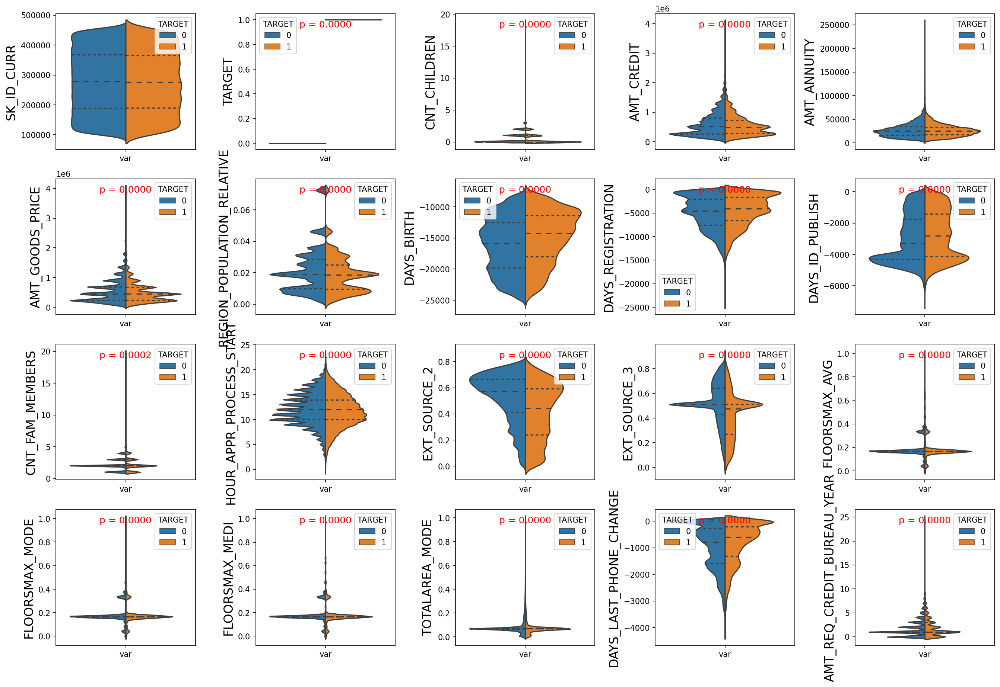

In [167]:
from scipy.stats import mannwhitneyu

num_df = df_train[num_col_train].copy()
num_df['var'] = 'var'
nrows = 4  
ncols = 5  
fig, axes = plt.subplots(nrows, ncols, figsize=(18, 12), dpi=150)

for r in range(nrows):
    for c in range(ncols):
        i = r * ncols + c  # index of the current column
        if i >= len(num_col_train):  # check if we've reached the end of the columns
            break
        ax = sns.violinplot(x='var', y=num_col_train[i], data=num_df, hue='TARGET', split=True, inner='quart', ax=axes[r, c])
        ax.set(xlabel=None)
        ax.set_ylabel(f'{num_col_train[i]}', fontsize=16)
        ax.tick_params(labelsize=10)

        # perform Mann-Whitney U test
        x0 = df_train.loc[df_train['TARGET'] == 0, num_col_train[i]].values
        x1 = df_train.loc[df_train['TARGET'] == 1, num_col_train[i]].values
        stat, p = mannwhitneyu(x0, x1, alternative='two-sided')
        if p < 0.05:  # if p-value is less than 0.05, annotate the plot with the p-value
            ax.text(0.5, 0.9, f'p = {p:.4f}', transform=ax.transAxes, ha='center', fontsize=12, color='red')

plt.tight_layout()


**We found that in the majority of numerical columns, the distribution of data differs between the "0" and "1" groups of the target label (TARGET).**
* This indicates that these columns may play a significant role in predicting the target label. 
* To further analyze their importance, we can employ statistical methods such as Pearson correlation and Variance Inflation Factor (VIF), or algorithm-based strategies like Recursive Feature Elimination with Cross-Validation (RFECV). 
* These techniques will aid in identifying and eliminating columns that are not useful for modeling. By reducing the dimensionality of the dataset and enhancing model interpretability, we can improve the effectiveness of our modeling process.

<Figure size 1000x600 with 0 Axes>

(array([3.000e+00, 1.000e+00, 6.000e+00, 7.000e+00, 2.000e+01, 4.800e+01,
        6.700e+01, 6.700e+01, 1.030e+02, 1.380e+02, 2.080e+02, 3.110e+02,
        2.940e+02, 3.510e+02, 3.800e+02, 5.430e+02, 7.070e+02, 9.150e+02,
        9.600e+02, 7.530e+02, 7.840e+02, 8.750e+02, 9.890e+02, 1.179e+03,
        1.573e+03, 1.938e+03, 2.153e+03, 2.162e+03, 1.783e+03, 5.507e+03]),
 array([-11.15068493, -10.77899543, -10.40730594, -10.03561644,
         -9.66392694,  -9.29223744,  -8.92054795,  -8.54885845,
         -8.17716895,  -7.80547945,  -7.43378995,  -7.06210046,
         -6.69041096,  -6.31872146,  -5.94703196,  -5.57534247,
         -5.20365297,  -4.83196347,  -4.46027397,  -4.08858447,
         -3.71689498,  -3.34520548,  -2.97351598,  -2.60182648,
         -2.23013699,  -1.85844749,  -1.48675799,  -1.11506849,
         -0.743379  ,  -0.3716895 ,   0.        ]),
 <BarContainer object of 30 artists>)

(array([4.0000e+00, 2.4000e+01, 2.6000e+01, 8.8000e+01, 1.5800e+02,
        3.5700e+02, 8.5600e+02, 1.4360e+03, 1.5460e+03, 1.9010e+03,
        2.4170e+03, 3.8720e+03, 5.3540e+03, 5.5690e+03, 6.0170e+03,
        6.6310e+03, 9.4460e+03, 1.2607e+04, 1.3637e+04, 1.4433e+04,
        1.0425e+04, 1.0825e+04, 1.2386e+04, 1.2447e+04, 1.6266e+04,
        1.8950e+04, 2.1556e+04, 2.2043e+04, 1.7461e+04, 5.3947e+04]),
 array([-11.75890411, -11.36694064, -10.97497717, -10.5830137 ,
        -10.19105023,  -9.79908676,  -9.40712329,  -9.01515982,
         -8.62319635,  -8.23123288,  -7.83926941,  -7.44730594,
         -7.05534247,  -6.663379  ,  -6.27141553,  -5.87945205,
         -5.48748858,  -5.09552511,  -4.70356164,  -4.31159817,
         -3.9196347 ,  -3.52767123,  -3.13570776,  -2.74374429,
         -2.35178082,  -1.95981735,  -1.56785388,  -1.17589041,
         -0.78392694,  -0.39196347,   0.        ]),
 <BarContainer object of 30 artists>)

Text(0.5, 0, 'DAYS_LAST_PHONE_CHANGE (Years)')

Text(0, 0.5, 'Frequency')

Text(0.5, 1.0, 'Distribution of DAYS_LAST_PHONE_CHANGE for TARGET')

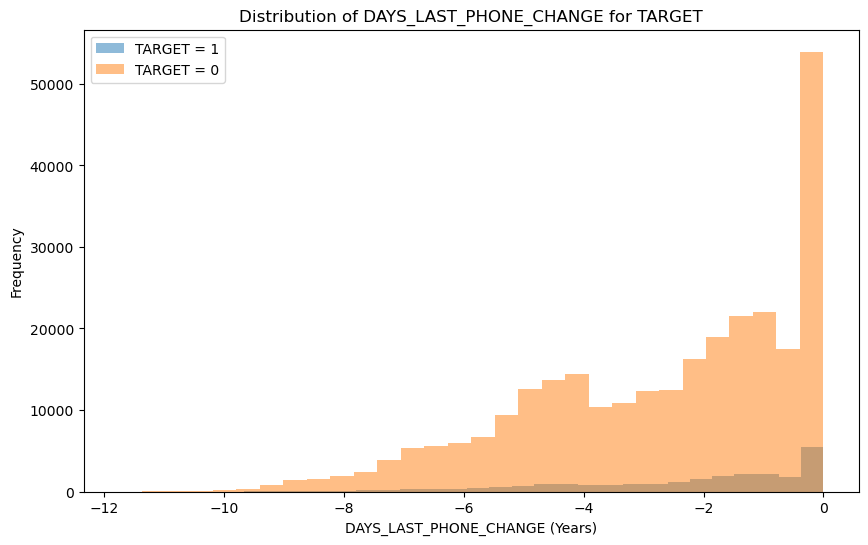

In [168]:
import matplotlib.pyplot as plt

# Separate the feature based on the target values
feature_1 = df[df['TARGET'] == 1]['DAYS_LAST_PHONE_CHANGE'] / 365
feature_0 = df[df['TARGET'] == 0]['DAYS_LAST_PHONE_CHANGE'] / 365

# Plot the distributions
plt.figure(figsize=(10, 6))
plt.hist(feature_1, bins=30, alpha=0.5, label='TARGET = 1')
plt.hist(feature_0, bins=30, alpha=0.5, label='TARGET = 0')
plt.xlabel('DAYS_LAST_PHONE_CHANGE (Years)')
plt.ylabel('Frequency')
plt.title('Distribution of DAYS_LAST_PHONE_CHANGE for TARGET')
plt.legend()
plt.show()


<Figure size 1000x600 with 0 Axes>

(array([3.000e+00, 1.000e+00, 6.000e+00, 7.000e+00, 2.000e+01, 4.800e+01,
        6.700e+01, 6.700e+01, 1.030e+02, 1.380e+02, 2.080e+02, 3.110e+02,
        2.940e+02, 3.510e+02, 3.820e+02, 5.410e+02, 7.070e+02, 9.110e+02,
        9.640e+02, 7.530e+02, 7.840e+02, 8.750e+02, 9.890e+02, 1.179e+03,
        1.573e+03, 1.938e+03, 2.153e+03, 2.162e+03, 1.783e+03, 5.507e+03]),
 array([0.05172414, 0.08333333, 0.11494253, 0.14655172, 0.17816092,
        0.20977011, 0.24137931, 0.27298851, 0.3045977 , 0.3362069 ,
        0.36781609, 0.39942529, 0.43103448, 0.46264368, 0.49425287,
        0.52586207, 0.55747126, 0.58908046, 0.62068966, 0.65229885,
        0.68390805, 0.71551724, 0.74712644, 0.77873563, 0.81034483,
        0.84195402, 0.87356322, 0.90517241, 0.93678161, 0.9683908 ,
        1.        ]),
 <BarContainer object of 30 artists>)

(array([4.0000e+00, 2.4000e+01, 2.6000e+01, 8.8000e+01, 1.5800e+02,
        3.5700e+02, 8.5600e+02, 1.4360e+03, 1.5460e+03, 1.9010e+03,
        2.4170e+03, 3.8720e+03, 5.3540e+03, 5.5690e+03, 6.0170e+03,
        6.6310e+03, 9.4460e+03, 1.2607e+04, 1.3637e+04, 1.4433e+04,
        1.0425e+04, 1.0825e+04, 1.2386e+04, 1.2447e+04, 1.6266e+04,
        1.8950e+04, 2.1556e+04, 2.2043e+04, 1.7461e+04, 5.3947e+04]),
 array([0.        , 0.03333333, 0.06666667, 0.1       , 0.13333333,
        0.16666667, 0.2       , 0.23333333, 0.26666667, 0.3       ,
        0.33333333, 0.36666667, 0.4       , 0.43333333, 0.46666667,
        0.5       , 0.53333333, 0.56666667, 0.6       , 0.63333333,
        0.66666667, 0.7       , 0.73333333, 0.76666667, 0.8       ,
        0.83333333, 0.86666667, 0.9       , 0.93333333, 0.96666667,
        1.        ]),
 <BarContainer object of 30 artists>)

Text(0.5, 0, 'Normalized DAYS_LAST_PHONE_CHANGE')

Text(0, 0.5, 'Frequency')

Text(0.5, 1.0, 'Distribution of Normalized DAYS_LAST_PHONE_CHANGE for TARGET')

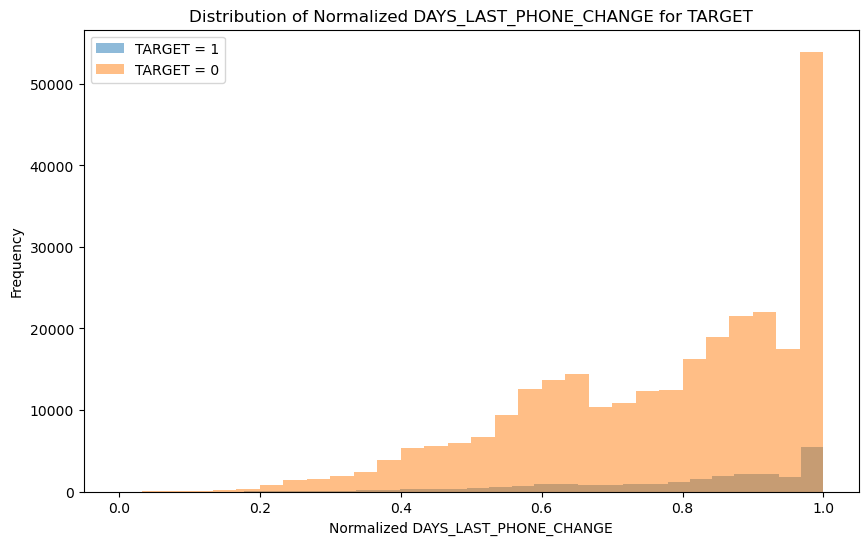

In [169]:
from sklearn.preprocessing import MinMaxScaler

# Create a MinMaxScaler object
scaler = MinMaxScaler()

# Reshape the feature to a 2D array
feature = df['DAYS_LAST_PHONE_CHANGE'].values.reshape(-1, 1)

# Perform Min-Max Scaling
normalized_feature = scaler.fit_transform(feature)

# Plot the normalized feature distribution
plt.figure(figsize=(10, 6))
plt.hist(normalized_feature[df['TARGET'] == 1], bins=30, alpha=0.5, label='TARGET = 1')
plt.hist(normalized_feature[df['TARGET'] == 0], bins=30, alpha=0.5, label='TARGET = 0')
plt.xlabel('Normalized DAYS_LAST_PHONE_CHANGE')
plt.ylabel('Frequency')
plt.title('Distribution of Normalized DAYS_LAST_PHONE_CHANGE for TARGET')
plt.legend()
plt.show()

<a id='Data_Quality'></a>
<h2 style="color:blue">Multivariate Analysis</h2>

### Pearson correlation and VIF analysis of numerical columns

<Figure size 1000x700 with 0 Axes>

<AxesSubplot:>

Text(0.5, 1.0, 'Correlation Heatmap of Numerical Columns')

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5]),
 [Text(0.5, 0, 'SK_ID_CURR'),
  Text(1.5, 0, 'TARGET'),
  Text(2.5, 0, 'CNT_CHILDREN'),
  Text(3.5, 0, 'AMT_CREDIT'),
  Text(4.5, 0, 'AMT_ANNUITY'),
  Text(5.5, 0, 'AMT_GOODS_PRICE'),
  Text(6.5, 0, 'REGION_POPULATION_RELATIVE'),
  Text(7.5, 0, 'DAYS_BIRTH'),
  Text(8.5, 0, 'DAYS_REGISTRATION'),
  Text(9.5, 0, 'DAYS_ID_PUBLISH'),
  Text(10.5, 0, 'CNT_FAM_MEMBERS'),
  Text(11.5, 0, 'HOUR_APPR_PROCESS_START'),
  Text(12.5, 0, 'EXT_SOURCE_2'),
  Text(13.5, 0, 'EXT_SOURCE_3'),
  Text(14.5, 0, 'FLOORSMAX_AVG'),
  Text(15.5, 0, 'FLOORSMAX_MODE'),
  Text(16.5, 0, 'FLOORSMAX_MEDI'),
  Text(17.5, 0, 'TOTALAREA_MODE'),
  Text(18.5, 0, 'DAYS_LAST_PHONE_CHANGE'),
  Text(19.5, 0, 'AMT_REQ_CREDIT_BUREAU_YEAR')])

(array([ 0.5,  1.5,  2.5,  3.5,  4.5,  5.5,  6.5,  7.5,  8.5,  9.5, 10.5,
        11.5, 12.5, 13.5, 14.5, 15.5, 16.5, 17.5, 18.5, 19.5]),
 [Text(0, 0.5, 'SK_ID_CURR'),
  Text(0, 1.5, 'TARGET'),
  Text(0, 2.5, 'CNT_CHILDREN'),
  Text(0, 3.5, 'AMT_CREDIT'),
  Text(0, 4.5, 'AMT_ANNUITY'),
  Text(0, 5.5, 'AMT_GOODS_PRICE'),
  Text(0, 6.5, 'REGION_POPULATION_RELATIVE'),
  Text(0, 7.5, 'DAYS_BIRTH'),
  Text(0, 8.5, 'DAYS_REGISTRATION'),
  Text(0, 9.5, 'DAYS_ID_PUBLISH'),
  Text(0, 10.5, 'CNT_FAM_MEMBERS'),
  Text(0, 11.5, 'HOUR_APPR_PROCESS_START'),
  Text(0, 12.5, 'EXT_SOURCE_2'),
  Text(0, 13.5, 'EXT_SOURCE_3'),
  Text(0, 14.5, 'FLOORSMAX_AVG'),
  Text(0, 15.5, 'FLOORSMAX_MODE'),
  Text(0, 16.5, 'FLOORSMAX_MEDI'),
  Text(0, 17.5, 'TOTALAREA_MODE'),
  Text(0, 18.5, 'DAYS_LAST_PHONE_CHANGE'),
  Text(0, 19.5, 'AMT_REQ_CREDIT_BUREAU_YEAR')])

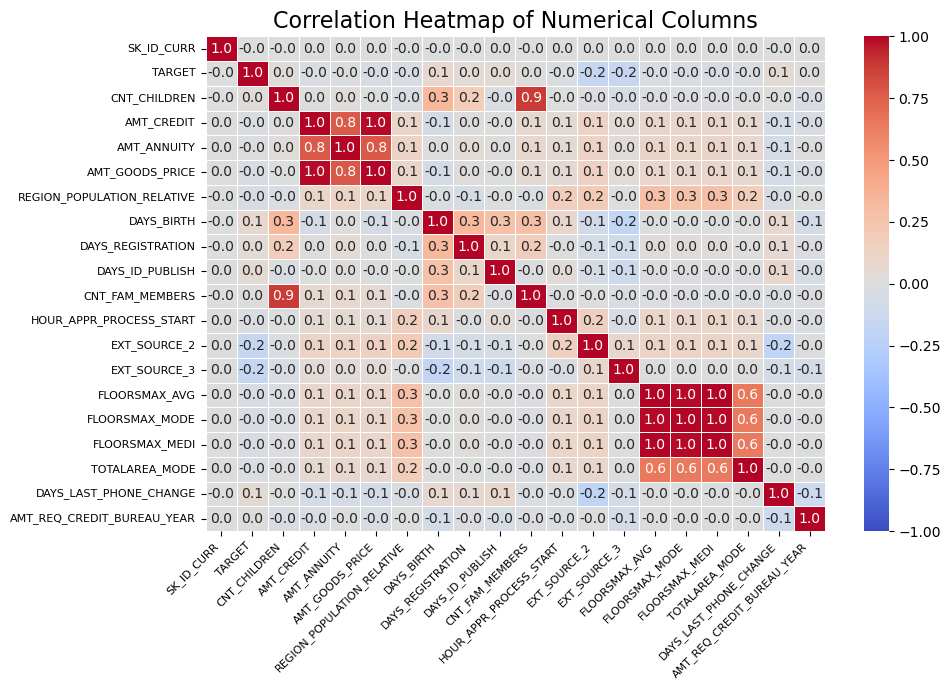

In [170]:
plt.figure(figsize=(10, 7))
sns.heatmap(df_train[num_col_train].corr(), cmap='coolwarm', vmin=-1, vmax=1, annot=True, fmt=".1f", linewidths=0.5)
plt.title("Correlation Heatmap of Numerical Columns", fontsize=16)
plt.xticks(rotation=45, ha="right", fontsize=8)
plt.yticks(fontsize=8)
plt.tight_layout()
plt.show()

<AxesSubplot:>

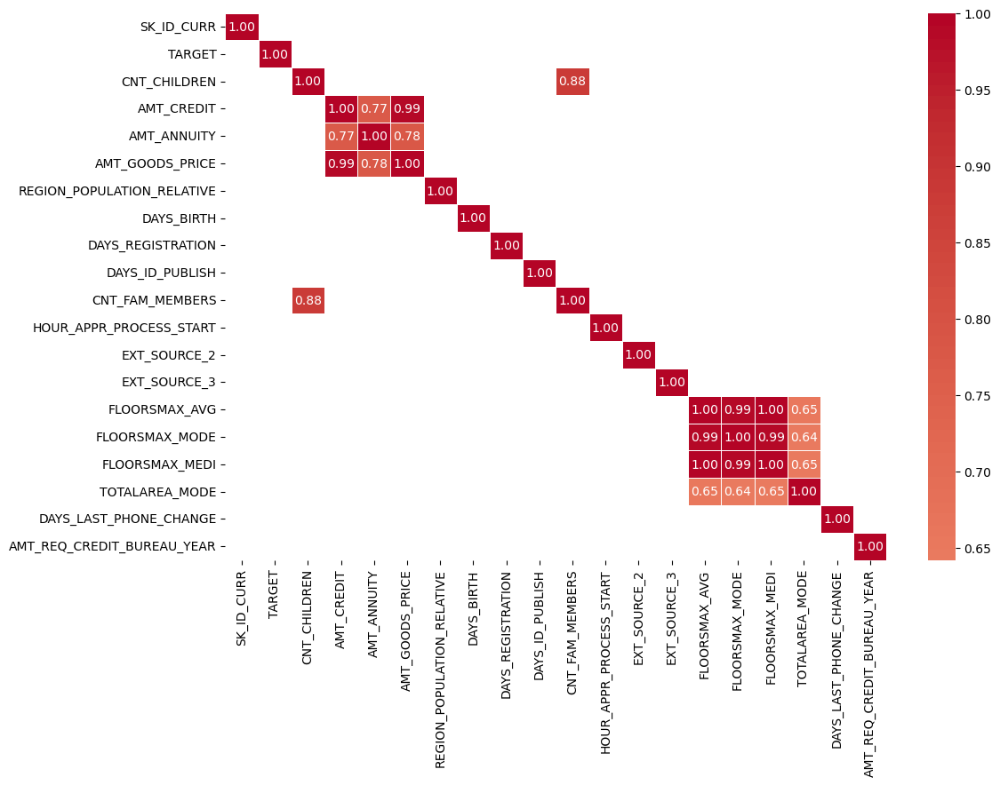

In [171]:
# Compute the correlation matrix
corr = df_train[num_col_train].corr()

# Create a mask to hide the correlations below the threshold
mask = np.abs(corr) < 0.5

# Create a heatmap with the masked correlation matrix
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(corr, mask=mask, cmap="coolwarm", center=0, annot=True, fmt=".2f", linewidth=.5,
           annot_kws={"size": 10, "color": "white"})
plt.show()

**Let's calculate the VIF score and used VIF score to eliminate columns showing high multicollinearity.**

In [172]:
df_train[num_col_train].isnull().sum()

SK_ID_CURR                    0
TARGET                        0
CNT_CHILDREN                  0
AMT_CREDIT                    0
AMT_ANNUITY                   0
AMT_GOODS_PRICE               0
REGION_POPULATION_RELATIVE    0
DAYS_BIRTH                    0
DAYS_REGISTRATION             0
DAYS_ID_PUBLISH               0
CNT_FAM_MEMBERS               0
HOUR_APPR_PROCESS_START       0
EXT_SOURCE_2                  0
EXT_SOURCE_3                  0
FLOORSMAX_AVG                 0
FLOORSMAX_MODE                0
FLOORSMAX_MEDI                0
TOTALAREA_MODE                0
DAYS_LAST_PHONE_CHANGE        0
AMT_REQ_CREDIT_BUREAU_YEAR    0
dtype: int64

In [173]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

df_num = df_train[num_col_train]

# Calculate VIF for each numerical column
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(df_num.values, i) for i in range(df_num.shape[1])]
vif["Features"] = df_num.columns

# Filter for high VIF columns
vif_high = vif[vif['VIF Factor'] > 10].sort_values(by='VIF Factor', ascending=False).reset_index(drop=True)

# Print the high VIF columns
print("Features with VIF > 10:")
print(vif_high)

Features with VIF > 10:
   VIF Factor                 Features
0  961.744815           FLOORSMAX_MEDI
1  796.902458            FLOORSMAX_AVG
2  201.391477           FLOORSMAX_MODE
3  123.308077               AMT_CREDIT
4  122.210944          AMT_GOODS_PRICE
5   23.928817          CNT_FAM_MEMBERS
6   17.283000               DAYS_BIRTH
7   12.532357  HOUR_APPR_PROCESS_START
8   11.266691              AMT_ANNUITY


- **VIF starts at 1 and has no upper limit**
- **VIF = 1, no correlation between the independent variable and the other variables**
- **VIF exceeding 5 or 10 indicates high multicollinearity between this independent variable and the others**

**There are too many columns with VIF score over 10. Let's use a recursive function to eliminate column with highest VIF score each time till VIF scores for the rest column are all below 10**

In [174]:
df_num = df_train[num_col_train]

def eliminate_high_vif(df, vif_threshold):
    # Calculate VIF scores for each numerical column
    vif_scores = pd.DataFrame()
    vif_scores["features"] = df.columns
    vif_scores["VIF Score"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
    
    # Get the list of features with a VIF score greater than the threshold
    high_vif_cols = vif_scores[vif_scores["VIF Score"] > vif_threshold]["features"].tolist()
    
    if not high_vif_cols:
        # All VIF scores are below the threshold
        return df.columns.tolist()
    
    # Drop the columns with the highest VIF score
    df = df.drop(high_vif_cols, axis=1)
    
    # Recursively call the function to eliminate high VIF features again
    return eliminate_high_vif(df, vif_threshold)

# Get a list of numerical columns with all VIF scores below 10
num_cols_vif = eliminate_high_vif(df_num, 10)

# Print the list of numerical columns with all VIF scores below 10
print(num_cols_vif)

['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'TOTALAREA_MODE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_YEAR']


In [175]:
df_num_new = df_train[num_cols_vif]

vif_new = pd.DataFrame()
vif_new["VIF Factor"] = [variance_inflation_factor(df_num_new.values, i) for i in range(df_num_new.shape[1])]
vif_new["Features"] = df_num_new.columns

# Filter for high VIF columns
vif_new = vif_new.sort_values(by='VIF Factor', ascending=False).reset_index(drop=True)

# Print the high VIF columns
print("Features with VIF")
print(vif_new)

Features with VIF
    VIF Factor                    Features
0     7.914986                EXT_SOURCE_2
1     7.822038                EXT_SOURCE_3
2     6.383440                  SK_ID_CURR
3     4.797084             DAYS_ID_PUBLISH
4     3.421928  REGION_POPULATION_RELATIVE
5     3.088157           DAYS_REGISTRATION
6     2.507178      DAYS_LAST_PHONE_CHANGE
7     2.241220              TOTALAREA_MODE
8     1.982454  AMT_REQ_CREDIT_BUREAU_YEAR
9     1.352461                CNT_CHILDREN
10    1.088178                      TARGET


<Figure size 1500x700 with 0 Axes>

<AxesSubplot:>

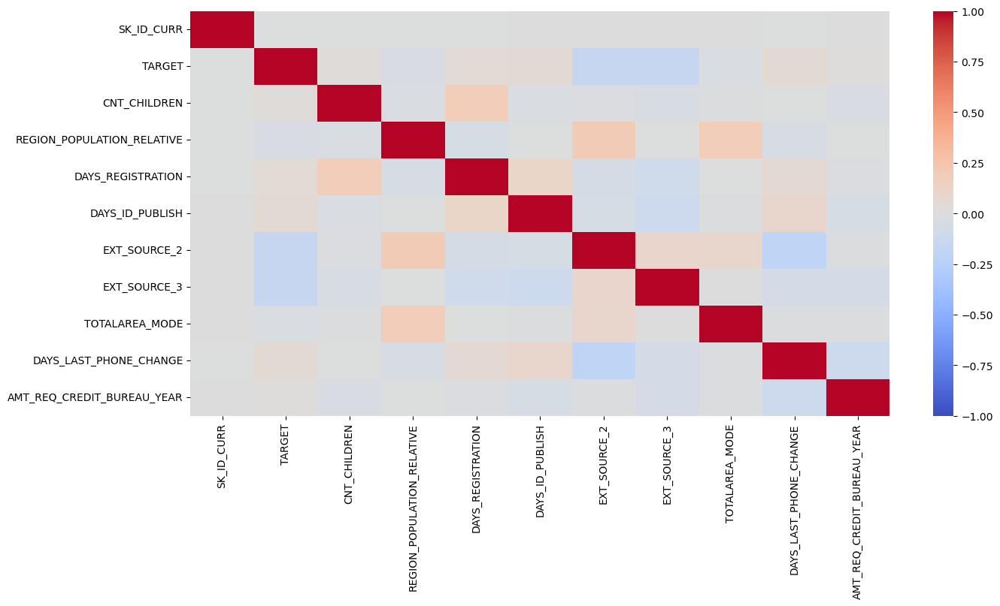

In [178]:
plt.figure(figsize=(15, 7)) 
sns.heatmap(df_train[num_cols_vif].corr(), cmap='coolwarm',vmin=-1,vmax=1)

### PhiK analysis of categorical columns

In [179]:
from scipy import stats
import phik
from phik import resources, report

In [180]:
cat_col_train

['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

In [181]:
col_phik = num_cols_vif + cat_col_train

In [182]:
col_phik

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'TOTALAREA_MODE',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'OCCUPATION_TYPE',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE']

interval columns not set, guessing: ['SK_ID_CURR', 'TARGET', 'CNT_CHILDREN', 'REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'TOTALAREA_MODE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_YEAR']


<AxesSubplot:>

Text(0.5, 1.0, 'Phik test for all features')

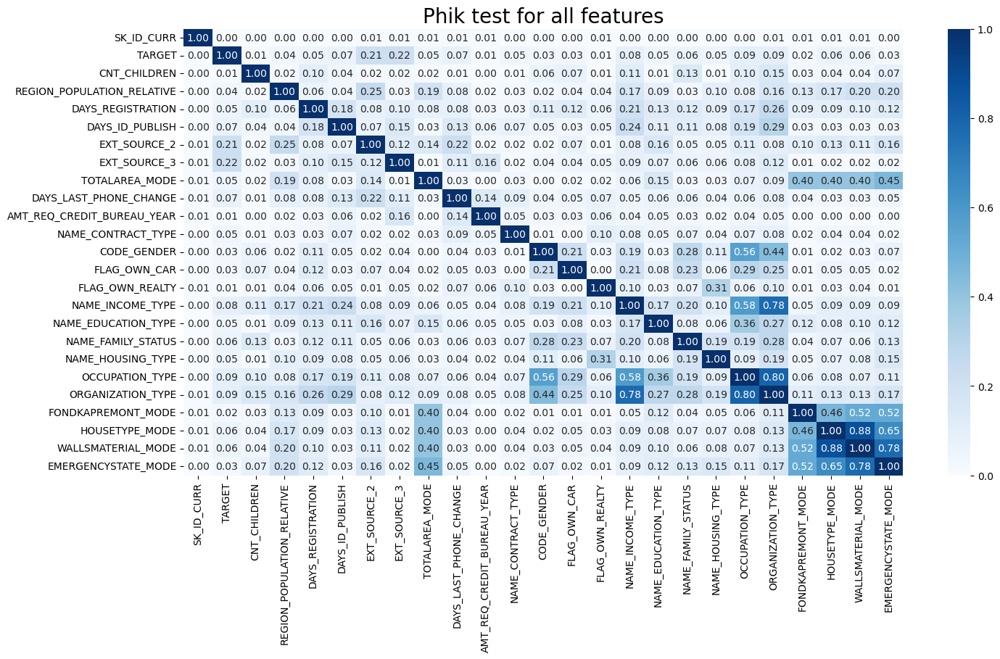

In [183]:
result = df_train[col_phik].phik_matrix()

fig = plt.figure(figsize=(16, 8))
sns.heatmap(result, annot=True, cmap='Blues', fmt=".2f")

plt.title('Phik test for all features', fontsize=20)
plt.show()

**ORGANIZATION_TYPE has high correlation with NAME_INCOME_TYPE and OCCUPATION_TYPE, and both ORGANIZATION_TYPE and OCCUPATION_TYPE have the same correlation with TARGET, so I will drop OCCUPATION_TYPE.**

**'FONDKAPREMONT_MODE', 'HOUSETYPE_MODE','WALLSMATERIAL_MODE','EMERGENCYSTATE_MODE' have high correlation with each other, while, FONDKAPREMONT_MODE and EMERGENCYSTATE_MODE have relative weak corr with TARGET, so I will drop these two columns.**

In [184]:
for col in ['OCCUPATION_TYPE','FONDKAPREMONT_MODE', 'EMERGENCYSTATE_MODE']:
    col_phik.remove(col)

In [185]:
col_phik

['SK_ID_CURR',
 'TARGET',
 'CNT_CHILDREN',
 'REGION_POPULATION_RELATIVE',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'TOTALAREA_MODE',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'ORGANIZATION_TYPE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE']

In [186]:
df_train_stat = df_train.loc[:, col_phik]

In [187]:
df_train_stat.info()

<class 'pandas.core.frame.DataFrame'>
Index: 246008 entries, 181648 to 285162
Data columns (total 22 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   SK_ID_CURR                  246008 non-null  int64  
 1   TARGET                      246008 non-null  int64  
 2   CNT_CHILDREN                246008 non-null  int64  
 3   REGION_POPULATION_RELATIVE  246008 non-null  float64
 4   DAYS_REGISTRATION           246008 non-null  float64
 5   DAYS_ID_PUBLISH             246008 non-null  int64  
 6   EXT_SOURCE_2                246008 non-null  float64
 7   EXT_SOURCE_3                246008 non-null  float64
 8   TOTALAREA_MODE              246008 non-null  float64
 9   DAYS_LAST_PHONE_CHANGE      246008 non-null  float64
 10  AMT_REQ_CREDIT_BUREAU_YEAR  246008 non-null  float64
 11  NAME_CONTRACT_TYPE          246008 non-null  object 
 12  CODE_GENDER                 246008 non-null  object 
 13  FLAG_OWN_CAR  

**Let's generate the new dataset with selected columns and save it**

In [188]:
# let save the dataset
df_train_stat.to_csv('df_train_filled_stat.csv', index = False)
df_train_stat.head()

,SK_ID_CURR,TARGET,CNT_CHILDREN,REGION_POPULATION_RELATIVE,DAYS_REGISTRATION,DAYS_ID_PUBLISH,EXT_SOURCE_2,EXT_SOURCE_3,TOTALAREA_MODE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_YEAR,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,ORGANIZATION_TYPE,HOUSETYPE_MODE,WALLSMATERIAL_MODE
181648,310536,0,2,0.008230,-6378.0,-4670,0.289573,0.622922,0.2197,0.0,1.0,Cash loans,F,N,N,Commercial associate,Higher education,Married,House / apartment,Business Entity Type 2,block of flats,Panel
229245,365516,0,0,0.003069,-1292.0,-1994,0.514261,0.510871,0.0688,-509.0,1.0,Cash loans,M,Y,Y,Commercial associate,Secondary / secondary special,Married,House / apartment,Other,unknown,unknown
122525,242055,1,0,0.020713,-7951.0,-2842,0.486906,0.598926,0.1269,-1474.0,2.0,Cash loans,M,N,Y,Working,Secondary / secondary special,Single / not married,House / apartment,Business Entity Type 3,block of flats,Panel
306311,454894,1,0,0.011703,-1033.0,-1345,0.675705,0.454321,0.0065,-2016.0,4.0,Cash loans,M,N,N,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,Business Entity Type 3,block of flats,Block
300658,448321,0,0,0.006629,-2873.0,-852,0.154565,0.510871,0.0688,-695.0,1.0,Cash loans,F,N,Y,Commercial associate,Incomplete higher,Single / not married,House / apartment,Restaurant,unknown,unknown


### Feature selection using Recursive Feature Elimination with cross validation (RFECV)

In [189]:
**First，we need to transform the categorical features.**

SyntaxError: invalid syntax (2876767393.py, line 1)

In [ ]:
# Count nemeric and categorical features
cat_col = [col for col in df_train_stat.columns if df[col].dtype == 'object']
num_col = [col for col in df_train_stat.columns if col not in cat_col]

# Count nemeric and categorical features
cat_col = [col for col in df_train_stat.columns if df[col].dtype == 'object']
num_col = [col for col in df_train_stat.columns if col not in cat_col]
print('cat_col : {} \n\
num_col : {}'.format(len(cat_col), len(num_col)))

In [ ]:
df_train_stat[cat_col].columns

In [ ]:
for col in df_train_stat[cat_col].columns:
    print(df_train_stat[col].unique())

**To encode the categorical data, we will use ordinal encoding for the 'NAME_EDUCATION_TYPE' column and dummy encoding for the rest of the columns.**

In [ ]:
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder

In [ ]:
encoder = OrdinalEncoder(categories=[['Higher education', 'Secondary / secondary special', 'Incomplete higher',
 'Lower secondary', 'Academic degree']])

In [ ]:
df_train_stat['NAME_EDUCATION_TYPE'] = encoder.fit_transform(df_train_stat[['NAME_EDUCATION_TYPE']])

In [ ]:
df_train_stat['NAME_EDUCATION_TYPE'].head()

In [ ]:
cat_col_temp = ['NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'NAME_INCOME_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'ORGANIZATION_TYPE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE']

In [ ]:
df_train_stat_dummy = pd.get_dummies(df_train_stat, columns=cat_col_temp)

In [ ]:
df_train_stat_dummy.head()

In [ ]:
y = df_train_stat_dummy['TARGET']
X = df_train_stat_dummy.drop('TARGET', axis = 1)

In [ ]:
# We need to normalize X first
from sklearn.preprocessing import StandardScaler
sd = StandardScaler()
X = pd.DataFrame(sd.fit_transform(X), 
                 columns=X.columns
                )

**Use LogisticRegression as estimator to select best set of features for modeling**

In [ ]:
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
import time

In [ ]:
start = time.time()
lgcw = LogisticRegression(class_weight = 'balanced',
                          random_state = 42
                         )

rfecv_cw = RFECV(estimator = lgcw,  step = 1, cv = 10)
rfecv_cw.fit(X, y)

end = time.time() 
print(f'This session took {(end - start) / 60} minutes.')

In [ ]:
print("Feature ranking: ", rfecv_cw.ranking_)

In [ ]:
# List of selected features
mask_rfecw = rfecv_cw.get_support()
features = X.columns
best_features = features[mask_rfecw]
 
print("All features: ", X.shape[1])
print(features)

print("Selected best: ", best_features.shape[0])
print(features[mask_rfecw]) 

In [ ]:
# plot n_features and cross_validation score
n_scores = len(rfecv_cw.cv_results_["mean_test_score"])
plt.figure()
plt.xlabel("Number of features selected")
plt.ylabel("Mean test accuracy")

plt.errorbar(
    range(1, n_scores + 1),
    rfecv_cw.cv_results_["mean_test_score"],
    yerr = rfecv_cw.cv_results_["std_test_score"],
            )

plt.title("Recursive Feature Elimination \nwith correlated features")
plt.show()  

**Final list of numerical and categorical features selected for modeling**

In [ ]:
# Count nemeric and categorical features

cat_feat = [col for col in df_train_stat.columns if df[col].dtype == 'object']
num_feat = [col for col in df_train_stat.columns if col not in cat_col]
print('Categorical Features: \n', cat_feat)
print('Numerical Features: \n', num_feat)

### Summary of EDA study

** Here is the summary of EDA analysis of both numerial and categorical features in the dataset**

- Features selected for final model
- Strategy to fillin missing values
- Strategy to encode categorical variable

**Table 1. Exploratory Data Analysis Summary of 17 Key Features**

| No. | Feature names               | Definition (unique value examples)                                                    | Missing (filling strategy) | Distribution | Encoding type |
|-----|-----------------------------|--------------------------------------------------------------------------------------|---------------------------|--------------|---------------|
| 1   | REGION_POPULATION_RELATIVE  | Normalized population of region where the client lives (higher number means the client lives in the more populated region) | No                        | Skewed       | -             |
| 2   | DAYS_REGISTRATION           | How many days before the application did the client change his registration          | No                        | Skewed       | -             |
| 3   | TOTALAREA_MODE              | Normalized information about the building where the client lives                     | 48% (Median)              | Skewed       | -             |
| 4   | DAYS_LAST_PHONE_CHANGE      | How many days before the application did the client change phone                      | <1% (Median)              | Skewed       | -             |
| 5   | AMT_REQ_CREDIT_BUREAU_YEAR  | Number of enquiries to Credit Bureau about the client one day per year (excluding last 3 months before application) | 14% (Median)              | Skewed       | -             |
| 6   | EX_SOURCE_3                 | Normalized score from an external data source                                         | 20% (Mean)                | Normal       | -             |
| 7   | NAME_CONTRACT_TYPE          | Contract product type of the previous application (Cash loan, Revolving loans)       | No                        | -            | Binary        |
| 8   | CODE_GENDER                 | Gender of the client                                                                  | No                        | -            | Binary        |
| 9   | FLAG_OWN_CAR                | Flag if the client owns a car                                                         | No                        | -            | Binary        |
| 10  | FLAG_OWN_REALTY             | Flag if the client owns a house or flat                                                | No                        | -            | Binary        |
| 11  | NAME_INCOME_TYPE            | Clients income type (Commercial associate, Working, Pensioner, State servant, Businessman, Unemployed, Student) | No                        | -            | Onehot        |
| 12  | NAME_EDUCATION_TYPE         | Level of highest education the client achieved (Higher education, Secondary/secondary special, Incomplete higher, Lower secondary) | No                        | -            | Ordinal       |
| 13  | NAME_FAMILY_STATUS          | Family status of the client (married, single/not married, separated, widow)          | No                        | -            | Onehot        |
| 14  | NAME_HOUSING_TYPE           | Type of housing (house/apartment, with parents, rented apartment)                     | No                        | -            | Onehot        |
| 15  | ORGANIZATION_TYPE           | Type of organization where client works (Agriculture, Business, Construction, self-employed) | No                        | -            | Binary        |
| 16  | HOUSETYPE_MODE              | Normalized information about building where the client lives*                        | 50% (unknown)             | -            | Onehot        |
| 17  | WALLSMATERIAL_MODE          | Normalized information about building where the client lives*                        | 47% (unknown)             | -            | Onehot        |


<a id="4"></a>
<h1 style="background-color:#16DCC9;font-family:Calibri;font-size:200%;text-align:left">Modelling</h1>

In [279]:
# Install the lightgbm library if not already installed
!pip install lightgbm

In [280]:
pip install --upgrade pandas --user

Note: you may need to restart the kernel to use updated packages.


In [281]:
# Import models and metrics lib
from sklearn.model_selection import KFold, RandomizedSearchCV, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier, RandomForestClassifier
import xgboost as xgb
from xgboost import XGBClassifier
import warnings

from sklearn import metrics
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, roc_curve, roc_auc_score
from sklearn.metrics import auc, roc_curve, f1_score, accuracy_score, recall_score, precision_score

## Preset a function for model evaluation

In [306]:
# A function for model evaluation
def report_loss_cf(name, model, X_train, y_train, X_test, y_test, graph = 0):
    
    print('Model performance for: ', name)
    
    def calculate_loss(model, X, y):
        pred = model.predict(X)
        pred_proba = model.predict_proba(X)

        accuracy = accuracy_score(y, pred)
        precision = precision_score(y, pred)
        recall = recall_score(y, pred)
        f1 = f1_score(y, pred)
        auc = roc_auc_score(y, pred_proba[:,1])
        fpr, tpr, _ = roc_curve(y, pred_proba[:,1])
        return pred, accuracy, precision, recall, f1, auc, fpr, tpr
    
    y_train_pred, accuracy_train, precision_train, recall_train, f1_train, auc_train, fpr_train, tpr_train = calculate_loss(
        model, X_train, y_train)
    print(f'train set accuracy: {accuracy_train:.3f}')
    print(f'train set precision: {precision_train:.3f}')
    print(f'train set recall: {recall_train:.3f}')
    print(f'train set f1 score: {f1_train:.3f}')
    print(f'training set AUC score: {auc_train:.3f}')
    print()
    
    y_test_pred, accuracy_test, precision_test, recall_test, f1_test, auc_test, fpr_test, tpr_test = calculate_loss(
        model, X_test, y_test)
    print(f'test set accuracy: {accuracy_test:.3f}')
    print(f'test set precision: {precision_test:.3f}')
    print(f'test set recall: {recall_test:.3f}')
    print(f'test set f1 score: {f1_test:.3f}')
    print(f'test set AUC score: {auc_test:.3f}')

    if graph == 0:
        return 

    elif graph == 1:
        
        fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (7, 3))
        cm_train = confusion_matrix(y_train, y_train_pred)
        cm_test = confusion_matrix(y_test, y_test_pred)
        
        sns.heatmap(cm_train, annot = True, cmap = "Blues", fmt = 'g', ax = ax1)
        ax1.set_title('train set')
        ax1.set_xlabel('Predicted labl')
        ax1.set_ylabel('True label')
        ax1.xaxis.set_ticklabels(['0', '1'])
        ax1.yaxis.set_ticklabels(['0', '1'])
        
        sns.heatmap(cm_test, annot = True, cmap = "Blues", fmt = 'g', ax = ax2)
        ax2.set_title('test set')
        ax2.set_xlabel('Predicted labl')
        ax2.set_ylabel('True label')
        ax2.xaxis.set_ticklabels(['0', '1'])
        ax2.yaxis.set_ticklabels(['0', '1'])
        plt.tight_layout()
        plt.show()
        
    #elif graph == 2:   
        
        plt.figure(figsize = (5,4))
        plt.plot([0,1], [0,1], linestyle = '--', label = 'random')
        plt.plot(fpr_train, tpr_train,label = "Train_AUC=" + str(auc_train.round(3)))
        plt.plot(fpr_test,tpr_test,label = "Test_AUC=" + str(auc_test.round(3)))
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.legend(loc = 4)
        plt.tight_layout()
        plt.show()

## Pipeline for Data Processing

In [320]:
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler, OneHotEncoder, StandardScaler, OrdinalEncoder

In [321]:
cat_col_final = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'ORGANIZATION_TYPE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE']
num_col_final = ['TARGET', 'REGION_POPULATION_RELATIVE','EXT_SOURCE_3', 'DAYS_REGISTRATION', 'TOTALAREA_MODE', 'DAYS_LAST_PHONE_CHANGE', 'AMT_REQ_CREDIT_BUREAU_YEAR']

In [322]:
# built up the prprocess pipeline to avoid data leakage

num_feat = ['REGION_POPULATION_RELATIVE', 'DAYS_REGISTRATION', 'TOTALAREA_MODE']
num_feat_median = ['DAYS_LAST_PHONE_CHANGE','AMT_REQ_CREDIT_BUREAU_YEAR','EXT_SOURCE_3']
num_feat_mode = ['DAYS_LAST_PHONE_CHANGE']

cat_feat_onehot = ['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'ORGANIZATION_TYPE', 'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE']
cat_feat_ordinal = ['NAME_EDUCATION_TYPE']

num_transformer = Pipeline(steps=[("scaler", StandardScaler())])


num_transformer_median = Pipeline(
    steps=[
        ("imputer_num", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler())
    ]
)

num_transformer_mode = Pipeline(
    steps=[("imputer_num", SimpleImputer(strategy="most_frequent")), 
           ("scaler", StandardScaler())]
)

cat_transformer_onehot = Pipeline(
    steps=[
        ("imputer", SimpleImputer(strategy="constant", fill_value="unknown")),
        ("onehot", OneHotEncoder(handle_unknown="ignore")),
        ("scaler", StandardScaler(with_mean=False))
    ]
)

cat_transformer_ordinal = Pipeline(
    steps=[
        ("ordinal", OrdinalEncoder(categories=[['Higher education', 'Secondary / secondary special', 'Incomplete higher',
 'Lower secondary', 'Academic degree']])),
        ("scaler", StandardScaler())
    ]
)

In [310]:
# construct the transformer objects above into a preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ("num", num_transformer, num_feat),
        ("num_median", num_transformer_median, num_feat_median),
        ("num_mode", num_transformer_mode, num_feat_mode),
        ("cat_onehot", cat_transformer_onehot, cat_feat_onehot),
        ("cat_ordinal", cat_transformer_ordinal, cat_feat_ordinal)
    ]
)

## Logistic Regression

In [323]:
# load the training data 
# Pipeline for Data Processing
df = pd.read_csv('application_train.csv')
for col in corr_columns:
     df[col] = df[col].interpolate(method='linear')
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.083300,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.083300,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.083300,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.014900,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.291700,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.291700,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.291700,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.071400,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.280336,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.280336,NaN,NaN,Na

In [324]:
# For Model Deployment

# Select the specified columns
clean_data = df[cat_col_final + num_col_final]

# Save the clean data to 'clean_data.csv'
clean_data.to_csv('clean_data.csv', index=False)

In [325]:
y = df['TARGET']
X = df[cat_col_final + num_col_final].drop('TARGET', axis = 1)

In [326]:
df['TOTALAREA_MODE'].isnull().sum()

0

In [315]:
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size = 0.2, 
                                                    stratify = y, 
                                                    random_state = 42
                                                   )

In [327]:
import time
from sklearn.linear_model import LogisticRegression

start = time.time()

steps=[("pre",preprocessor),        
       ("lr", LogisticRegression(class_weight = 'balanced'))]

lg = Pipeline(steps)
model_lg = lg.fit(X_train, y_train)

Model performance for:  Logistic Regression
train set accuracy: 0.656
train set precision: 0.141
train set recall: 0.642
train set f1 score: 0.232
training set AUC score: 0.704

test set accuracy: 0.653
test set precision: 0.139
test set recall: 0.637
test set f1 score: 0.229
test set AUC score: 0.704


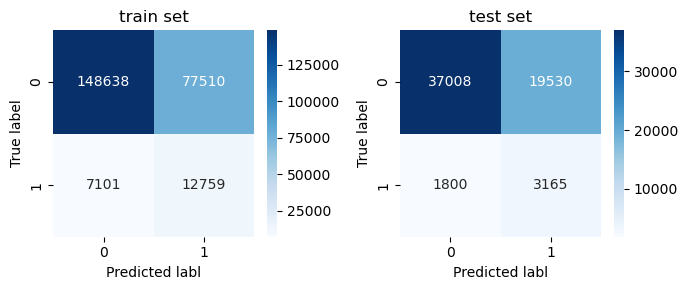

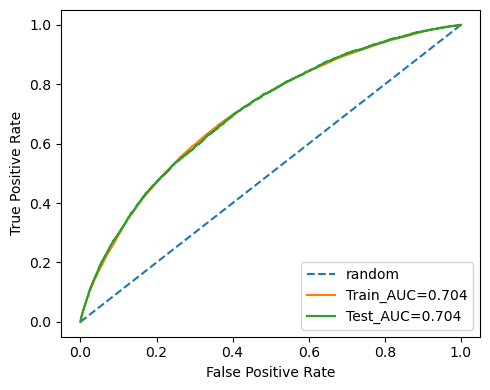

This model train session took 0.17986161311467488minutes.


In [317]:
report_loss_cf('Logistic Regression', model_lg, X_train, y_train, X_test, y_test, graph = 1)

end = time.time()
print(f'This model train session took {(end-start)/60}minutes.')

**Perform random search cross-validation**

In [318]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from scipy.stats import uniform

In [775]:
param_grid = {
    'lr__penalty': ['l1', 'l2'],
    'lr__C': [0.1, 1.0, 10],
    'lr__solver': ['liblinear', 'saga']
}

steps=[("pre",preprocessor),        
       ("lr", LogisticRegression(class_weight = 'balanced', max_iter=100000))]

random_search = RandomizedSearchCV(lg, param_distributions=param_grid, n_iter=10, cv=5, random_state=42)
random_search.fit(X_train, y_train)

# Retrieve the best hyperparameters and model
best_params = random_search.best_params_
best_model = random_search.best_estimator_

# Evaluate the model
train_score = best_model.score(X_train, y_train)
test_score = best_model.score(X_test, y_test)

print("Best Hyperparameters:", best_params)
print("Training Score:", train_score)
print("Testing Score:", test_score)

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('pre',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('scaler',
                                                                                                StandardScaler())]),
                                                                               ['REGION_POPULATION_RELATIVE',
                                                                                'DAYS_REGISTRATION',
                                                                                'TOTALAREA_MODE']),
                                                                              ('num_median',
                                                                               Pipeline(steps=[('imputer_num',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('scaler',
                                                                                                StandardScaler())]),
                                                                               ['DAYS_LAST_PHONE_CHANGE',
                                                                                'AMT...
                                                                                                OrdinalEncoder(categories=[['Higher '
                                                                                                                            'education',
                                                                                                                            'Secondary '
                                                                                                                            '/ '
                                                                                                                            'secondary '
                                                                                                                            'special',
                                                                                                                            'Incomplete '
                                                                                                                            'higher',
                                                                                                                            'Lower '
                                                                                                                            'secondary',
                                                                                                                            'Academic '
                                                                                                                            'degree']])),
                                                                                               ('scaler',
                                                                                                StandardScaler())]),
                                                                               ['NAME_EDUCATION_TYPE'])])),
                                             ('lr',
                                              LogisticRegression(class_weight='balanced'))]),
                   param_distributions={'lr__C': [0.1, 1.0, 10],
                                        'lr__penalty': ['l1', 'l2'],
                                        'lr__solver': ['liblinear', 'saga']},
                   random_state=42)

Best Hyperparameters: {'lr__solver': 'liblinear', 'lr__penalty': 'l1', 'lr__C': 0.1}
Training Score: 0.6561575233325746
Testing Score: 0.6533177243386501


**Perform BayesSearchCV to see if we can improve the performance**

In [778]:
# pip install scikit-optimize

Note: you may need to restart the kernel to use updated packages.Collecting scikit-optimize
     -------------------------------------- 100.3/100.3 kB 1.2 MB/s eta 0:00:00



In [328]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score
from skopt import BayesSearchCV

In [ ]:
param_grid = {
    'lr__penalty': ['l1', 'l2'],
    'lr__C': [0.1, 1.0, 10],
    'lr__solver': ['liblinear', 'saga']
}

# using BayesSearchCV to tune the parameters
steps=[("pre",preprocessor),        
       ("lr", LogisticRegression(class_weight = 'balanced', max_iter=10000))]

lg = Pipeline(steps)
bayes_cv = BayesSearchCV(lg, param_grid, cv=5, n_jobs=-1, random_state=42)

bayes_cv.fit(X_train, y_train)

In [ ]:
# Get the best hyperparameters
best_params = bayes_cv.best_params_
best_score = bayes_cv.best_score_
print(best_params)
print(best_score)

Model performance for:  Logistic Regression
train set accuracy: 0.656
train set precision: 0.141
train set recall: 0.642
train set f1 score: 0.232
training set AUC score: 0.704

test set accuracy: 0.653
test set precision: 0.139
test set recall: 0.637
test set f1 score: 0.229
test set AUC score: 0.704


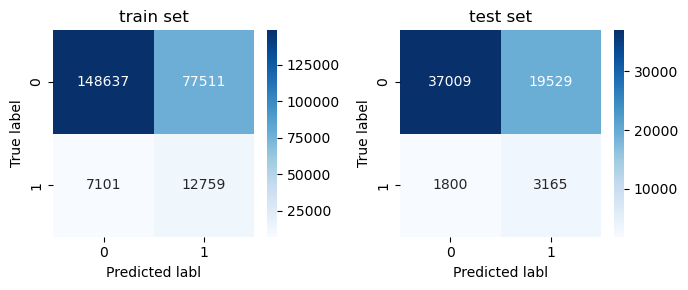

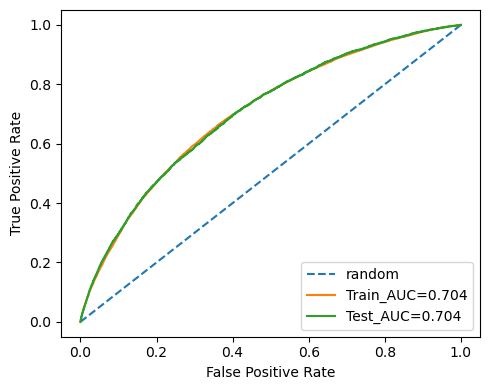

In [236]:
# Get the best model
steps=[("pre",preprocessor),        
       ("lr", LogisticRegression(class_weight = 'balanced', penalty='l1', solver='liblinear', C=10))]

lg_opt = Pipeline(steps)
model_lgopt = lg_opt.fit(X_train, y_train)

report_loss_cf('Logistic Regression', model_lgopt, X_train, y_train, X_test, y_test, graph = 1)

**plot the feature importance from this logistic regression model**

In [237]:
# Get the feature importances
importance = model_lgopt.named_steps['lr'].coef_[0]
indices = np.argsort(np.abs(importance))[::-1][:20] # <-- slice the indices array to show the first 20
feature_names = model_lgopt.named_steps['pre'].get_feature_names_out()[indices]
feature_names = [name[5:] for name in feature_names]  # Remove first 5 characters from each feature name
feature_names = [name[1:] if name.startswith('_') else name for name in feature_names]
importance = importance[indices]

# Set up the color map
cmap = plt.cm.get_cmap('coolwarm')

In [ ]:
#create a dataframe to store the feature names and their importance
feature_importance = pd.DataFrame({'feature': feature_names, 'importance': importance})

#sort the dataframe based on importance
feature_importance.sort_values(by = 'importance', ascending = False, inplace = True)

#plot the dataframe
plt.figure(figsize = (10, 6))
sns.barplot(x = 'importance', y = 'feature', data = feature_importance)
plt.title('Top 20 Feature Importances')
plt.show()

In [239]:
feature_importance

,feature,importance
1,nehot__ORGANIZATION_TYPE_XNA,0.632689
4,rdinal__NAME_EDUCATION_TYPE,0.151423
5,nehot__NAME_INCOME_TYPE_Working,0.137664
9,nehot__CODE_GENDER_M,0.090428
10,DAYS_REGISTRATION,0.082720
11,edian__DAYS_LAST_PHONE_CHANGE,0.079048
12,ode__DAYS_LAST_PHONE_CHANGE,0.070039
15,nehot__NAME_FAMILY_STATUS_Civil marriage,0.060470
17,nehot__NAME_FAMILY_STATUS_Single / not married,0.059151
19,nehot__HOUSETYPE_MODE_block of flats,-0.053233


### Top 20 Feature SHAP Values

In [790]:
!pip install shap --user

  Using cached shap-0.42.1-cp39-cp39-win_amd64.whl (462 kB)


In [792]:
!pip install numpy==1.21

     --------------------------------------- 14.0/14.0 MB 11.1 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.6
    Uninstalling numpy-1.21.6:
      Successfully uninstalled numpy-1.21.6


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
daal4py 2021.6.0 requires daal==2021.4.0, which is not installed.
tensorflow-intel 2.12.0 requires numpy<1.24,>=1.22, but you have numpy 1.21.0 which is incompatible.
pyldavis 3.4.1 requires numpy>=1.24.2, but you have numpy 1.21.0 which is incompatible.


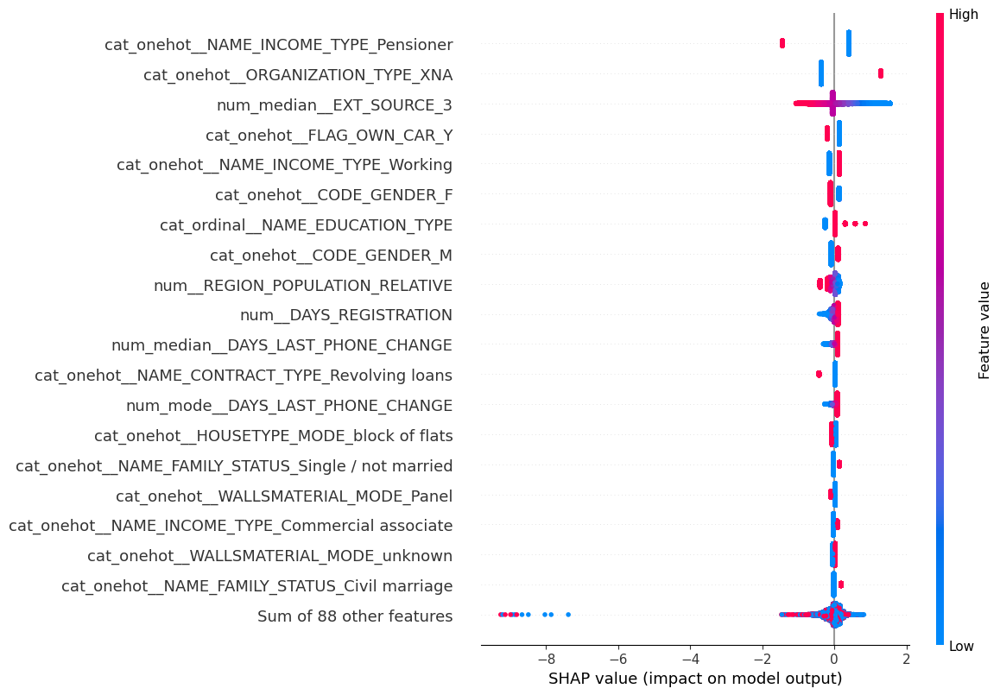

In [241]:
import shap
shap.initjs()

# Fit the preprocessor to the training data and transform it
X_train_preprocessed = preprocessor.fit_transform(X_train)

# Transform the test data using the preprocessor (do not fit again)
X_test_preprocessed = preprocessor.transform(X_test)

# Get the logistic regression model from the pipeline
logistic_model = lg_opt.named_steps['lr']

# Create the Independent masker using the transformed training data
masker = shap.maskers.Independent(X_train_preprocessed)

# Create the LinearExplainer using the logistic_model and the masker
explainer = shap.LinearExplainer(logistic_model, masker)

# Get the SHAP values for the test data
shap_values = explainer.shap_values(X_test_preprocessed)

# Plot the SHAP values
# 输出经过ColumnTransformer处理后的特征名称
feature_names = preprocessor.get_feature_names_out(input_features=X.columns)


explanation = shap.Explanation(values=shap_values, data=X_test_preprocessed, feature_names=feature_names)

# Create the beeswarm plot using the Explanation object
shap.plots.beeswarm(explanation, max_display=20)


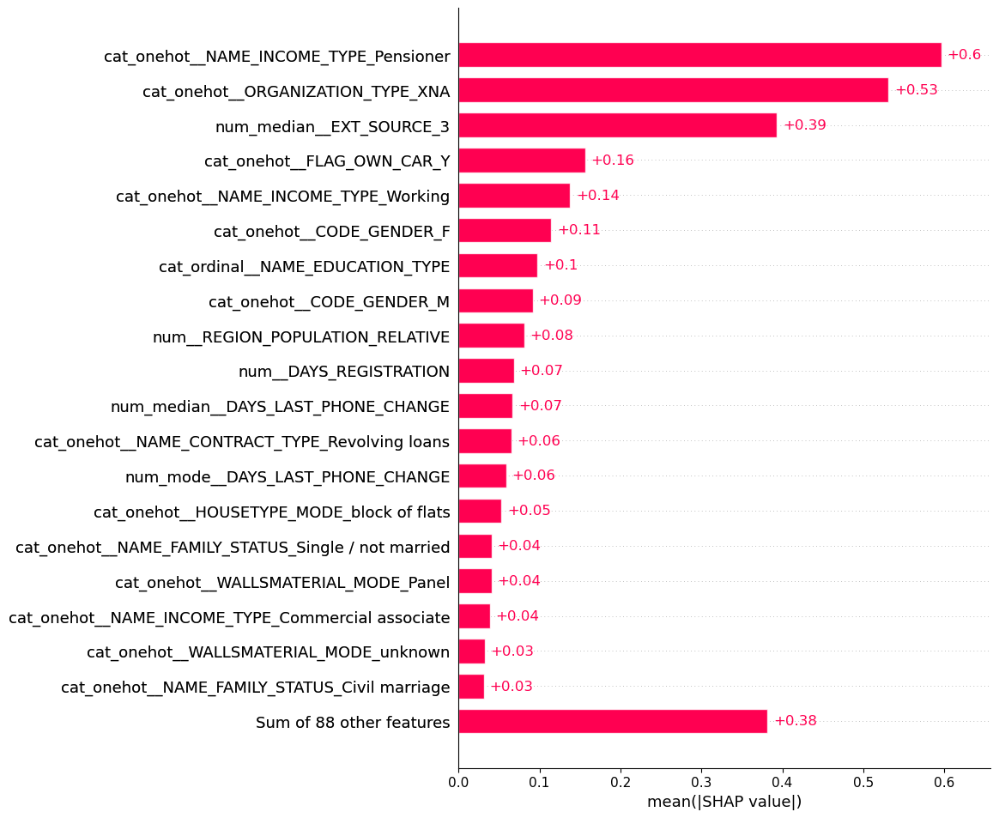

In [242]:
shap.plots.bar(explanation, max_display=20)


In [255]:
# generate pridiction from model 1 (logistic regression) and output the results to LG_results.csv
pred_y = pd.DataFrame(model_lgopt.predict_proba(X)[:,1])
pred_y.columns = ['Predicted Probability']
pred_y.to_csv('LG_results.csv',index=False, header =False)

df_new=df.copy()
df_new['Predicted Probability'] = pred_y*100
df_new.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,Predicted Probability
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.083300,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.083300,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.083300,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.014900,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,84.489726
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.291700,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.291700,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.291700,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.071400,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,31.913158
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.280336,NaN,NaN,NaN,NaN,NaN,NaN,NaN,N

In [256]:
# use numpy to categorize the values into three tiers
df_new['Tier'] = np.where(df_new['Predicted Probability'] < 30, 'D',
                 np.where(df_new['Predicted Probability'] < 50, 'C', 
                 np.where(df_new['Predicted Probability'] < 80, 'B','A')))

# print the results
df_new.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,Predicted Probability,Tier
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.083300,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.083300,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.083300,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.014900,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0,84.489726,A
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.291700,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.291700,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.291700,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.071400,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,31.913158,C
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.280336,NaN,NaN,NaN,NaN,NaN,

In [257]:
df_new[['TARGET','Tier']].head()

,TARGET,Tier
0,1,A
1,0,C
2,0,C
3,0,B
4,0,B


In [258]:
print(lg.named_steps.keys())

dict_keys(['pre', 'lr'])


**Plot precision_recall_curve and threshold curve of X-test**

Text(0.5, 0, 'Recall')

Text(0, 0.5, 'Precision')

Text(0.5, 1.0, 'Precision-Recall Curve')

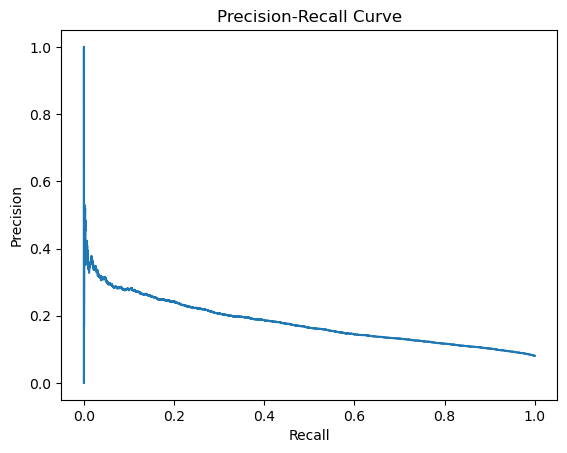

Text(0.5, 0, 'Threshold')

Text(0, 0.5, 'Score')

Text(0.5, 1.0, 'Threshold Plot')

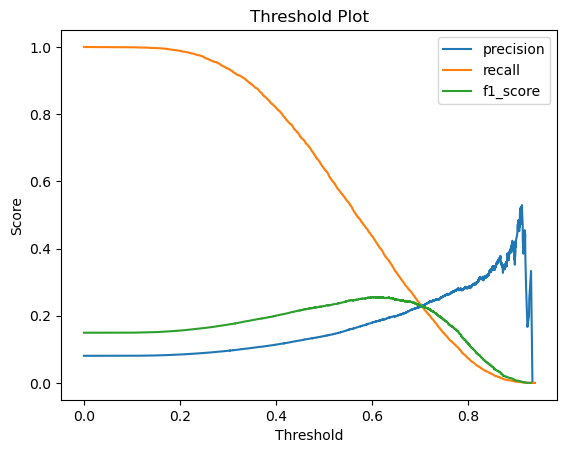

In [260]:
from sklearn.metrics import precision_recall_curve

# get predicted probabilities for the positive class
y_proba = model_lgopt.predict_proba(X_test)[:, 1]

# compute precision and recall for different probability thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_proba)

# plot precision-recall curve
plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# plot threshold plot
f1_score = 2 * (precision * recall) / (precision + recall)
plt.plot(thresholds, precision[:-1], label='precision')
plt.plot(thresholds, recall[:-1], label='recall')
plt.plot(thresholds, f1_score[:-1], label='f1_score')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.legend(loc='best')
plt.title('Threshold Plot')
plt.show()

### Summary for logisitic regression
The model seems to perform decently well, with a training accuracy of 65.6% and a testing accuracy of 65.3%. The precision and recall values are also quite similar between the training and testing sets, indicating that the model is not overfitting. The AUC scores for both the training and testing sets are quite good, indicating that the model has good discriminative power.

The top three variables in the logistic regression model are:

- NAME_INCOME_TYPE_Pensioner	
- ORGANIZATION_TYPE_XNA	
- EXT_SOURCE_3

These variables were found to be the most important predictors of the outcome variable based on the logistic regression model. Understanding the relative importance of these variables can help inform business decisions related to lead generation and conversion.

## XGBoost (Treed based model)

In [261]:
from xgboost import XGBClassifier
from sklearn.metrics import f1_score

# define the pipeline

Model performance for:  XGBoost
train set accuracy: 0.921
train set precision: 0.886
train set recall: 0.021
train set f1 score: 0.040
training set AUC score: 0.788

test set accuracy: 0.919
test set precision: 0.505
test set recall: 0.010
test set f1 score: 0.020
test set AUC score: 0.710


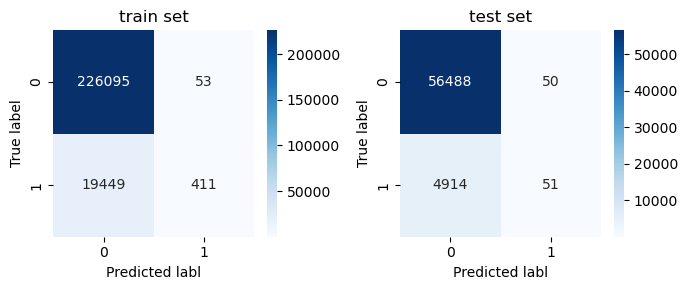

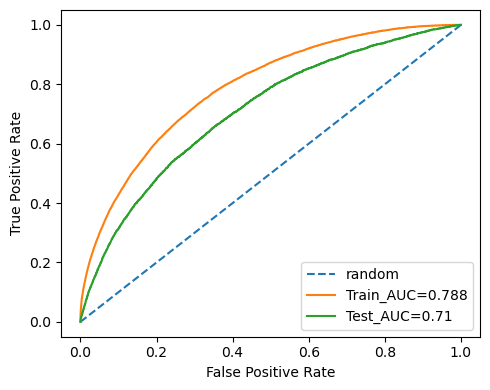

In [262]:
start = time.time()

steps=[("pre",preprocessor),        
       ("xgb", XGBClassifier(random_state=42))]

xgb = Pipeline(steps)
model_xgb = xgb.fit(X_train, y_train)

# fit the pipeline to the training data
model_xgb = xgb.fit(X_train, y_train)

report_loss_cf('XGBoost', model_xgb, X_train, y_train, X_test, y_test, graph = 1)

In [270]:
import time
start = time.time()

steps = [("pre", preprocessor),            
         ("Ensemble", XGBClassifier(random_state=42))]

model = Pipeline(steps)

params = {'Ensemble__n_estimators' : np.arange(20,110,10),
          'Ensemble__max_depth': np.arange(2,12,2),
          'Ensemble__min_samples_split' : [2,4,6,8,10,20,40],
          'Ensemble__min_samples_leaf' : [1,5,10,20],
          'Ensemble__max_features': ['sqrt', 'log2'],
         }

model_xgb = RandomizedSearchCV(model,
                        params,
                        n_iter=50,
                        cv=5,
                        n_jobs=-1,
                        scoring='roc_auc')


end = time.time()

In [ ]:
print(model_xgb.best_params_)
print(model_xgb.best_score_)
print(f'This random search session took {(end-start)/60} minutes.')

In [ ]:
report_loss_cf('XGBoost', model_xgb, X_train, y_train, X_test, y_test, graph = 1)

## Random Forest (Treed based model)

In [268]:
steps = [("pre", preprocessor),            
         ("Ensemble", RandomForestClassifier(class_weight='balanced',random_state = 42))]

model = Pipeline(steps)

params = {'Ensemble__n_estimators' : np.arange(20,110,10),
          'Ensemble__max_depth': np.arange(2,12,2),
          'Ensemble__min_samples_split' : [2,4,6,8,10,20,40,60],
          'Ensemble__min_samples_leaf' : [1,5,10,20],
          'Ensemble__max_features': ['sqrt', 'log2'],
         }

rs = RandomizedSearchCV(model,
                        params,
                        n_iter=50,
                        cv=5,
                        n_jobs=-1,
                        scoring='roc_auc')

rs.fit(X_train, y_train)

end = time.time()

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('pre',
                                              ColumnTransformer(transformers=[('num',
                                                                               Pipeline(steps=[('scaler',
                                                                                                StandardScaler())]),
                                                                               ['REGION_POPULATION_RELATIVE',
                                                                                'DAYS_REGISTRATION',
                                                                                'TOTALAREA_MODE']),
                                                                              ('num_median',
                                                                               Pipeline(steps=[('imputer_num',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('scaler',
                                                                                                StandardScaler())]),
                                                                               ['DAYS_LAST_PHONE_CHANGE',
                                                                                'AMT...
                                              RandomForestClassifier(class_weight='balanced',
                                                                     random_state=42))]),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'Ensemble__max_depth': array([ 2,  4,  6,  8, 10]),
                                        'Ensemble__max_features': ['sqrt',
                                                                   'log2'],
                                        'Ensemble__min_samples_leaf': [1, 5, 10,
                                                                       20],
                                        'Ensemble__min_samples_split': [2, 4, 6,
                                                                        8, 10,
                                                                        20, 40,
                                                                        60],
                                        'Ensemble__n_estimators': array([ 20,  30,  40,  50,  60,  70,  80,  90, 100])},
                   scoring='roc_auc')

In [ ]:
print(model_xgb.best_params_)
print(model_xgb.best_score_)
print(f'This random search session took {(end-start)/60} minutes.')

In [ ]:
# get predicted probabilities for the positive class
y_proba = rs.predict_proba(X_test)[:, 1]

# compute precision and recall for different probability thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_proba)

# plot precision-recall curve
plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# plot threshold plot
f1_score = 2 * (precision * recall) / (precision + recall)
plt.plot(thresholds, precision[:-1], label='precision')
plt.plot(thresholds, recall[:-1], label='recall')
plt.plot(thresholds, f1_score[:-1], label='f1_score')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.legend(loc='best')
plt.title('Threshold Plot')
plt.show()

In [ ]:
# Get the best model
steps = [("pre", preprocessor),            
         ("Ensemble", RandomForestClassifier(class_weight='balanced',
                                             n_estimators = 100, 
                                             min_samples_split = 2, 
                                             min_samples_leaf = 10,
                                             max_features = 'log2', 
                                             max_depth = 2,
                                             random_state = 42))]

rf_opt = Pipeline(steps)
model_rfopt = rf_opt.fit(X_train, y_train)

In [ ]:
report_loss_cf('Random Forest', model_rfopt, X_train, y_train, X_test, y_test, graph = 1)

## LightGBM (Treed based model)

In [ ]:
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import precision_recall_curve

import lightgbm as lgb
from sklearn.pipeline import Pipeline

# Define the pipeline
steps = [("pre", preprocessor),
         ("Ensemble", lgb.LGBMClassifier(class_weight='balanced', random_state=42))]

model = Pipeline(steps)

# Define the parameter grid for RandomizedSearchCV
params = {
    'Ensemble__n_estimators': np.arange(20, 110, 10),
    'Ensemble__max_depth': np.arange(2, 12, 2),
    'Ensemble__num_leaves': [10, 20, 30],
    'Ensemble__learning_rate': [0.05, 0.1, 0.2],
    'Ensemble__colsample_bytree': [0.6, 0.8, 1.0],
    'Ensemble__subsample': [0.6, 0.8, 1.0],
}

# Perform randomized search
rs = RandomizedSearchCV(model,
                        params,
                        n_iter=50,
                        cv=5,
                        n_jobs=-1,
                        scoring='roc_auc')

start = time.time()
rs.fit(X_train, y_train)
end = time.time()

print(rs.best_params_)
print(rs.best_score_)
print(f'This random search session took {(end-start)/60} minutes.')

# Get predicted probabilities for the positive class
y_proba = rs.predict_proba(X_test)[:, 1]

# Compute precision and recall for different probability thresholds
precision, recall, thresholds = precision_recall_curve(y_test, y_proba)

# Plot precision-recall curve
plt.plot(recall, precision)
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.show()

# Plot threshold plot
f1_score = 2 * (precision * recall) / (precision + recall)
plt.plot(thresholds, precision[:-1], label='precision')
plt.plot(thresholds, recall[:-1], label='recall')
plt.plot(thresholds, f1_score[:-1], label='f1_score')
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.legend(loc='best')
plt.title('Threshold Plot')
plt.show()

# Get the best model
steps = [("pre", preprocessor),
         ("Ensemble", lgb.LGBMClassifier(class_weight='balanced',
                                         n_estimators=100,
                                         max_depth=2,
                                         num_leaves=10,
                                         learning_rate=0.1,
                                         colsample_bytree=0.8,
                                         subsample=0.8,
                                         random_state=42))]

rf_opt = Pipeline(steps)
model_rfopt = rf_opt.fit(X_train, y_train)

report_loss_cf('Random Forest', model_rfopt, X_train, y_train, X_test, y_test, graph=1)

## The loss function of max profit

〖𝑃𝑟𝑜𝑓𝑖𝑡=𝑇𝐹 ∗𝑙𝑜𝑎𝑛 𝑎𝑚𝑜𝑢𝑛𝑡 ∗{〖 [1+𝑟2/12] 〗^(30∗12 )−[1+𝑟1/12] 〗^(30∗12 )}   
                    −𝐹𝑁∗1/2∗𝑙𝑜𝑎𝑛 𝑎𝑚𝑜𝑢𝑛𝑡 
                    −𝐹𝑃〖∗𝑙𝑜𝑎𝑛 𝑎𝑚𝑜𝑢𝑛𝑡 ∗{〖 [1+𝑟2/12] 〗^(30∗12 )−[1+𝑟1/12] 〗^(30∗12 )}   


**Plot precision_recall_curve and threshold curve of X-test**

In [ ]:
# Make predictions on the test data
y_pred_prob = model_lgopt.predict_proba(X_test)[:, 1]  # Probabilities of positive class

# Define an array of thresholds
thresholds = np.linspace(0, 1, 100)

profits = []
for threshold in thresholds:
    y_pred = (y_pred_prob >= threshold).astype(int)  # Convert probabilities to binary predictions
    
    # Calculate TP, FN, FP and profit for each customer
    profit = 0
    for i in range(len(X_test)):
        actual_status = y_test.iloc[i]
        predicted_status = y_pred[i]
        loan_amount = X_test_profit["AMT_CREDIT"].iloc[i]  # Assuming "AMT_Credit" is the column name for loan amount
        
        if actual_status == 0 and predicted_status == 0:
            profit += loan_amount * ((1 + 0.06837/12) ** (30*12) - (1 + 0.055/12) ** (30*12))
        elif actual_status == 1 and predicted_status == 0:
            profit -= loan_amount / 2
        elif actual_status == 0 and predicted_status == 1:
            profit -= loan_amount * ((1 + 0.06837/12) ** (30*12) - (1 + 0.055/12) ** (30*12))
        elif actual_status == 1 and predicted_status == 1:
            profit += loan_amount / 2
    
    profits.append(profit)
import seaborn as sns

# Plot the profit curve
plt.figure(figsize=(10, 6))
sns.lineplot(x=thresholds, y=profits)  # Specify x and y variables
plt.xlabel("Threshold")
plt.ylabel("Profit")
plt.title("Profit Curve")
plt.grid(True)

# Find the index of the maximum profit
max_profit_index = np.argmax(profits)
max_profit_threshold = thresholds[max_profit_index]
max_profit = profits[max_profit_index]

# Mark the peak as 'Max Profit' using a star symbol
plt.plot(max_profit_threshold, max_profit, marker='*', markersize=10, color='red')
plt.axvline(x=max_profit_threshold, color='gray', linestyle='--')
plt.text(max_profit_threshold, max_profit, f"Max Profit: {max_profit}", 
         va='bottom', ha='right', color='blue')

In [ ]:
elif actual_status == 1 and predicted_status == 1:
            profit += loan_amount / 2
# We can consider that identifing bad loan can aviod the finicial loss

**Form the profit - threshold curve to find the max profit.**
- Discussed and conducted visualizations to subject matter expertise

In [ ]:
y = df['TARGET']
X = df[cat_col_final + num_col_final].drop('TARGET', axis = 1)

In [ ]:
X_profit = X.copy()
X_profit['AMT_CREDIT'] = df['AMT_CREDIT']

In [ ]:
X_profit.columns

In [ ]:
X_train, X_test_profit, y_train, y_test = train_test_split(X_profit, y, 
                                                    test_size = 0.2, 
                                                    stratify = y, 
                                                    random_state = 42
                                                   )

In [ ]:
X_test = X_test_profit.copy().drop('AMT_CREDIT', axis = 1)

In [ ]:
X_test.columns

In [ ]:
X_test_profit.columns

In [ ]:
steps=[("pre",preprocessor),        
       ("lr", LogisticRegression(class_weight = 'balanced', penalty='l1', solver='liblinear', C=0.1))]

lg_opt = Pipeline(steps)
model_lgopt = lg_opt.fit(X_train, y_train)

report_loss_cf('Logistic Regression', model_lgopt, X_train, y_train, X_test, y_test, graph = 1)

In [ ]:
X_test_profit["AMT_CREDIT"].iloc[0]

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming you have already trained and fitted your logistic regression model


# Make predictions on the test data
y_pred_prob = model_lgopt.predict_proba(X_test)[:, 1]  # Probabilities of positive class

# Define an array of thresholds
thresholds = np.linspace(0, 1, 100)

profits = []
for threshold in thresholds:
    y_pred = (y_pred_prob >= threshold).astype(int)  # Convert probabilities to binary predictions
    
    # Calculate TP, FN, FP and profit for each customer
    profit = 0
    for i in range(len(X_test)):
        actual_status = y_test.iloc[i]
        predicted_status = y_pred[i]
        loan_amount = X_test_profit["AMT_CREDIT"].iloc[i]  # Assuming "AMT_Credit" is the column name for loan amount
        
        if actual_status == 0 and predicted_status == 0:
            profit += loan_amount * ((1 + 0.06837/12) ** (30*12) - (1 + 0.055/12) ** (30*12))
        elif actual_status == 1 and predicted_status == 0:
            profit -= loan_amount*(1 + 0.055/12) ** (30*12)
      
    
    profits.append(profit)
import seaborn as sns

# Plot the profit curve
plt.figure(figsize=(10, 6))
sns.lineplot(x=thresholds, y=profits)  # Specify x and y variables
plt.xlabel("Threshold")
plt.ylabel("Profit")
plt.title("Profit Curve")
plt.grid(True)

# Find the index of the maximum profit
max_profit_index = np.argmax(profits)
max_profit_threshold = thresholds[max_profit_index]
max_profit = profits[max_profit_index]

# Mark the peak as 'Max Profit' using a star symbol
plt.plot(max_profit_threshold, max_profit, marker='*', markersize=10, color='red')
plt.axvline(x=max_profit_threshold, color='gray', linestyle='--')
plt.text(max_profit_threshold, max_profit, f"Max Profit: {max_profit}", 
         va='bottom', ha='right', color='blue')

In [ ]:
from imblearn.over_sampling import SMOTE

# Instantiate SMOTE object
smote = SMOTE(sampling_strategy='auto', random_state=42)

# Resample the test data using SMOTE
X_test_resampled, y_test_resampled = smote.fit_resample(X_test, y_test)

# Combine the original test data and the resampled data
X_test_balanced = np.vstack((X_test, X_test_resampled))
y_test_balanced = np.hstack((y_test, y_test_resampled))

In [ ]:
import matplotlib.pyplot as plt

models = ['Logistic Regression', 'XGBoost', 'Random Forest']
accuracies = [0.681, 0.919, 0.702]
colors = ['lightpink', 'lightblue', 'lightgreen']

plt.bar(models, accuracies, color=colors)
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison of Different Models')

plt.show()


In [ ]:
import matplotlib.pyplot as plt

models = ['Logistic Regression', 'XGBoost', 'Random Forest']
precisions = [0.155, 0.457, 0.161]
colors = ['lightpink', 'lightblue', 'lightgreen']

plt.bar(models, precisions, color=colors)
plt.xlabel('Models')
plt.ylabel('Precision')
plt.title('Precision Comparison of Different Models')

plt.show()


In [ ]:
import matplotlib.pyplot as plt

models = ['Logistic Regression', 'XGBoost', 'Random Forest']
f1_scores = [0.251, 0.015, 0.257]
colors = ['lightpink', 'lightblue', 'lightgreen']

plt.bar(models, f1_scores, color=colors)
plt.xlabel('Models')Confusion Matrix
plt.ylabel('F1 Score')
plt.title('F1 Score Comparison of Different Models')

plt.show()


In [ ]:
import matplotlib.pyplot as plt

models = ['Logistic Regression', 'XGBoost', 'Random Forest']
auc_values = [0.732, 0.738, 0.730]
colors = ['lightpink', 'lightblue', 'lightgreen']

plt.bar(models, auc_values, color=colors)
plt.xlabel('Models')
plt.ylabel('AUC')
plt.title('AUC Comparison of Different Models')

plt.show()


### Guassian Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB
import time

start = time.time()

steps = [("pre", preprocessor),
         ("gnb", GaussianNB())]


gnb = Pipeline(steps)
model_gnb = gnb.fit(X_train, y_train)

In [ ]:
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,roc_auc_score,roc_curve,confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

report_loss_cf('Logistic Regression', model_lg, X_train, y_train, X_test, y_test, graph = 1)

end = time.time()
print(f'This model train session took {(end-start)/60}minutes.')

In [ ]:
from sklearn.base import BaseEstimator

class MajorityClassifier(BaseEstimator):
    def __init__(self):
        self.majority_class = None

    def fit(self, X, y):
        # Find the majority class
        self.majority_class = max(set(y), key=y.tolist().count)
        return self

    def predict(self, X):
        # Predict the majority class for all instances
        return [self.majority_class] * len(X)

In [ ]:
import time

start = time.time()

majority_model = MajorityClassifier()
majority_model.fit(X_train, y_train)
predictions = majority_model.predict(X_test)

In [ ]:
# A function for model evaluation
def report_loss_cf(name, model, X_train, y_train, X_test, y_test, graph = 0):
    
    print('Model performance for: ', name)
def calculate_loss(model, X, y):
    pred = model.predict(X)
    accuracy = accuracy_score(y, pred)
    precision = precision_score(y, pred)
    recall = recall_score(y, pred)
    f1 = f1_score(y, pred)
    auc = roc_auc_score(y, pred)
    return pred, accuracy, precision, recall, f1, auc
    
    y_train_pred, accuracy_train, precision_train, recall_train, f1_train, auc_train, fpr_train, tpr_train = calculate_loss(
        model, X_train, y_train)
    print(f'train set accuracy: {accuracy_train:.3f}')
    print(f'train set precision: {precision_train:.3f}')
    print(f'train set recall: {recall_train:.3f}')
    print(f'train set f1 score: {f1_train:.3f}')
    print(f'training set AUC score: {auc_train:.3f}')
    print()
    
    y_test_pred, accuracy_test, precision_test, recall_test, f1_test, auc_test, fpr_test, tpr_test = calculate_loss(
        model, X_test, y_test)
    print(f'test set accuracy: {accuracy_test:.3f}')
    print(f'test set precision: {precision_test:.3f}')
    print(f'test set recall: {recall_test:.3f}')
    print(f'test set f1 score: {f1_test:.3f}')
    print(f'test set AUC score: {auc_test:.3f}')

    if graph == 0:
        return 

    elif graph == 1:
        
        fig, (ax1, ax2) = plt.subplots(ncols = 2, figsize = (7, 3))
        cm_train = confusion_matrix(y_train, y_train_pred)
        cm_test = confusion_matrix(y_test, y_test_pred)
        
        sns.heatmap(cm_train, annot = True, cmap = "Blues", fmt = 'g', ax = ax1)
        ax1.set_title('train set')
        ax1.set_xlabel('Predicted labl')
        ax1.set_ylabel('True label')
        ax1.xaxis.set_ticklabels(['0', '1'])
        ax1.yaxis.set_ticklabels(['0', '1'])
        
        sns.heatmap(cm_test, annot = True, cmap = "Blues", fmt = 'g', ax = ax2)
        ax2.set_title('test set')
        ax2.set_xlabel('Predicted labl')
        ax2.set_ylabel('True label')
        ax2.xaxis.set_ticklabels(['0', '1'])
        ax2.yaxis.set_ticklabels(['0', '1'])
        plt.tight_layout()
        plt.show()
        
    #elif graph == 2:   
        
        plt.figure(figsize = (5,4))
        plt.plot([0,1], [0,1], linestyle = '--', label = 'random')
        plt.plot(fpr_train, tpr_train,label = "Train_AUC=" + str(auc_train.round(3)))
        plt.plot(fpr_test,tpr_test,label = "Test_AUC=" + str(auc_test.round(3)))
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.legend(loc = 4)
        plt.tight_layout()
        plt.show()

In [ ]:
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score,roc_auc_score,roc_curve,confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

report_loss_cf('Majority Classifier', majority_model, X_train, y_train, X_test, y_test, graph = 1)

end = time.time()
print(f'This model train session took {(end-start)/60}minutes.')

In [ ]:
from sklearn.metrics import confusion_matrix

# Predict on the test set using the majority classifier
y_pred_majority = majority_model.predict(X_test)

# Compute the confusion matrix
cm_majority = confusion_matrix(y_test, y_pred_majority)

print("Confusion Matrix:")
print(cm_majority)

Confusion Matrix:
[[56538     0]
 [ 4965     0]]

* TN=56538,FN=4965, default rate= FN/(TN+FN)=4965/(56538+4965)=0.080727=8% for benchmark model

In [ ]:
#confusion matrix for 
from sklearn.metrics import confusion_matrix

# Make predictions on the test set
y_pred = model_lgopt.predict(X_test)

# Compute the confusion matrix
cm = confusion_matrix(y_test, y_pred)

print("Confusion Matrix:")
print(cm)

Confusion Matrix:
[[37015 19523]
 [ 1799  3166]]

In [ ]:
# Get predicted probabilities
y_test_pred_proba = model_lgopt.predict_proba(X_test)[:, 1]  # Positive class probabilities

# Set the desired threshold
threshold = 0.8585858585858587

# Update predictions based on the threshold
y_test_pred = (y_test_pred_proba >= threshold).astype(int)

# Compute the confusion matrix
cm = confusion_matrix(y_test, y_test_pred)

print("Confusion Matrix:")
print(cm)


Confusion Matrix:
[[56358   180]
 [ 4866    99]]

#Let's interpret the values in the confusion matrix:

- True Negative (TN): The number of observations that are actually negative (class 0) and are correctly predicted as negative. In this case, the value is 37015.
- False Positive (FP): The number of observations that are actually negative (class 0) but are incorrectly predicted as positive. In this case, the value is 19523.
- False Negative (FN): The number of observations that are actually positive (class 1) but are incorrectly predicted as negative. In this case, the value is 1799.
- True Positive (TP): The number of observations that are actually positive (class 1) and are correctly predicted as positive. In this case, the value is 3166.

In summary, the confusion matrix indicates that:

37015 instances are correctly classified as negative (class 0) and 19523 instances are incorrectly classified as positive (class 1).
3166 instances are correctly classified as positive (class 1) and 1799 instances are incorrectly classified as negative (class 0).
Default Rate= FN/(TN+FN)=1799/(1799+37015)=0.046=4.8%

**Default rate has decreased from 8% to 4.8%**

theshold for logistic regression is 0.9393939393939394.

In [ ]:
# Get predicted probabilities for test data
y_test_pred_proba = model_lgopt.predict_proba(X_test)[:, 1]  # Positive class probabilities

# Update predictions based on the threshold
y_test_pred = (y_test_pred_proba >= threshold).astype(int)

# Calculate confusion matrix for test data
confusion_matrix_test = confusion_matrix(y_test, y_test_pred)

# Print the confusion matrix for test data
print("Confusion Matrix for Test Data:")
print(confusion_matrix_test)

Confusion Matrix for Test Data:
[[56538     0]
 [ 4965     0]]

True Negative (TN): 56358
False Positive (FP): 180
False Negative (FN): 4866
True Positive (TP): 99
Default Rate=FN/(TN+FN)=4866/(56358+4866)=7.9%

**The End, thank you!**